In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pylab as plt
import seaborn as sns

from sklearn.model_selection  import train_test_split
from sklearn.tree import DecisionTreeClassifier   # Import Decision Tree Classifier

from sklearn.tree import DecisionTreeRegressor 
from sklearn.metrics import classification_report
import sklearn.metrics
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

from sklearn.naive_bayes import GaussianNB

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_absolute_error

import pandas_profiling

from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

In [15]:
new_data = pd.read_csv('C:/Users/MMQuant/Desktop/GME II/notebooks/AI_CUST2020_RAND_200K_NEWEST.csv')
new_data = new_data.drop(['Unnamed: 0'], axis=1)
new_data.head()

C:\Users\MMQuant\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2718: DtypeWarning: Columns (68,69,70,71,72,76,77,78,79,80,87,89) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Customer_ID,Date_First_Purchase_2020,Date_Last_Purchase_2020,number_of_orders_2020,UniqueSKU_ordered_2020,Sales_Amt_2020,Sales_Qty_2020,Discount_Amt_2020,Margin_Amt_2020,HasMobileChannelTrx,...,Current_Segment,Total_Transaction_Count,Points_Earned_Till_Date,City,State,Country_Code,RFM_Segment_Start,RFM_descr_Start,RFM_Segment_End,RFM_desrc_End
0,1106983492,2020-06-25,2020-06-25,1,2,49.98,2.0,5.00,23.61,0,...,NaN,NaN,34938.0,NaN,NaN,NaN,4.0,Rising Stars,2.0,Sporadic Returners
1,1069186147,2020-03-07,2020-07-14,3,8,654.92,10.0,44.98,98.37,0,...,NaN,NaN,131000.0,NaN,NaN,NaN,3.0,Middle of the Road,4.0,Rising Stars
2,1118292313,2020-03-05,2020-12-29,6,8,221.93,10.0,34.99,12.88,1,...,NaN,NaN,383728.0,NaN,NaN,NaN,5.0,Best in Class,5.0,Best in Class
3,1003166832,2020-02-15,2020-12-31,81,96,-2382.41,-54.5,325.44,-1512.31,1,...,NaN,NaN,508640.0,NaN,NaN,NaN,5.0,Best in Class,4.0,Rising Stars
4,1287382381,2020-11-16,2020-11-30,3,21,814.57,42.0,30.82,66.39,0,...,NaN,NaN,294950.0,NaN,NaN,NaN,5.0,Best in Class,5.0,Best in Class


In [16]:
new_data['to_buy'] = '0'

for index, row in new_data.iterrows():
    if new_data['Total_Dollar_Spent'][index]>10:
        new_data['to_buy'][index] = 1
    else:
        new_data['to_buy'][index] = 0
        
new_data.head()

C:\Users\MMQuant\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\MMQuant\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,Customer_ID,Date_First_Purchase_2020,Date_Last_Purchase_2020,number_of_orders_2020,UniqueSKU_ordered_2020,Sales_Amt_2020,Sales_Qty_2020,Discount_Amt_2020,Margin_Amt_2020,HasMobileChannelTrx,...,Total_Transaction_Count,Points_Earned_Till_Date,City,State,Country_Code,RFM_Segment_Start,RFM_descr_Start,RFM_Segment_End,RFM_desrc_End,to_buy
0,1106983492,2020-06-25,2020-06-25,1,2,49.98,2.0,5.00,23.61,0,...,NaN,34938.0,NaN,NaN,NaN,4.0,Rising Stars,2.0,Sporadic Returners,1
1,1069186147,2020-03-07,2020-07-14,3,8,654.92,10.0,44.98,98.37,0,...,NaN,131000.0,NaN,NaN,NaN,3.0,Middle of the Road,4.0,Rising Stars,1
2,1118292313,2020-03-05,2020-12-29,6,8,221.93,10.0,34.99,12.88,1,...,NaN,383728.0,NaN,NaN,NaN,5.0,Best in Class,5.0,Best in Class,1
3,1003166832,2020-02-15,2020-12-31,81,96,-2382.41,-54.5,325.44,-1512.31,1,...,NaN,508640.0,NaN,NaN,NaN,5.0,Best in Class,4.0,Rising Stars,1
4,1287382381,2020-11-16,2020-11-30,3,21,814.57,42.0,30.82,66.39,0,...,NaN,294950.0,NaN,NaN,NaN,5.0,Best in Class,5.0,Best in Class,1


In [17]:
dates_list = ['Date_First_Purchase_2020', 
              'Date_Last_Purchase_2020', 
              'Loyalty_Account_Creation_Date',
              'Loyalty_Account_Effective_Date'
             ]

# converting  string to datetime
prep_new_data = new_data
 
prep_new_data.Date_First_Purchase_2020 = pd.to_datetime(prep_new_data.Date_First_Purchase_2020)
prep_new_data.Date_Last_Purchase_2020 = pd.to_datetime(prep_new_data.Date_Last_Purchase_2020 )
prep_new_data.Loyalty_Account_Creation_Date = pd.to_datetime(prep_new_data.Loyalty_Account_Creation_Date)
prep_new_data.Loyalty_Account_Effective_Date = pd.to_datetime(prep_new_data.Loyalty_Account_Effective_Date)

prep_new_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199462 entries, 0 to 199461
Data columns (total 90 columns):
 #   Column                              Non-Null Count   Dtype         
---  ------                              --------------   -----         
 0   Customer_ID                         199462 non-null  int64         
 1   Date_First_Purchase_2020            199462 non-null  datetime64[ns]
 2   Date_Last_Purchase_2020             199462 non-null  datetime64[ns]
 3   number_of_orders_2020               199462 non-null  int64         
 4   UniqueSKU_ordered_2020              199462 non-null  int64         
 5   Sales_Amt_2020                      199462 non-null  float64       
 6   Sales_Qty_2020                      199462 non-null  float64       
 7   Discount_Amt_2020                   130175 non-null  float64       
 8   Margin_Amt_2020                     144980 non-null  float64       
 9   HasMobileChannelTrx                 199462 non-null  int64         
 10  HasDeskt

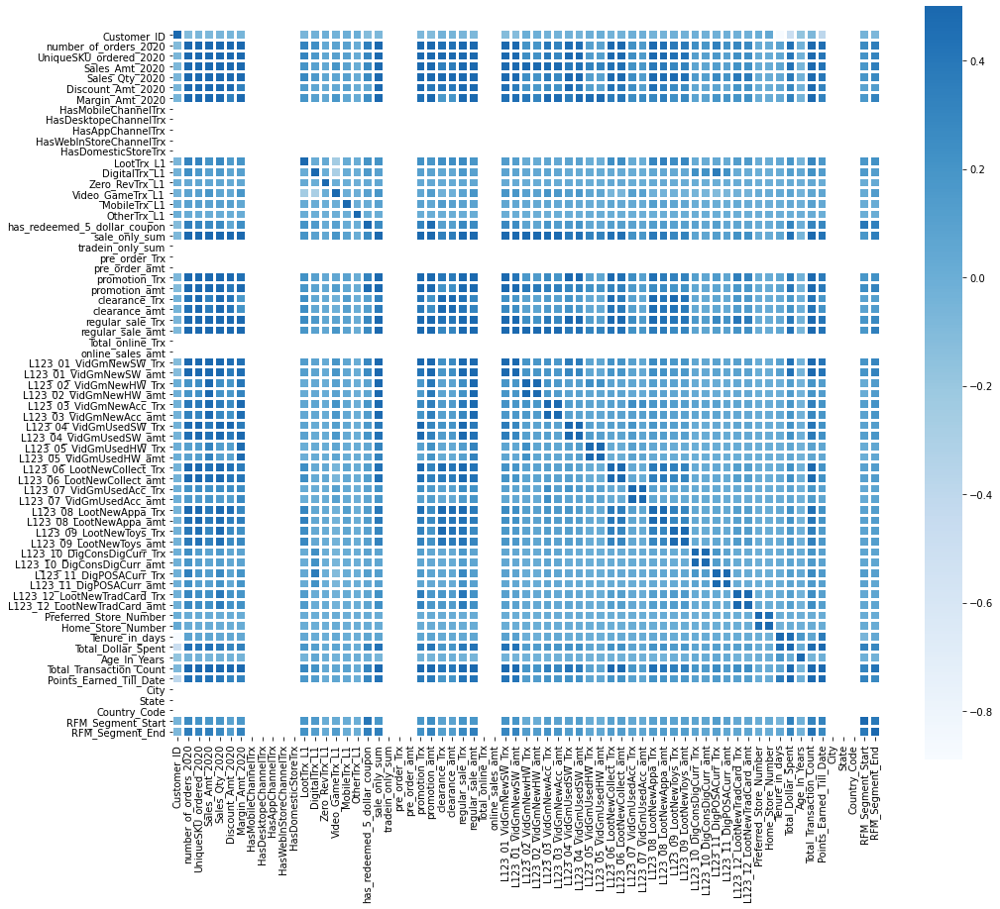

In [7]:
corr = prep_new_data.corr()
plt.figure(figsize=(16, 14))
sns.heatmap(corr, vmax=0.5, center=0,
            square=True, linewidths=2, cmap='Blues')
plt.savefig("heatmap.png")
plt.show()

In [18]:
prep_new_data['to_buy'] =  prep_new_data['to_buy'].astype('int')
prep_new_data.head()

,Customer_ID,Date_First_Purchase_2020,Date_Last_Purchase_2020,number_of_orders_2020,UniqueSKU_ordered_2020,Sales_Amt_2020,Sales_Qty_2020,Discount_Amt_2020,Margin_Amt_2020,HasMobileChannelTrx,...,Total_Transaction_Count,Points_Earned_Till_Date,City,State,Country_Code,RFM_Segment_Start,RFM_descr_Start,RFM_Segment_End,RFM_desrc_End,to_buy
0,1106983492,2020-06-25,2020-06-25,1,2,49.98,2.0,5.00,23.61,0,...,NaN,34938.0,NaN,NaN,NaN,4.0,Rising Stars,2.0,Sporadic Returners,1
1,1069186147,2020-03-07,2020-07-14,3,8,654.92,10.0,44.98,98.37,0,...,NaN,131000.0,NaN,NaN,NaN,3.0,Middle of the Road,4.0,Rising Stars,1
2,1118292313,2020-03-05,2020-12-29,6,8,221.93,10.0,34.99,12.88,1,...,NaN,383728.0,NaN,NaN,NaN,5.0,Best in Class,5.0,Best in Class,1
3,1003166832,2020-02-15,2020-12-31,81,96,-2382.41,-54.5,325.44,-1512.31,1,...,NaN,508640.0,NaN,NaN,NaN,5.0,Best in Class,4.0,Rising Stars,1
4,1287382381,2020-11-16,2020-11-30,3,21,814.57,42.0,30.82,66.39,0,...,NaN,294950.0,NaN,NaN,NaN,5.0,Best in Class,5.0,Best in Class,1


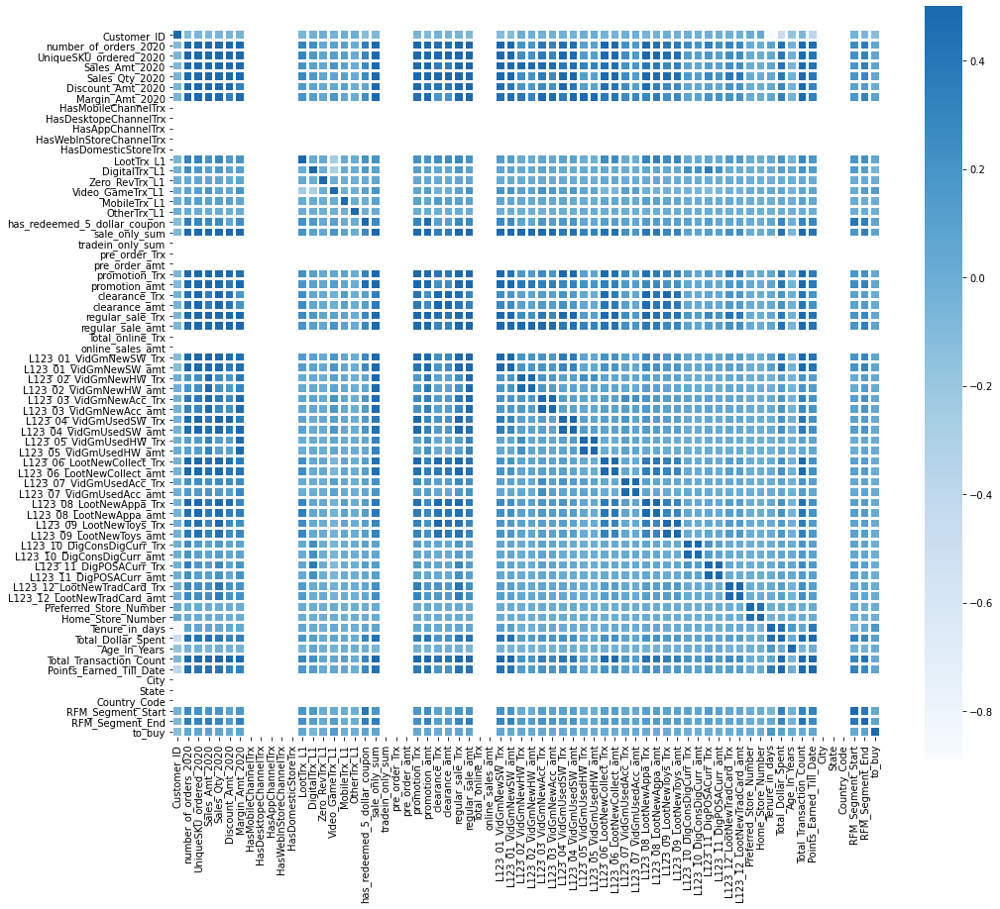

In [9]:
corr = prep_new_data.corr()
plt.figure(figsize=(16, 14))
sns.heatmap(corr, vmax=0.5, center=0,
            square=True, linewidths=2, cmap='Blues')
plt.savefig("heatmap.png")
plt.show()

In [10]:
ordered_CORR = prep_new_data.corr()['to_buy']
ordered_CORR.sort_values( ascending=False)


to_buy                1.000000
Tenure_in_days        0.170338
Video_GameTrx_L1      0.136761
Total_Dollar_Spent    0.100920
RFM_Segment_End       0.077720
                        ...   
Total_online_Trx           NaN
online_sales_amt           NaN
City                       NaN
State                      NaN
Country_Code               NaN
Name: to_buy, Length: 68, dtype: float64

In [11]:
prep_new_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200529 entries, 0 to 200528
Data columns (total 82 columns):
 #   Column                              Non-Null Count   Dtype         
---  ------                              --------------   -----         
 0   Customer_ID                         200529 non-null  int64         
 1   Date_First_Purchase_2020            200529 non-null  datetime64[ns]
 2   Date_Last_Purchase_2020             200529 non-null  datetime64[ns]
 3   number_of_orders_2020               200529 non-null  int64         
 4   UniqueSKU_ordered_2020              200529 non-null  int64         
 5   Sales_Amt_2020                      200529 non-null  float64       
 6   Sales_Qty_2020                      200529 non-null  float64       
 7   Discount_Amt_2020                   95658 non-null   float64       
 8   Margin_Amt_2020                     200529 non-null  float64       
 9   HasMobileChannelTrx                 200529 non-null  int64         
 10  HasDeskt

In [19]:
# Get  columns whose data type is object i.e. string
filteredColumns = prep_new_data.dtypes[prep_new_data.dtypes == np.object]
# list of columns whose data type is object i.e. string
listOfColumnNames = list(filteredColumns.index)
print(listOfColumnNames)

['Tier', 'TierRenewalStatus', 'TierExpirationStatus', 'Gender_Description', 'Loyalty_Account_Status_Description', 'Lifecycle_Segment', 'Lifecycle_SubSegment', 'Current_Segment', 'RFM_descr_Start', 'RFM_desrc_End']


In [20]:
list_of_irrelevant = [
                      'Customer_ID',
                        'Age_In_Years',
                        'Total_Transaction_Count',
                        'City',
                        'State',
                        'Country_Code',
                        'RFM_Segment_Start',
                        'RFM_Segment_End',
                        'RFM_descr_Start',
                        'RFM_desrc_End',
                        'Gender_Description',
                        'Loyalty_Account_Status_Description',
                        'Total_Transaction_Count'
                        ]


objects_for_encoding = ['Tier',
                        'TierRenewalStatus',
                        'TierExpirationStatus'
                        'Lifecycle_Segment',
                        'Lifecycle_SubSegment',
                        'Current_Segment'
                       ]

dates_list = ['Date_First_Purchase_2020', 
              'Date_Last_Purchase_2020', 
              'Loyalty_Account_Creation_Date',
              'Loyalty_Account_Effective_Date'
             ]

In [22]:
enc_data = prep_new_data

enc_data['Tier']  = enc_data['Tier'].astype('category')
enc_data['TierRenewalStatus']  = enc_data['TierRenewalStatus'].astype('category')
enc_data['TierExpirationStatus']  = enc_data['TierExpirationStatus'].astype('category')
enc_data['Lifecycle_Segment']  = enc_data['Lifecycle_Segment'].astype('category')
enc_data['Lifecycle_SubSegment']  = enc_data['Lifecycle_SubSegment'].astype('category')
enc_data['Current_Segment']  = enc_data['Current_Segment'].astype('category')

enc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199462 entries, 0 to 199461
Data columns (total 90 columns):
 #   Column                              Non-Null Count   Dtype         
---  ------                              --------------   -----         
 0   Customer_ID                         199462 non-null  int64         
 1   Date_First_Purchase_2020            199462 non-null  datetime64[ns]
 2   Date_Last_Purchase_2020             199462 non-null  datetime64[ns]
 3   number_of_orders_2020               199462 non-null  int64         
 4   UniqueSKU_ordered_2020              199462 non-null  int64         
 5   Sales_Amt_2020                      199462 non-null  float64       
 6   Sales_Qty_2020                      199462 non-null  float64       
 7   Discount_Amt_2020                   130175 non-null  float64       
 8   Margin_Amt_2020                     144980 non-null  float64       
 9   HasMobileChannelTrx                 199462 non-null  int64         
 10  HasDeskt

In [23]:
# encoding the data
enc_data['Tier']  = enc_data['Tier'].cat.codes
enc_data['TierRenewalStatus']  = enc_data['TierRenewalStatus'].cat.codes
enc_data['TierExpirationStatus']  = enc_data['TierExpirationStatus'].cat.codes
enc_data['Lifecycle_Segment']  = enc_data['Lifecycle_Segment'].cat.codes
enc_data['Lifecycle_SubSegment']  = enc_data['Lifecycle_SubSegment'].cat.codes
enc_data['Current_Segment']  = enc_data['Current_Segment'].cat.codes

In [39]:
predictors_to_drop = [
                        'Customer_ID',
                        'Age_In_Years',
                        'Total_Transaction_Count',
                        'Total_Dollar_Spent',
                        'City',
                        'State',
                        'Country_Code',
                        'RFM_Segment_Start',
                        'RFM_Segment_End',
                        'RFM_descr_Start',
                        'RFM_desrc_End',
                        'Gender_Description',
                        'Loyalty_Account_Status_Description',
                        'Total_Transaction_Count',
                        'Date_First_Purchase_2020', 
                        'Date_Last_Purchase_2020', 
                        'Loyalty_Account_Creation_Date',
                        'Loyalty_Account_Effective_Date',
                        'to_buy'
                        ]
predictors_RFC = enc_data.drop(predictors_to_drop, axis =1)

targets_RFC = enc_data.to_buy


In [40]:
# spliting the data into train and test

X_train, X_test, y_train, y_test  =   train_test_split(predictors_RFC, targets_RFC, test_size=0.3)

print( "Predictor - Training : ", X_train.shape, "Predictor - Testing : ", X_test.shape )

Predictor - Training :  (139623, 72) Predictor - Testing :  (59839, 72)


In [41]:
forest_model_RFC = RandomForestClassifier(min_samples_split =200,
                                          min_samples_leaf = 200, 
                                          random_state=1)
forest_model_RFC = forest_model_RFC.fit(np.nan_to_num(X_train), np.nan_to_num(y_train))
prop_preds_new = forest_model_RFC.predict(np.nan_to_num(X_test))
print("mean absolute error: ", mean_absolute_error(np.nan_to_num(y_test), prop_preds_new))

C:\Users\MMQuant\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


mean absolute error:  0.028108758501980313


In [42]:
# Create Decision Tree Regressor object
clf_2 = DecisionTreeRegressor(criterion='mae',
                              max_depth=6,
                              min_samples_split=200,
                              min_samples_leaf=200,
                              presort=True)

# Train Decision Tree Classifer
clf_2 = clf_2.fit(np.nan_to_num(X_train),np.nan_to_num(y_train))

#Predict the response for test dataset
y_pred = clf_2.predict(np.nan_to_num(X_test))

tree_score=clf_2.score(np.nan_to_num(X_test), np.nan_to_num(y_test))
print("score: ", tree_score)

score:  0.7150132484065354


In [43]:


dot_data = StringIO()
export_graphviz(clf_2, out_file='tree_limited.dot',  
                filled=True,
                rounded=True,
                special_characters=True,
                feature_names = predictors_RFC.columns,
                class_names = predictors_RFC.columns,
                rotate = False)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
#graph.write_png('Dyrvo.png')

!dot -Tpng tree_limited.dot -o tree_limited11.png -Gdpi=600

Image(graph.create_png("C:/Users/MMQuant/Desktop/GME II/notebooks/tree_limited03.png"))

Image(filename = 'tree_limited12.png')


^
Expected {'graph' | 'digraph'} (at char 0), (line:1, col:1)


'dot' is not recognized as an internal or external command,
operable program or batch file.


AttributeError: 'NoneType' object has no attribute 'create_png'

In [44]:
from sklearn.metrics import mean_absolute_error, r2_score

rsq = r2_score(np.nan_to_num(y_test), np.nan_to_num(y_pred))

maerr = mean_absolute_error(np.nan_to_num(y_test), y_pred)

print("mean absolute error: ", maerr)
print("R squared: ", rsq)

mean absolute error:  0.05538194154314076
R squared:  0.7150132484065354


In [45]:
feature_cols = predictors_RFC.columns

# Using those arrays, we can parse the tree structure:
n_nodes = clf_2.tree_.node_count
children_left = clf_2.tree_.children_left
children_right = clf_2.tree_.children_right
feature = clf_2.tree_.feature
threshold = clf_2.tree_.threshold

# The tree structure can be traversed to compute various properties such
# as the depth of each node and whether or not it is a leaf.
node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
is_leaves = np.zeros(shape=n_nodes, dtype=bool)
stack = [(0, -1)]  # seed is the root node id and its parent depth
while len(stack) > 0:
    node_id, parent_depth = stack.pop()
    node_depth[node_id] = parent_depth + 1

    # If we have a test node
    if (children_left[node_id] != children_right[node_id]):
        stack.append((children_left[node_id], parent_depth + 1))
        stack.append((children_right[node_id], parent_depth + 1))
    else:
        is_leaves[node_id] = True

print("The binary tree structure has %s nodes and has "
      "the following tree structure:"
      % n_nodes)
for i in range(n_nodes):
    if is_leaves[i]:
        print("%snode=%s leaf node." % (node_depth[i] * "\t", i))
    else:
        #print("%snode=%s test node: go to node %s if X[:, %s] <= %s else to "
        #      "node %s."
        print("%snode=%s test node: go to node %s if %s <= %s else to "
              "node %s."
              % (node_depth[i] * "\t",
                 i,
                 children_left[i],
                 feature_cols[feature[i]],
                 threshold[i],
                 children_right[i],
                 ))
print()

The binary tree structure has 79 nodes and has the following tree structure:
node=0 test node: go to node 1 if Preferred_Store_Number <= 3.0 else to node 30.
	node=1 test node: go to node 2 if Tenure_in_days <= 361.0 else to node 17.
		node=2 test node: go to node 3 if Points_Earned_Till_Date <= 5115.0 else to node 14.
			node=3 test node: go to node 4 if number_of_orders_2020 <= 2.5 else to node 11.
				node=4 test node: go to node 5 if L123_11_DigPOSACurr_amt <= 2.6200000047683716 else to node 8.
					node=5 test node: go to node 6 if Total_ECOMM_Trx_count <= 1.5 else to node 7.
						node=6 leaf node.
						node=7 leaf node.
					node=8 test node: go to node 9 if TierRenewalStatus <= 4.0 else to node 10.
						node=9 leaf node.
						node=10 leaf node.
				node=11 test node: go to node 12 if Discount_Amt_2020 <= 9.49500036239624 else to node 13.
					node=12 leaf node.
					node=13 leaf node.
			node=14 test node: go to node 15 if Home_Store_Number <= 4988.0 else to node 16.
				nod

In [47]:
# First let's retrieve the decision path of each sample. The decision_path
# method allows to retrieve the node indicator functions. A non zero element of
# indicator matrix at the position (i, j) indicates that the sample i goes
# through the node j.
node_indicator = clf_2.decision_path(np.nan_to_num(X_test))

# Similarly, we can also have the leaves ids reached by each sample.
leave_id = clf_2.apply(np.nan_to_num(X_test))

# Now, it's possible to get the tests that were used to predict a sample or
# a group of samples. First, let's make it for the sample.

for sample_id in range(0,10000):
    node_index = node_indicator.indices[node_indicator.indptr[sample_id]:
                                        node_indicator.indptr[sample_id + 1]]

    print('Rules used to predict sample %s: ' % sample_id)
    for node_id in node_index:
        if leave_id[sample_id] == node_id:
            continue

        if (X_test.iloc[sample_id, feature[node_id]] <= threshold[node_id]):
            threshold_sign = "<="

        else:
            threshold_sign = ">"

        print("decision id node %s : %s, %s (= %s) %s %s)"
              % (node_id,
                 sample_id,
                 feature_cols[feature[node_id]],
                 X_test.iloc[sample_id, feature[node_id]],
                 threshold_sign,
                 threshold[node_id]))

Rules used to predict sample 0: 
decision id node 0 : 0, Preferred_Store_Number (= 2550.0) > 3.0)
decision id node 30 : 0, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 0, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 0, Home_Store_Number (= 6235.0) <= 6651.5)
decision id node 50 : 0, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 0, promotion_amt (= 34.99) <= 302.7850036621094)
Rules used to predict sample 1: 
decision id node 0 : 1, Preferred_Store_Number (= 3228.0) > 3.0)
decision id node 30 : 1, Sales_Qty_2020 (= 10.0) > -0.5)
decision id node 48 : 1, number_of_orders_2020 (= 7) > 3.5)
decision id node 64 : 1, sale_only_sum (= 255.45) > 78.21500015258789)
decision id node 72 : 1, promotion_amt (= 161.97) > 60.260000228881836)
decision id node 76 : 1, Tenure_in_days (= 3668.0) > 517.5)
Rules used to predict sample 2: 
decision id node 0 : 2, Preferred_Store_Number (= 6606.0) > 3.0)
decision id node 30 : 2, Sales_Qty_2020 (= 41.0) > -0.

decision id node 2 : 145, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 145, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 145, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 145, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 146: 
decision id node 0 : 146, Preferred_Store_Number (= 1766.0) > 3.0)
decision id node 30 : 146, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 146, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 146, Home_Store_Number (= 5431.0) <= 6651.5)
decision id node 50 : 146, L123_03_VidGmNewAcc_amt (= 189.98) > 149.9550018310547)
decision id node 54 : 146, regular_sale_amt (= 189.98) > 173.92499542236328)
Rules used to predict sample 147: 
decision id node 0 : 147, Preferred_Store_Number (= 6977.0) > 3.0)
decision id node 30 : 147, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 147, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 147, Home_Store_Number (= na

decision id node 64 : 243, sale_only_sum (= 198.34) > 78.21500015258789)
decision id node 72 : 243, promotion_amt (= 49.98) <= 60.260000228881836)
decision id node 73 : 243, sale_only_sum (= 198.34) > 143.00499725341797)
Rules used to predict sample 244: 
decision id node 0 : 244, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 244, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 244, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 244, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 244, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 244, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 245: 
decision id node 0 : 245, Preferred_Store_Number (= 4861.0) > 3.0)
decision id node 30 : 245, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 245, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 245, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 245, L123_03_VidGmNewAcc_amt (= 74.98) <=

decision id node 1 : 345, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 345, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 345, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 345, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 345, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 346: 
decision id node 0 : 346, Preferred_Store_Number (= 735.0) > 3.0)
decision id node 30 : 346, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 346, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 346, Home_Store_Number (= 6461.0) <= 6651.5)
decision id node 50 : 346, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 346, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 347: 
decision id node 0 : 347, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 347, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 347, Points_Earned_Till_Date (= nan) > 5115.0)
dec

decision id node 51 : 434, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 435: 
decision id node 0 : 435, Preferred_Store_Number (= 4111.0) > 3.0)
decision id node 30 : 435, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 435, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 435, Home_Store_Number (= 4111.0) <= 6651.5)
decision id node 50 : 435, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 435, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 436: 
decision id node 0 : 436, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 436, Tenure_in_days (= 91.0) <= 361.0)
decision id node 2 : 436, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 436, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 436, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 436, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 437: 
decision id node

decision id node 2 : 527, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 527, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 527, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 527, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 528: 
decision id node 0 : 528, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 528, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 528, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 528, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 528, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 528, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 529: 
decision id node 0 : 529, Preferred_Store_Number (= 16.0) > 3.0)
decision id node 30 : 529, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 529, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 529, Home_Store_Number (= 4992.0) <= 6651.5)
decision 

decision id node 49 : 618, Home_Store_Number (= 6466.0) <= 6651.5)
decision id node 50 : 618, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 618, promotion_amt (= 12.99) <= 302.7850036621094)
Rules used to predict sample 619: 
decision id node 0 : 619, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 619, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 619, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 619, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 619, L123_11_DigPOSACurr_amt (= 50.0) > 2.6200000047683716)
decision id node 8 : 619, TierRenewalStatus (= -1) <= 4.0)
Rules used to predict sample 620: 
decision id node 0 : 620, Preferred_Store_Number (= 5707.0) > 3.0)
decision id node 30 : 620, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 620, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 620, Home_Store_Number (= 5707.0) <= 6651.5)
decision id node 50 : 620, L123_03_VidGmNewAcc_amt (= 14.99) <

decision id node 30 : 712, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 712, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 712, Home_Store_Number (= 6702.0) > 6651.5)
decision id node 57 : 712, Margin_Amt_2020 (= nan) > 11.394999980926514)
decision id node 58 : 712, Sales_Amt_2020 (= 49.98) > 16.494999885559082)
Rules used to predict sample 713: 
decision id node 0 : 713, Preferred_Store_Number (= 5715.0) > 3.0)
decision id node 30 : 713, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 713, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 713, Home_Store_Number (= 3259.0) <= 6651.5)
decision id node 50 : 713, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 713, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 714: 
decision id node 0 : 714, Preferred_Store_Number (= 4666.0) > 3.0)
decision id node 30 : 714, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 714, number_of_orders_2020 (= 1) <= 3.5)
d

decision id node 0 : 803, Preferred_Store_Number (= 5399.0) > 3.0)
decision id node 30 : 803, Sales_Qty_2020 (= 8.0) > -0.5)
decision id node 48 : 803, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 803, Home_Store_Number (= 5399.0) <= 6651.5)
decision id node 50 : 803, L123_03_VidGmNewAcc_amt (= 19.98) <= 149.9550018310547)
decision id node 51 : 803, promotion_amt (= 84.98) <= 302.7850036621094)
Rules used to predict sample 804: 
decision id node 0 : 804, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 804, Tenure_in_days (= 2006.0) > 361.0)
decision id node 17 : 804, Points_Earned_Till_Date (= 1482.0) <= 12805.5)
decision id node 18 : 804, Tenure_in_days (= 2006.0) <= 2341.5)
decision id node 19 : 804, Home_Store_Number (= 650.0) <= 1232.0)
Rules used to predict sample 805: 
decision id node 0 : 805, Preferred_Store_Number (= 2650.0) > 3.0)
decision id node 30 : 805, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 805, number_of_orders_2020 (= 1) <= 3.5)
de

decision id node 49 : 885, Home_Store_Number (= 3399.0) <= 6651.5)
decision id node 50 : 885, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 885, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 886: 
decision id node 0 : 886, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 886, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 886, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 886, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 886, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 886, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 887: 
decision id node 0 : 887, Preferred_Store_Number (= 6321.0) > 3.0)
decision id node 30 : 887, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 887, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 887, Home_Store_Number (= 6321.0) <= 6651.5)
decision id node 50 : 887, L123_03_VidGmNewAcc_amt (= 0.0) <=

Rules used to predict sample 983: 
decision id node 0 : 983, Preferred_Store_Number (= 651.0) > 3.0)
decision id node 30 : 983, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 983, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 983, Home_Store_Number (= 651.0) <= 6651.5)
decision id node 50 : 983, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 983, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 984: 
decision id node 0 : 984, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 984, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 984, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 984, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 984, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 984, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 985: 
decision id node 0 : 985, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 985, Tenur

decision id node 2 : 1091, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 1091, number_of_orders_2020 (= 2) <= 2.5)
decision id node 4 : 1091, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 1091, Total_ECOMM_Trx_count (= 2) > 1.5)
Rules used to predict sample 1092: 
decision id node 0 : 1092, Preferred_Store_Number (= 7630.0) > 3.0)
decision id node 30 : 1092, Sales_Qty_2020 (= 28.0) > -0.5)
decision id node 48 : 1092, number_of_orders_2020 (= 14) > 3.5)
decision id node 64 : 1092, sale_only_sum (= 360.229999999) > 78.21500015258789)
decision id node 72 : 1092, promotion_amt (= 37.98) <= 60.260000228881836)
decision id node 73 : 1092, sale_only_sum (= 360.229999999) > 143.00499725341797)
Rules used to predict sample 1093: 
decision id node 0 : 1093, Preferred_Store_Number (= 6257.0) > 3.0)
decision id node 30 : 1093, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 1093, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 1093,

decision id node 3 : 1194, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 1194, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 1194, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 1195: 
decision id node 0 : 1195, Preferred_Store_Number (= 4039.0) > 3.0)
decision id node 30 : 1195, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 1195, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 1195, Home_Store_Number (= 4523.0) <= 6651.5)
decision id node 50 : 1195, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 1195, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 1196: 
decision id node 0 : 1196, Preferred_Store_Number (= 6606.0) > 3.0)
decision id node 30 : 1196, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 1196, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 1196, Home_Store_Number (= 6606.0) <= 6651.5)
decision id node 50 : 1196, L123_03_VidGmNewAcc_

decision id node 48 : 1291, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 1291, Home_Store_Number (= 1555.0) <= 6651.5)
decision id node 50 : 1291, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 1291, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 1292: 
decision id node 0 : 1292, Preferred_Store_Number (= 3699.0) > 3.0)
decision id node 30 : 1292, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 1292, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 1292, Home_Store_Number (= 5899.0) <= 6651.5)
decision id node 50 : 1292, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 1292, promotion_amt (= 2.2) <= 302.7850036621094)
Rules used to predict sample 1293: 
decision id node 0 : 1293, Preferred_Store_Number (= 4346.0) > 3.0)
decision id node 30 : 1293, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 1293, number_of_orders_2020 (= 6) > 3.5)
decision id node 64 : 1293, sale_only_s

decision id node 48 : 1375, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 1375, Home_Store_Number (= 4312.0) <= 6651.5)
decision id node 50 : 1375, L123_03_VidGmNewAcc_amt (= 99.98) <= 149.9550018310547)
decision id node 51 : 1375, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 1376: 
decision id node 0 : 1376, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 1376, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 1376, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 1376, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 1376, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 1376, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 1377: 
decision id node 0 : 1377, Preferred_Store_Number (= 3675.0) > 3.0)
decision id node 30 : 1377, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 1377, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 1377, Home_Store_Number (=

decision id node 50 : 1467, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 1467, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 1468: 
decision id node 0 : 1468, Preferred_Store_Number (= 4889.0) > 3.0)
decision id node 30 : 1468, Sales_Qty_2020 (= -1.0) <= -0.5)
decision id node 31 : 1468, Tenure_in_days (= 2523.0) > 391.5)
decision id node 39 : 1468, Points_Earned_Till_Date (= 140.0) <= 905.0)
Rules used to predict sample 1469: 
decision id node 0 : 1469, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 1469, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 1469, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 1469, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 1469, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 1469, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 1470: 
decision id node 0 : 1470, Preferred_Store_Number (= 3671.0) > 3.0)
decis

decision id node 49 : 1553, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 1553, L123_03_VidGmNewAcc_amt (= 69.98) <= 149.9550018310547)
decision id node 51 : 1553, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 1554: 
decision id node 0 : 1554, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 1554, Tenure_in_days (= 275.0) <= 361.0)
decision id node 2 : 1554, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 1554, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 1554, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 1554, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 1555: 
decision id node 0 : 1555, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 1555, Tenure_in_days (= 60.0) <= 361.0)
decision id node 2 : 1555, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 1555, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 1555, L123_11_DigPOSA

decision id node 0 : 1638, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 1638, Tenure_in_days (= 1158.0) > 361.0)
decision id node 17 : 1638, Points_Earned_Till_Date (= 5000.0) <= 12805.5)
decision id node 18 : 1638, Tenure_in_days (= 1158.0) <= 2341.5)
decision id node 19 : 1638, Home_Store_Number (= 3490.0) > 1232.0)
decision id node 21 : 1638, Tenure_in_days (= 1158.0) > 1084.5)
Rules used to predict sample 1639: 
decision id node 0 : 1639, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 1639, Tenure_in_days (= 32.0) <= 361.0)
decision id node 2 : 1639, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 1639, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 1639, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 1639, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 1640: 
decision id node 0 : 1640, Preferred_Store_Number (= 620.0) > 3.0)
decision id node 30 : 1640, Sales_Qty_2020 (= 9.0) > -0.

decision id node 49 : 1708, Home_Store_Number (= 6208.0) <= 6651.5)
decision id node 50 : 1708, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 1708, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 1709: 
decision id node 0 : 1709, Preferred_Store_Number (= 2556.0) > 3.0)
decision id node 30 : 1709, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 1709, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 1709, Home_Store_Number (= 2556.0) <= 6651.5)
decision id node 50 : 1709, L123_03_VidGmNewAcc_amt (= 99.98) <= 149.9550018310547)
decision id node 51 : 1709, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 1710: 
decision id node 0 : 1710, Preferred_Store_Number (= 6180.0) > 3.0)
decision id node 30 : 1710, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 1710, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 1710, Home_Store_Number (= 1067.0) <= 6651.5)
decision id node 50 : 1710, L123

decision id node 4 : 1805, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 1805, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 1806: 
decision id node 0 : 1806, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 1806, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 1806, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 1806, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 1806, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 1806, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 1807: 
decision id node 0 : 1807, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 1807, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 1807, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 1807, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 1807, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 1807, Total_ECOMM_Trx_c

decision id node 18 : 1913, Tenure_in_days (= 784.0) <= 2341.5)
decision id node 19 : 1913, Home_Store_Number (= 4920.0) > 1232.0)
decision id node 21 : 1913, Tenure_in_days (= 784.0) <= 1084.5)
Rules used to predict sample 1914: 
decision id node 0 : 1914, Preferred_Store_Number (= 4998.0) > 3.0)
decision id node 30 : 1914, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 1914, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 1914, Home_Store_Number (= 4998.0) <= 6651.5)
decision id node 50 : 1914, L123_03_VidGmNewAcc_amt (= 67.97) <= 149.9550018310547)
decision id node 51 : 1914, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 1915: 
decision id node 0 : 1915, Preferred_Store_Number (= 5711.0) > 3.0)
decision id node 30 : 1915, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 1915, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 1915, Home_Store_Number (= 2599.0) <= 6651.5)
decision id node 50 : 1915, L123_03_VidGmNewAcc_amt (= 0.0)

decision id node 3 : 2008, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 2008, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 2008, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 2009: 
decision id node 0 : 2009, Preferred_Store_Number (= 3760.0) > 3.0)
decision id node 30 : 2009, Sales_Qty_2020 (= 8.0) > -0.5)
decision id node 48 : 2009, number_of_orders_2020 (= 5) > 3.5)
decision id node 64 : 2009, sale_only_sum (= 62.37) <= 78.21500015258789)
decision id node 65 : 2009, Sales_Amt_2020 (= 37.38) <= 54.77499961853027)
decision id node 66 : 2009, regular_sale_amt (= 12.44) > 8.214999675750732)
Rules used to predict sample 2010: 
decision id node 0 : 2010, Preferred_Store_Number (= 206.0) > 3.0)
decision id node 30 : 2010, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 2010, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 2010, Home_Store_Number (= 2488.0) <= 6651.5)
decision id node 50 : 2010, L123_03_VidGmNewAcc

decision id node 50 : 2092, L123_03_VidGmNewAcc_amt (= 149.96) > 149.9550018310547)
decision id node 54 : 2092, regular_sale_amt (= 157.56) <= 173.92499542236328)
Rules used to predict sample 2093: 
decision id node 0 : 2093, Preferred_Store_Number (= 7604.0) > 3.0)
decision id node 30 : 2093, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 2093, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 2093, Home_Store_Number (= 4294.0) <= 6651.5)
decision id node 50 : 2093, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 2093, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 2094: 
decision id node 0 : 2094, Preferred_Store_Number (= 1728.0) > 3.0)
decision id node 30 : 2094, Sales_Qty_2020 (= 18.0) > -0.5)
decision id node 48 : 2094, number_of_orders_2020 (= 10) > 3.5)
decision id node 64 : 2094, sale_only_sum (= 384.05) > 78.21500015258789)
decision id node 72 : 2094, promotion_amt (= 132.95) > 60.260000228881836)
decision id

decision id node 5 : 2186, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 2187: 
decision id node 0 : 2187, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 2187, Tenure_in_days (= 2992.0) > 361.0)
decision id node 17 : 2187, Points_Earned_Till_Date (= 5900.0) <= 12805.5)
decision id node 18 : 2187, Tenure_in_days (= 2992.0) > 2341.5)
decision id node 24 : 2187, Home_Store_Number (= 964.0) <= 1644.0)
Rules used to predict sample 2188: 
decision id node 0 : 2188, Preferred_Store_Number (= 4436.0) > 3.0)
decision id node 30 : 2188, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 2188, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 2188, Home_Store_Number (= 4436.0) <= 6651.5)
decision id node 50 : 2188, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 2188, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 2189: 
decision id node 0 : 2189, Preferred_Store_Number (= 3614.0) > 3.0)
decision id nod

decision id node 50 : 2278, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 2278, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 2279: 
decision id node 0 : 2279, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 2279, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 2279, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 2279, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 2279, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 2279, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 2280: 
decision id node 0 : 2280, Preferred_Store_Number (= 5512.0) > 3.0)
decision id node 30 : 2280, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 2280, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 2280, Home_Store_Number (= 5512.0) <= 6651.5)
decision id node 50 : 2280, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 2280, prom

decision id node 51 : 2372, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 2373: 
decision id node 0 : 2373, Preferred_Store_Number (= 795.0) > 3.0)
decision id node 30 : 2373, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 2373, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 2373, sale_only_sum (= 73.97) <= 78.21500015258789)
decision id node 65 : 2373, Sales_Amt_2020 (= 82.95) > 54.77499961853027)
decision id node 69 : 2373, Points_Earned_Till_Date (= 23836.0) > 12375.0)
Rules used to predict sample 2374: 
decision id node 0 : 2374, Preferred_Store_Number (= 5173.0) > 3.0)
decision id node 30 : 2374, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 2374, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 2374, Home_Store_Number (= 6214.0) <= 6651.5)
decision id node 50 : 2374, L123_03_VidGmNewAcc_amt (= 54.99) <= 149.9550018310547)
decision id node 51 : 2374, promotion_amt (= 54.99) <= 302.7850036621094)
Rules used to predict sampl

decision id node 2 : 2461, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 2461, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 2461, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 2461, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 2462: 
decision id node 0 : 2462, Preferred_Store_Number (= 6962.0) > 3.0)
decision id node 30 : 2462, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 2462, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 2462, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 2462, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 2462, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 2463: 
decision id node 0 : 2463, Preferred_Store_Number (= 5436.0) > 3.0)
decision id node 30 : 2463, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 2463, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 2463, Home_Store_Number (= 54

decision id node 0 : 2547, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 2547, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 2547, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 2547, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 2547, L123_11_DigPOSACurr_amt (= 50.0) > 2.6200000047683716)
decision id node 8 : 2547, TierRenewalStatus (= -1) <= 4.0)
Rules used to predict sample 2548: 
decision id node 0 : 2548, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 2548, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 2548, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 2548, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 2548, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 2548, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 2549: 
decision id node 0 : 2549, Preferred_Store_Number (= 2319.0) > 3.0)
decision id node 30 : 2549, Sales_Qty_2020 (= 3.0) > -0.5)
de

decision id node 1 : 2646, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 2646, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 2646, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 2646, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 2646, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 2647: 
decision id node 0 : 2647, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 2647, Tenure_in_days (= 61.0) <= 361.0)
decision id node 2 : 2647, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 2647, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 2647, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 2647, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 2648: 
decision id node 0 : 2648, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 2648, Tenure_in_days (= 143.0) <= 361.0)
decision id node 2 : 2648, Points_Earned_Till_Date (= 5000

Rules used to predict sample 2758: 
decision id node 0 : 2758, Preferred_Store_Number (= 2873.0) > 3.0)
decision id node 30 : 2758, Sales_Qty_2020 (= 7.0) > -0.5)
decision id node 48 : 2758, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 2758, Home_Store_Number (= 4536.0) <= 6651.5)
decision id node 50 : 2758, L123_03_VidGmNewAcc_amt (= 49.98) <= 149.9550018310547)
decision id node 51 : 2758, promotion_amt (= 8.99) <= 302.7850036621094)
Rules used to predict sample 2759: 
decision id node 0 : 2759, Preferred_Store_Number (= 7556.0) > 3.0)
decision id node 30 : 2759, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 2759, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 2759, Home_Store_Number (= 2942.0) <= 6651.5)
decision id node 50 : 2759, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 2759, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 2760: 
decision id node 0 : 2760, Preferred_Store_Number (= 3735.0) > 

decision id node 0 : 2855, Preferred_Store_Number (= 5867.0) > 3.0)
decision id node 30 : 2855, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 2855, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 2855, Home_Store_Number (= 5867.0) <= 6651.5)
decision id node 50 : 2855, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 2855, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 2856: 
decision id node 0 : 2856, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 2856, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 2856, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 2856, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 2856, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 2856, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 2857: 
decision id node 0 : 2857, Preferred_Store_Number (= 5841.0) > 3.0)
decision id node 30 : 2857, Sales_Qty_2020 (= 

decision id node 0 : 2949, Preferred_Store_Number (= 5080.0) > 3.0)
decision id node 30 : 2949, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 2949, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 2949, Home_Store_Number (= 5080.0) <= 6651.5)
decision id node 50 : 2949, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 2949, promotion_amt (= 1.3) <= 302.7850036621094)
Rules used to predict sample 2950: 
decision id node 0 : 2950, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 2950, Tenure_in_days (= 34.0) <= 361.0)
decision id node 2 : 2950, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 2950, number_of_orders_2020 (= 2) <= 2.5)
decision id node 4 : 2950, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 2950, Total_ECOMM_Trx_count (= 2) > 1.5)
Rules used to predict sample 2951: 
decision id node 0 : 2951, Preferred_Store_Number (= 7587.0) > 3.0)
decision id node 30 : 2951, Sales_Qty_202

decision id node 1 : 3027, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 3027, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 3027, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 3027, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 3027, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 3028: 
decision id node 0 : 3028, Preferred_Store_Number (= 4294.0) > 3.0)
decision id node 30 : 3028, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 3028, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 3028, sale_only_sum (= 112.97) > 78.21500015258789)
decision id node 72 : 3028, promotion_amt (= 0.0) <= 60.260000228881836)
decision id node 73 : 3028, sale_only_sum (= 112.97) <= 143.00499725341797)
Rules used to predict sample 3029: 
decision id node 0 : 3029, Preferred_Store_Number (= 6446.0) > 3.0)
decision id node 30 : 3029, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 3029, number_of_orders_2020 (=

Rules used to predict sample 3124: 
decision id node 0 : 3124, Preferred_Store_Number (= 6206.0) > 3.0)
decision id node 30 : 3124, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 3124, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 3124, Home_Store_Number (= 6206.0) <= 6651.5)
decision id node 50 : 3124, L123_03_VidGmNewAcc_amt (= 24.99) <= 149.9550018310547)
decision id node 51 : 3124, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 3125: 
decision id node 0 : 3125, Preferred_Store_Number (= 1846.0) > 3.0)
decision id node 30 : 3125, Sales_Qty_2020 (= 9.0) > -0.5)
decision id node 48 : 3125, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 3125, sale_only_sum (= 176.95) > 78.21500015258789)
decision id node 72 : 3125, promotion_amt (= 30.0) <= 60.260000228881836)
decision id node 73 : 3125, sale_only_sum (= 176.95) > 143.00499725341797)
Rules used to predict sample 3126: 
decision id node 0 : 3126, Preferred_Store_Number (= 2942.0) > 3

decision id node 4 : 3219, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 3219, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 3220: 
decision id node 0 : 3220, Preferred_Store_Number (= 7627.0) > 3.0)
decision id node 30 : 3220, Sales_Qty_2020 (= 14.0) > -0.5)
decision id node 48 : 3220, number_of_orders_2020 (= 7) > 3.5)
decision id node 64 : 3220, sale_only_sum (= 424.79) > 78.21500015258789)
decision id node 72 : 3220, promotion_amt (= 0.0) <= 60.260000228881836)
decision id node 73 : 3220, sale_only_sum (= 424.79) > 143.00499725341797)
Rules used to predict sample 3221: 
decision id node 0 : 3221, Preferred_Store_Number (= 3696.0) > 3.0)
decision id node 30 : 3221, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 3221, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 3221, Home_Store_Number (= 5169.0) <= 6651.5)
decision id node 50 : 3221, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 3221, p

decision id node 72 : 3306, promotion_amt (= 25.98) <= 60.260000228881836)
decision id node 73 : 3306, sale_only_sum (= 150.95) > 143.00499725341797)
Rules used to predict sample 3307: 
decision id node 0 : 3307, Preferred_Store_Number (= 2397.0) > 3.0)
decision id node 30 : 3307, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 3307, number_of_orders_2020 (= 5) > 3.5)
decision id node 64 : 3307, sale_only_sum (= 137.45) > 78.21500015258789)
decision id node 72 : 3307, promotion_amt (= 77.47) > 60.260000228881836)
decision id node 76 : 3307, Tenure_in_days (= 2884.0) > 517.5)
Rules used to predict sample 3308: 
decision id node 0 : 3308, Preferred_Store_Number (= 3531.0) > 3.0)
decision id node 30 : 3308, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 3308, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 3308, Home_Store_Number (= 3531.0) <= 6651.5)
decision id node 50 : 3308, L123_03_VidGmNewAcc_amt (= 64.98) <= 149.9550018310547)
decision id node 51 : 3308, promot

decision id node 3 : 3391, number_of_orders_2020 (= 2) <= 2.5)
decision id node 4 : 3391, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 3391, Total_ECOMM_Trx_count (= 2) > 1.5)
Rules used to predict sample 3392: 
decision id node 0 : 3392, Preferred_Store_Number (= 337.0) > 3.0)
decision id node 30 : 3392, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 3392, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 3392, Home_Store_Number (= 3117.0) <= 6651.5)
decision id node 50 : 3392, L123_03_VidGmNewAcc_amt (= 84.98) <= 149.9550018310547)
decision id node 51 : 3392, promotion_amt (= 74.99) <= 302.7850036621094)
Rules used to predict sample 3393: 
decision id node 0 : 3393, Preferred_Store_Number (= 2685.0) > 3.0)
decision id node 30 : 3393, Sales_Qty_2020 (= 33.0) > -0.5)
decision id node 48 : 3393, number_of_orders_2020 (= 10) > 3.5)
decision id node 64 : 3393, sale_only_sum (= 413.2) > 78.21500015258789)
decision id node 72 : 3393, promotion_am

decision id node 0 : 3493, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 3493, Tenure_in_days (= 85.0) <= 361.0)
decision id node 2 : 3493, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 3493, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 3493, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 3493, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 3494: 
decision id node 0 : 3494, Preferred_Store_Number (= 7703.0) > 3.0)
decision id node 30 : 3494, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 3494, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 3494, Home_Store_Number (= 2669.0) <= 6651.5)
decision id node 50 : 3494, L123_03_VidGmNewAcc_amt (= 54.98) <= 149.9550018310547)
decision id node 51 : 3494, promotion_amt (= 44.98) <= 302.7850036621094)
Rules used to predict sample 3495: 
decision id node 0 : 3495, Preferred_Store_Number (= 7772.0) > 3.0)
decision id node 30 : 3495, Sales_Qt

decision id node 30 : 3603, Sales_Qty_2020 (= 14.0) > -0.5)
decision id node 48 : 3603, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 3603, Home_Store_Number (= 7599.0) > 6651.5)
decision id node 57 : 3603, Margin_Amt_2020 (= 90.27) > 11.394999980926514)
decision id node 61 : 3603, L123_09_LootNewToys_amt (= 0.0) <= 0.48500001430511475)
Rules used to predict sample 3604: 
decision id node 0 : 3604, Preferred_Store_Number (= 2820.0) > 3.0)
decision id node 30 : 3604, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 3604, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 3604, sale_only_sum (= 137.949999999) > 78.21500015258789)
decision id node 72 : 3604, promotion_amt (= 69.979999999) > 60.260000228881836)
decision id node 76 : 3604, Tenure_in_days (= 752.0) > 517.5)
Rules used to predict sample 3605: 
decision id node 0 : 3605, Preferred_Store_Number (= 2788.0) > 3.0)
decision id node 30 : 3605, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 3605, number_o

decision id node 49 : 3697, Home_Store_Number (= 5715.0) <= 6651.5)
decision id node 50 : 3697, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 3697, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 3698: 
decision id node 0 : 3698, Preferred_Store_Number (= 5232.0) > 3.0)
decision id node 30 : 3698, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 3698, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 3698, Home_Store_Number (= 5232.0) <= 6651.5)
decision id node 50 : 3698, L123_03_VidGmNewAcc_amt (= 12.99) <= 149.9550018310547)
decision id node 51 : 3698, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 3699: 
decision id node 0 : 3699, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 3699, Tenure_in_days (= 60.0) <= 361.0)
decision id node 2 : 3699, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 3699, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 3699, L1

decision id node 50 : 3794, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 3794, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 3795: 
decision id node 0 : 3795, Preferred_Store_Number (= 7772.0) > 3.0)
decision id node 30 : 3795, Sales_Qty_2020 (= 36.0) > -0.5)
decision id node 48 : 3795, number_of_orders_2020 (= 12) > 3.5)
decision id node 64 : 3795, sale_only_sum (= 1766.049999999) > 78.21500015258789)
decision id node 72 : 3795, promotion_amt (= 151.459999999) > 60.260000228881836)
decision id node 76 : 3795, Tenure_in_days (= 3498.0) > 517.5)
Rules used to predict sample 3796: 
decision id node 0 : 3796, Preferred_Store_Number (= 4761.0) > 3.0)
decision id node 30 : 3796, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 3796, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 3796, Home_Store_Number (= 4761.0) <= 6651.5)
decision id node 50 : 3796, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id no

decision id node 4 : 3878, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 3878, Total_ECOMM_Trx_count (= 2) > 1.5)
Rules used to predict sample 3879: 
decision id node 0 : 3879, Preferred_Store_Number (= 6739.0) > 3.0)
decision id node 30 : 3879, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 3879, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 3879, Home_Store_Number (= 3564.0) <= 6651.5)
decision id node 50 : 3879, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 3879, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 3880: 
decision id node 0 : 3880, Preferred_Store_Number (= 4690.0) > 3.0)
decision id node 30 : 3880, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 3880, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 3880, sale_only_sum (= 99.67) > 78.21500015258789)
decision id node 72 : 3880, promotion_amt (= 78.97) > 60.260000228881836)
decision id node 76 : 3880, Tenure

decision id node 0 : 3961, Preferred_Store_Number (= 5360.0) > 3.0)
decision id node 30 : 3961, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 3961, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 3961, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 3961, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 3961, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 3962: 
decision id node 0 : 3962, Preferred_Store_Number (= 916.0) > 3.0)
decision id node 30 : 3962, Sales_Qty_2020 (= 18.0) > -0.5)
decision id node 48 : 3962, number_of_orders_2020 (= 6) > 3.5)
decision id node 64 : 3962, sale_only_sum (= 263.82) > 78.21500015258789)
decision id node 72 : 3962, promotion_amt (= 171.9) > 60.260000228881836)
decision id node 76 : 3962, Tenure_in_days (= 3717.0) > 517.5)
Rules used to predict sample 3963: 
decision id node 0 : 3963, Preferred_Store_Number (= 3074.0) > 3.0)
decision id node 30 : 3963, Sales_Qty_2020 (= 1.0)

decision id node 49 : 4041, Home_Store_Number (= 781.0) <= 6651.5)
decision id node 50 : 4041, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4041, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 4042: 
decision id node 0 : 4042, Preferred_Store_Number (= 1046.0) > 3.0)
decision id node 30 : 4042, Sales_Qty_2020 (= 11.0) > -0.5)
decision id node 48 : 4042, number_of_orders_2020 (= 8) > 3.5)
decision id node 64 : 4042, sale_only_sum (= 205.91) > 78.21500015258789)
decision id node 72 : 4042, promotion_amt (= 107.17) > 60.260000228881836)
decision id node 76 : 4042, Tenure_in_days (= 2970.0) > 517.5)
Rules used to predict sample 4043: 
decision id node 0 : 4043, Preferred_Store_Number (= 688.0) > 3.0)
decision id node 30 : 4043, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 4043, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 4043, Home_Store_Number (= 1604.0) <= 6651.5)
decision id node 50 : 4043, L123_03_VidGmNewAc

decision id node 49 : 4122, Home_Store_Number (= 4356.0) <= 6651.5)
decision id node 50 : 4122, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4122, promotion_amt (= 14.99) <= 302.7850036621094)
Rules used to predict sample 4123: 
decision id node 0 : 4123, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 4123, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 4123, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 4123, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4123, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4123, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4124: 
decision id node 0 : 4124, Preferred_Store_Number (= 6064.0) > 3.0)
decision id node 30 : 4124, Sales_Qty_2020 (= 17.0) > -0.5)
decision id node 48 : 4124, number_of_orders_2020 (= 10) > 3.5)
decision id node 64 : 4124, sale_only_sum (= 419.51) > 78.21500015258789)
decision id node 72 : 4124, promotion

decision id node 57 : 4206, Margin_Amt_2020 (= 3.91) <= 11.394999980926514)
decision id node 58 : 4206, Sales_Amt_2020 (= 3.91) <= 16.494999885559082)
Rules used to predict sample 4207: 
decision id node 0 : 4207, Preferred_Store_Number (= 6635.0) > 3.0)
decision id node 30 : 4207, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 4207, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 4207, Home_Store_Number (= 3269.0) <= 6651.5)
decision id node 50 : 4207, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4207, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 4208: 
decision id node 0 : 4208, Preferred_Store_Number (= 3839.0) > 3.0)
decision id node 30 : 4208, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 4208, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 4208, Home_Store_Number (= 5739.0) <= 6651.5)
decision id node 50 : 4208, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4

decision id node 3 : 4323, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4323, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4323, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4324: 
decision id node 0 : 4324, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 4324, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 4324, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 4324, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4324, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4324, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4325: 
decision id node 0 : 4325, Preferred_Store_Number (= 5461.0) > 3.0)
decision id node 30 : 4325, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 4325, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 4325, Home_Store_Number (= 5461.0) <= 6651.5)
decision id node 50 : 4325, L123_03_VidGmNewAcc_amt (= 0.0) 

decision id node 51 : 4425, promotion_amt (= 7.49) <= 302.7850036621094)
Rules used to predict sample 4426: 
decision id node 0 : 4426, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 4426, Tenure_in_days (= 59.0) <= 361.0)
decision id node 2 : 4426, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 4426, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4426, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4426, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4427: 
decision id node 0 : 4427, Preferred_Store_Number (= 5839.0) > 3.0)
decision id node 30 : 4427, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 4427, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 4427, Home_Store_Number (= 5839.0) <= 6651.5)
decision id node 50 : 4427, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4427, promotion_amt (= 11.99) <= 302.7850036621094)
Rules used to predict sample 4428

decision id node 51 : 4526, promotion_amt (= 129.98) <= 302.7850036621094)
Rules used to predict sample 4527: 
decision id node 0 : 4527, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 4527, Tenure_in_days (= 75.0) <= 361.0)
decision id node 2 : 4527, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 4527, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4527, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4527, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4528: 
decision id node 0 : 4528, Preferred_Store_Number (= 597.0) > 3.0)
decision id node 30 : 4528, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 4528, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 4528, Home_Store_Number (= 4605.0) <= 6651.5)
decision id node 50 : 4528, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4528, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 4529:

decision id node 0 : 4613, Preferred_Store_Number (= 6722.0) > 3.0)
decision id node 30 : 4613, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 4613, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 4613, Home_Store_Number (= 6070.0) <= 6651.5)
decision id node 50 : 4613, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4613, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 4614: 
decision id node 0 : 4614, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 4614, Tenure_in_days (= 34.0) <= 361.0)
decision id node 2 : 4614, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 4614, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4614, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4614, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4615: 
decision id node 0 : 4615, Preferred_Store_Number (= 7525.0) > 3.0)
decision id node 30 : 4615, Sales_Qty_20

decision id node 64 : 4710, sale_only_sum (= 63.57) <= 78.21500015258789)
decision id node 65 : 4710, Sales_Amt_2020 (= 581.47) > 54.77499961853027)
decision id node 69 : 4710, Points_Earned_Till_Date (= 130612.0) > 12375.0)
Rules used to predict sample 4711: 
decision id node 0 : 4711, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 4711, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 4711, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 4711, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4711, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4711, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4712: 
decision id node 0 : 4712, Preferred_Store_Number (= 3746.0) > 3.0)
decision id node 30 : 4712, Sales_Qty_2020 (= 9.0) > -0.5)
decision id node 48 : 4712, number_of_orders_2020 (= 5) > 3.5)
decision id node 64 : 4712, sale_only_sum (= 110.89) > 78.21500015258789)
decision id node 72 : 4712, promotion_

decision id node 0 : 4806, Preferred_Store_Number (= 4800.0) > 3.0)
decision id node 30 : 4806, Sales_Qty_2020 (= 15.0) > -0.5)
decision id node 48 : 4806, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 4806, Home_Store_Number (= 3116.0) <= 6651.5)
decision id node 50 : 4806, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4806, promotion_amt (= 14.47) <= 302.7850036621094)
Rules used to predict sample 4807: 
decision id node 0 : 4807, Preferred_Store_Number (= 6592.0) > 3.0)
decision id node 30 : 4807, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 4807, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 4807, Home_Store_Number (= 6336.0) <= 6651.5)
decision id node 50 : 4807, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4807, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 4808: 
decision id node 0 : 4808, Preferred_Store_Number (= 4681.0) > 3.0)
decision id node 30 : 4808, Sal

decision id node 3 : 4900, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4900, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4900, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4901: 
decision id node 0 : 4901, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 4901, Tenure_in_days (= 2584.0) > 361.0)
decision id node 17 : 4901, Points_Earned_Till_Date (= 19390.0) > 12805.5)
Rules used to predict sample 4902: 
decision id node 0 : 4902, Preferred_Store_Number (= 5231.0) > 3.0)
decision id node 30 : 4902, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 4902, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 4902, Home_Store_Number (= 3276.0) <= 6651.5)
decision id node 50 : 4902, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 4902, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 4903: 
decision id node 0 : 4903, Preferred_Store_Number (= 33.0) > 3.0)
dec

decision id node 3 : 4981, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4981, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4981, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4982: 
decision id node 0 : 4982, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 4982, Tenure_in_days (= 107.0) <= 361.0)
decision id node 2 : 4982, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 4982, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4982, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 4982, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 4983: 
decision id node 0 : 4983, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 4983, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 4983, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 4983, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 4983, L123_11_DigPOSACurr_amt (= 0.0) <

decision id node 48 : 5059, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5059, Home_Store_Number (= 4225.0) <= 6651.5)
decision id node 50 : 5059, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5059, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 5060: 
decision id node 0 : 5060, Preferred_Store_Number (= 6461.0) > 3.0)
decision id node 30 : 5060, Sales_Qty_2020 (= -1.0) <= -0.5)
decision id node 31 : 5060, Tenure_in_days (= nan) > 391.5)
decision id node 32 : 5060, STORE_sales_amt (= -2.99) > -121.48999786376953)
decision id node 34 : 5060, regular_sale_amt (= -2.99) > -20.769999504089355)
Rules used to predict sample 5061: 
decision id node 0 : 5061, Preferred_Store_Number (= 2302.0) > 3.0)
decision id node 30 : 5061, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 5061, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5061, Home_Store_Number (= 3799.0) <= 6651.5)
decision id node 50 : 5061, L123_03_Vid

decision id node 2 : 5174, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 5174, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 5174, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 5174, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 5175: 
decision id node 0 : 5175, Preferred_Store_Number (= 3685.0) > 3.0)
decision id node 30 : 5175, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 5175, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 5175, Home_Store_Number (= 3685.0) <= 6651.5)
decision id node 50 : 5175, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5175, promotion_amt (= 34.99) <= 302.7850036621094)
Rules used to predict sample 5176: 
decision id node 0 : 5176, Preferred_Store_Number (= 2534.0) > 3.0)
decision id node 30 : 5176, Sales_Qty_2020 (= -2.0) <= -0.5)
decision id node 31 : 5176, Tenure_in_days (= nan) > 391.5)
decision id node 32 : 5176, STORE_sales_amt (= 

decision id node 0 : 5261, Preferred_Store_Number (= 2456.0) > 3.0)
decision id node 30 : 5261, Sales_Qty_2020 (= 16.0) > -0.5)
decision id node 48 : 5261, number_of_orders_2020 (= 10) > 3.5)
decision id node 64 : 5261, sale_only_sum (= 160.37) > 78.21500015258789)
decision id node 72 : 5261, promotion_amt (= 41.28) <= 60.260000228881836)
decision id node 73 : 5261, sale_only_sum (= 160.37) > 143.00499725341797)
Rules used to predict sample 5262: 
decision id node 0 : 5262, Preferred_Store_Number (= 5957.0) > 3.0)
decision id node 30 : 5262, Sales_Qty_2020 (= 11.0) > -0.5)
decision id node 48 : 5262, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 5262, Home_Store_Number (= 5957.0) <= 6651.5)
decision id node 50 : 5262, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5262, promotion_amt (= 62.22) <= 302.7850036621094)
Rules used to predict sample 5263: 
decision id node 0 : 5263, Preferred_Store_Number (= 5361.0) > 3.0)
decision id node 30 : 5263, 

decision id node 0 : 5359, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 5359, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 5359, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 5359, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 5359, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 5359, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 5360: 
decision id node 0 : 5360, Preferred_Store_Number (= 6036.0) > 3.0)
decision id node 30 : 5360, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 5360, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5360, Home_Store_Number (= 6036.0) <= 6651.5)
decision id node 50 : 5360, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5360, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 5361: 
decision id node 0 : 5361, Preferred_Store_Number (= 721.0) > 3.0)
decision id node 30 : 5361, Sales_Qty_2020 (= 2

decision id node 0 : 5460, Preferred_Store_Number (= 3158.0) > 3.0)
decision id node 30 : 5460, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 5460, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5460, Home_Store_Number (= 4316.0) <= 6651.5)
decision id node 50 : 5460, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5460, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 5461: 
decision id node 0 : 5461, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 5461, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 5461, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 5461, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 5461, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 5461, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 5462: 
decision id node 0 : 5462, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 5462, Tenure_in_days (= 45.0

decision id node 18 : 5547, Tenure_in_days (= 2492.0) > 2341.5)
decision id node 24 : 5547, Home_Store_Number (= 6631.0) > 1644.0)
decision id node 26 : 5547, store_480_sales_amt (= 0.0) <= 5.494999885559082)
Rules used to predict sample 5548: 
decision id node 0 : 5548, Preferred_Store_Number (= 4390.0) > 3.0)
decision id node 30 : 5548, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 5548, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 5548, Home_Store_Number (= 3608.0) <= 6651.5)
decision id node 50 : 5548, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5548, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 5549: 
decision id node 0 : 5549, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 5549, Tenure_in_days (= 77.0) <= 361.0)
decision id node 2 : 5549, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 5549, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 5549, L123_11_DigPOSACurr_a

decision id node 0 : 5641, Preferred_Store_Number (= 5726.0) > 3.0)
decision id node 30 : 5641, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 5641, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5641, Home_Store_Number (= 4846.0) <= 6651.5)
decision id node 50 : 5641, L123_03_VidGmNewAcc_amt (= 44.98) <= 149.9550018310547)
decision id node 51 : 5641, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 5642: 
decision id node 0 : 5642, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 5642, Tenure_in_days (= 50.0) <= 361.0)
decision id node 2 : 5642, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 5642, number_of_orders_2020 (= 3) > 2.5)
decision id node 11 : 5642, Discount_Amt_2020 (= 11.08) > 9.49500036239624)
Rules used to predict sample 5643: 
decision id node 0 : 5643, Preferred_Store_Number (= 7566.0) > 3.0)
decision id node 30 : 5643, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 5643, number_of_orders_2020

decision id node 30 : 5735, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 5735, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5735, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 5735, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5735, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 5736: 
decision id node 0 : 5736, Preferred_Store_Number (= 2342.0) > 3.0)
decision id node 30 : 5736, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 5736, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5736, Home_Store_Number (= 2393.0) <= 6651.5)
decision id node 50 : 5736, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5736, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 5737: 
decision id node 0 : 5737, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 5737, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 5737, Points_Earned_Till_Date

decision id node 51 : 5815, promotion_amt (= 165.51) <= 302.7850036621094)
Rules used to predict sample 5816: 
decision id node 0 : 5816, Preferred_Store_Number (= 789.0) > 3.0)
decision id node 30 : 5816, Sales_Qty_2020 (= 7.0) > -0.5)
decision id node 48 : 5816, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5816, Home_Store_Number (= 4391.0) <= 6651.5)
decision id node 50 : 5816, L123_03_VidGmNewAcc_amt (= 4.99) <= 149.9550018310547)
decision id node 51 : 5816, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 5817: 
decision id node 0 : 5817, Preferred_Store_Number (= 2659.0) > 3.0)
decision id node 30 : 5817, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 5817, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 5817, Home_Store_Number (= 589.0) <= 6651.5)
decision id node 50 : 5817, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5817, promotion_amt (= 100.47) <= 302.7850036621094)
Rules used to predict sam

decision id node 48 : 5894, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5894, Home_Store_Number (= 1606.0) <= 6651.5)
decision id node 50 : 5894, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 5894, promotion_amt (= 20.78) <= 302.7850036621094)
Rules used to predict sample 5895: 
decision id node 0 : 5895, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 5895, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 5895, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 5895, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 5895, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 5895, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 5896: 
decision id node 0 : 5896, Preferred_Store_Number (= 6591.0) > 3.0)
decision id node 30 : 5896, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 5896, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 5896, Home_Store_Number (=

decision id node 48 : 6014, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 6014, Home_Store_Number (= 3345.0) <= 6651.5)
decision id node 50 : 6014, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 6014, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 6015: 
decision id node 0 : 6015, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 6015, Tenure_in_days (= 61.0) <= 361.0)
decision id node 2 : 6015, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 6015, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 6015, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 6015, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 6016: 
decision id node 0 : 6016, Preferred_Store_Number (= 3454.0) > 3.0)
decision id node 30 : 6016, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 6016, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 6016, Home_Store_Numbe

decision id node 50 : 6120, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 6120, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 6121: 
decision id node 0 : 6121, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 6121, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 6121, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 6121, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 6121, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 6121, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 6122: 
decision id node 0 : 6122, Preferred_Store_Number (= 1045.0) > 3.0)
decision id node 30 : 6122, Sales_Qty_2020 (= -1.0) <= -0.5)
decision id node 31 : 6122, Tenure_in_days (= nan) > 391.5)
decision id node 32 : 6122, STORE_sales_amt (= -39.98) > -121.48999786376953)
decision id node 34 : 6122, regular_sale_amt (= -39.98) <= -20.769999504089355)
decision id node 35 : 6122

decision id node 0 : 6196, Preferred_Store_Number (= 387.0) > 3.0)
decision id node 30 : 6196, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 6196, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 6196, Home_Store_Number (= 3674.0) <= 6651.5)
decision id node 50 : 6196, L123_03_VidGmNewAcc_amt (= 49.98) <= 149.9550018310547)
decision id node 51 : 6196, promotion_amt (= 8.99) <= 302.7850036621094)
Rules used to predict sample 6197: 
decision id node 0 : 6197, Preferred_Store_Number (= 5520.0) > 3.0)
decision id node 30 : 6197, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 6197, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 6197, Home_Store_Number (= 6210.0) <= 6651.5)
decision id node 50 : 6197, L123_03_VidGmNewAcc_amt (= 59.97) <= 149.9550018310547)
decision id node 51 : 6197, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 6198: 
decision id node 0 : 6198, Preferred_Store_Number (= 4233.0) > 3.0)
decision id node 30 : 6198, Sa

decision id node 50 : 6291, L123_03_VidGmNewAcc_amt (= 36.98) <= 149.9550018310547)
decision id node 51 : 6291, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 6292: 
decision id node 0 : 6292, Preferred_Store_Number (= 1959.0) > 3.0)
decision id node 30 : 6292, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 6292, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 6292, Home_Store_Number (= 1959.0) <= 6651.5)
decision id node 50 : 6292, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 6292, promotion_amt (= 42.98) <= 302.7850036621094)
Rules used to predict sample 6293: 
decision id node 0 : 6293, Preferred_Store_Number (= 3735.0) > 3.0)
decision id node 30 : 6293, Sales_Qty_2020 (= 7.0) > -0.5)
decision id node 48 : 6293, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 6293, sale_only_sum (= 195.95) > 78.21500015258789)
decision id node 72 : 6293, promotion_amt (= 64.98) > 60.260000228881836)
decision id node 76

Rules used to predict sample 6383: 
decision id node 0 : 6383, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 6383, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 6383, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 6383, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 6383, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 6383, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 6384: 
decision id node 0 : 6384, Preferred_Store_Number (= 1672.0) > 3.0)
decision id node 30 : 6384, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 6384, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 6384, Home_Store_Number (= 1606.0) <= 6651.5)
decision id node 50 : 6384, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 6384, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 6385: 
decision id node 0 : 6385, Preferred_Store_Number (= 3783.0) > 3.0)
decision i

decision id node 49 : 6468, Home_Store_Number (= 4727.0) <= 6651.5)
decision id node 50 : 6468, L123_03_VidGmNewAcc_amt (= 24.99) <= 149.9550018310547)
decision id node 51 : 6468, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 6469: 
decision id node 0 : 6469, Preferred_Store_Number (= 224.0) > 3.0)
decision id node 30 : 6469, Sales_Qty_2020 (= 9.0) > -0.5)
decision id node 48 : 6469, number_of_orders_2020 (= 6) > 3.5)
decision id node 64 : 6469, sale_only_sum (= 122.36) > 78.21500015258789)
decision id node 72 : 6469, promotion_amt (= 104.98) > 60.260000228881836)
decision id node 76 : 6469, Tenure_in_days (= 1854.0) > 517.5)
Rules used to predict sample 6470: 
decision id node 0 : 6470, Preferred_Store_Number (= 3541.0) > 3.0)
decision id node 30 : 6470, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 6470, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 6470, Home_Store_Number (= 5536.0) <= 6651.5)
decision id node 50 : 6470, L123_03_VidGmNew

decision id node 1 : 6553, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 6553, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 6553, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 6553, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 6553, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 6554: 
decision id node 0 : 6554, Preferred_Store_Number (= 1257.0) > 3.0)
decision id node 30 : 6554, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 6554, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 6554, Home_Store_Number (= 7558.0) > 6651.5)
decision id node 57 : 6554, Margin_Amt_2020 (= 4.58) <= 11.394999980926514)
decision id node 58 : 6554, Sales_Amt_2020 (= 4.99) <= 16.494999885559082)
Rules used to predict sample 6555: 
decision id node 0 : 6555, Preferred_Store_Number (= 2332.0) > 3.0)
decision id node 30 : 6555, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 6555, number_of_orders_2020 (= 1) 

decision id node 50 : 6637, L123_03_VidGmNewAcc_amt (= 12.99) <= 149.9550018310547)
decision id node 51 : 6637, promotion_amt (= 34.99) <= 302.7850036621094)
Rules used to predict sample 6638: 
decision id node 0 : 6638, Preferred_Store_Number (= 6636.0) > 3.0)
decision id node 30 : 6638, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 6638, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 6638, Home_Store_Number (= 3945.0) <= 6651.5)
decision id node 50 : 6638, L123_03_VidGmNewAcc_amt (= 179.99) > 149.9550018310547)
decision id node 54 : 6638, regular_sale_amt (= 299.97) > 173.92499542236328)
Rules used to predict sample 6639: 
decision id node 0 : 6639, Preferred_Store_Number (= 6854.0) > 3.0)
decision id node 30 : 6639, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 6639, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 6639, Home_Store_Number (= 4133.0) <= 6651.5)
decision id node 50 : 6639, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision

decision id node 30 : 6722, Sales_Qty_2020 (= 9.0) > -0.5)
decision id node 48 : 6722, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 6722, Home_Store_Number (= 5475.0) <= 6651.5)
decision id node 50 : 6722, L123_03_VidGmNewAcc_amt (= 14.99) <= 149.9550018310547)
decision id node 51 : 6722, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 6723: 
decision id node 0 : 6723, Preferred_Store_Number (= 6724.0) > 3.0)
decision id node 30 : 6723, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 6723, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 6723, Home_Store_Number (= 6724.0) > 6651.5)
decision id node 57 : 6723, Margin_Amt_2020 (= 14.92) > 11.394999980926514)
decision id node 61 : 6723, L123_09_LootNewToys_amt (= 0.0) <= 0.48500001430511475)
Rules used to predict sample 6724: 
decision id node 0 : 6724, Preferred_Store_Number (= 6393.0) > 3.0)
decision id node 30 : 6724, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 6724, number_o

decision id node 49 : 6819, Home_Store_Number (= 2919.0) <= 6651.5)
decision id node 50 : 6819, L123_03_VidGmNewAcc_amt (= 164.98) > 149.9550018310547)
decision id node 54 : 6819, regular_sale_amt (= 176.97) > 173.92499542236328)
Rules used to predict sample 6820: 
decision id node 0 : 6820, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 6820, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 6820, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 6820, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 6820, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 6820, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 6821: 
decision id node 0 : 6821, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 6821, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 6821, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 6821, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 6821, L123_11_DigPOS

decision id node 30 : 6934, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 6934, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 6934, sale_only_sum (= 192.96) > 78.21500015258789)
decision id node 72 : 6934, promotion_amt (= 189.96) > 60.260000228881836)
decision id node 76 : 6934, Tenure_in_days (= 556.0) > 517.5)
Rules used to predict sample 6935: 
decision id node 0 : 6935, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 6935, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 6935, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 6935, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 6935, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 6935, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 6936: 
decision id node 0 : 6936, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 6936, Tenure_in_days (= 45.0) <= 361.0)
decision id node 2 : 6936, Points_Earned_Till_Date (= 5000.0) <= 511

decision id node 30 : 7036, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 7036, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 7036, Home_Store_Number (= 6591.0) <= 6651.5)
decision id node 50 : 7036, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7036, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7037: 
decision id node 0 : 7037, Preferred_Store_Number (= 6178.0) > 3.0)
decision id node 30 : 7037, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 7037, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 7037, Home_Store_Number (= 5942.0) <= 6651.5)
decision id node 50 : 7037, L123_03_VidGmNewAcc_amt (= 179.94) > 149.9550018310547)
decision id node 54 : 7037, regular_sale_amt (= 179.94) > 173.92499542236328)
Rules used to predict sample 7038: 
decision id node 0 : 7038, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 7038, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 7038, Points_Earn

Rules used to predict sample 7131: 
decision id node 0 : 7131, Preferred_Store_Number (= 4335.0) > 3.0)
decision id node 30 : 7131, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 7131, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 7131, Home_Store_Number (= 4335.0) <= 6651.5)
decision id node 50 : 7131, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7131, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7132: 
decision id node 0 : 7132, Preferred_Store_Number (= 5560.0) > 3.0)
decision id node 30 : 7132, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 7132, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 7132, Home_Store_Number (= 5560.0) <= 6651.5)
decision id node 50 : 7132, L123_03_VidGmNewAcc_amt (= 109.97) <= 149.9550018310547)
decision id node 51 : 7132, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7133: 
decision id node 0 : 7133, Preferred_Store_Number (= 7537.0) > 

decision id node 48 : 7231, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 7231, sale_only_sum (= 139.93) > 78.21500015258789)
decision id node 72 : 7231, promotion_amt (= 14.99) <= 60.260000228881836)
decision id node 73 : 7231, sale_only_sum (= 139.93) <= 143.00499725341797)
Rules used to predict sample 7232: 
decision id node 0 : 7232, Preferred_Store_Number (= 3207.0) > 3.0)
decision id node 30 : 7232, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 7232, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 7232, Home_Store_Number (= 1363.0) <= 6651.5)
decision id node 50 : 7232, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7232, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7233: 
decision id node 0 : 7233, Preferred_Store_Number (= 4279.0) > 3.0)
decision id node 30 : 7233, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 7233, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 7233, sale_only

decision id node 30 : 7325, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 7325, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 7325, Home_Store_Number (= 3207.0) <= 6651.5)
decision id node 50 : 7325, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7325, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7326: 
decision id node 0 : 7326, Preferred_Store_Number (= 2756.0) > 3.0)
decision id node 30 : 7326, Sales_Qty_2020 (= 14.0) > -0.5)
decision id node 48 : 7326, number_of_orders_2020 (= 6) > 3.5)
decision id node 64 : 7326, sale_only_sum (= 431.29) > 78.21500015258789)
decision id node 72 : 7326, promotion_amt (= 68.28) > 60.260000228881836)
decision id node 76 : 7326, Tenure_in_days (= 2490.0) > 517.5)
Rules used to predict sample 7327: 
decision id node 0 : 7327, Preferred_Store_Number (= 2343.0) > 3.0)
decision id node 30 : 7327, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 7327, number_of_orders_2020 (= 3

decision id node 4 : 7411, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 7411, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 7412: 
decision id node 0 : 7412, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 7412, Tenure_in_days (= 2396.0) > 361.0)
decision id node 17 : 7412, Points_Earned_Till_Date (= 6240.0) <= 12805.5)
decision id node 18 : 7412, Tenure_in_days (= 2396.0) > 2341.5)
decision id node 24 : 7412, Home_Store_Number (= 3564.0) > 1644.0)
decision id node 26 : 7412, store_480_sales_amt (= 299.99) > 5.494999885559082)
Rules used to predict sample 7413: 
decision id node 0 : 7413, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 7413, Tenure_in_days (= 3768.0) > 361.0)
decision id node 17 : 7413, Points_Earned_Till_Date (= 173947.0) > 12805.5)
Rules used to predict sample 7414: 
decision id node 0 : 7414, Preferred_Store_Number (= 6010.0) > 3.0)
decision id node 30 : 7414, Sales_Qty_2020 (= 2.0) > -0.5)
deci

decision id node 51 : 7502, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7503: 
decision id node 0 : 7503, Preferred_Store_Number (= 5583.0) > 3.0)
decision id node 30 : 7503, Sales_Qty_2020 (= 7.0) > -0.5)
decision id node 48 : 7503, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 7503, Home_Store_Number (= 962.0) <= 6651.5)
decision id node 50 : 7503, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7503, promotion_amt (= 26.59) <= 302.7850036621094)
Rules used to predict sample 7504: 
decision id node 0 : 7504, Preferred_Store_Number (= 3545.0) > 3.0)
decision id node 30 : 7504, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 7504, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 7504, Home_Store_Number (= 3545.0) <= 6651.5)
decision id node 50 : 7504, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7504, promotion_amt (= 84.98) <= 302.7850036621094)
Rules used to predict sampl

decision id node 50 : 7585, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7585, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7586: 
decision id node 0 : 7586, Preferred_Store_Number (= 2360.0) > 3.0)
decision id node 30 : 7586, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 7586, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 7586, Home_Store_Number (= 2360.0) <= 6651.5)
decision id node 50 : 7586, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7586, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7587: 
decision id node 0 : 7587, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 7587, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 7587, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 7587, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 7587, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 75

decision id node 48 : 7684, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 7684, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 7684, L123_03_VidGmNewAcc_amt (= 229.98) > 149.9550018310547)
decision id node 54 : 7684, regular_sale_amt (= 69.99) <= 173.92499542236328)
Rules used to predict sample 7685: 
decision id node 0 : 7685, Preferred_Store_Number (= 945.0) > 3.0)
decision id node 30 : 7685, Sales_Qty_2020 (= 7.0) > -0.5)
decision id node 48 : 7685, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 7685, Home_Store_Number (= 590.0) <= 6651.5)
decision id node 50 : 7685, L123_03_VidGmNewAcc_amt (= 64.99) <= 149.9550018310547)
decision id node 51 : 7685, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7686: 
decision id node 0 : 7686, Preferred_Store_Number (= 2205.0) > 3.0)
decision id node 30 : 7686, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 7686, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 7686, Home_S

decision id node 48 : 7792, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 7792, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 7792, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7792, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7793: 
decision id node 0 : 7793, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 7793, Tenure_in_days (= 2578.0) > 361.0)
decision id node 17 : 7793, Points_Earned_Till_Date (= 10940.0) <= 12805.5)
decision id node 18 : 7793, Tenure_in_days (= 2578.0) > 2341.5)
decision id node 24 : 7793, Home_Store_Number (= 4007.0) > 1644.0)
decision id node 26 : 7793, store_480_sales_amt (= 0.0) <= 5.494999885559082)
Rules used to predict sample 7794: 
decision id node 0 : 7794, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 7794, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 7794, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 7794, number_of_orde

decision id node 48 : 7889, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 7889, Home_Store_Number (= 4871.0) <= 6651.5)
decision id node 50 : 7889, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 7889, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7890: 
decision id node 0 : 7890, Preferred_Store_Number (= 6138.0) > 3.0)
decision id node 30 : 7890, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 7890, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 7890, Home_Store_Number (= 4413.0) <= 6651.5)
decision id node 50 : 7890, L123_03_VidGmNewAcc_amt (= 74.98) <= 149.9550018310547)
decision id node 51 : 7890, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7891: 
decision id node 0 : 7891, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 7891, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 7891, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 7891, number_

decision id node 51 : 7984, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7985: 
decision id node 0 : 7985, Preferred_Store_Number (= 3016.0) > 3.0)
decision id node 30 : 7985, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 7985, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 7985, Home_Store_Number (= 3016.0) <= 6651.5)
decision id node 50 : 7985, L123_03_VidGmNewAcc_amt (= 9.99) <= 149.9550018310547)
decision id node 51 : 7985, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 7986: 
decision id node 0 : 7986, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 7986, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 7986, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 7986, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 7986, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 7986, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 7987: 
decis

Rules used to predict sample 8067: 
decision id node 0 : 8067, Preferred_Store_Number (= 3910.0) > 3.0)
decision id node 30 : 8067, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 8067, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 8067, Home_Store_Number (= 3612.0) <= 6651.5)
decision id node 50 : 8067, L123_03_VidGmNewAcc_amt (= 74.98) <= 149.9550018310547)
decision id node 51 : 8067, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 8068: 
decision id node 0 : 8068, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 8068, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 8068, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 8068, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 8068, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 8068, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 8069: 
decision id node 0 : 8069, Preferred_Store_Number (= 7572.0) > 3.0)
decision

decision id node 48 : 8156, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 8156, sale_only_sum (= 111.95) > 78.21500015258789)
decision id node 72 : 8156, promotion_amt (= 24.99) <= 60.260000228881836)
decision id node 73 : 8156, sale_only_sum (= 111.95) <= 143.00499725341797)
Rules used to predict sample 8157: 
decision id node 0 : 8157, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 8157, Tenure_in_days (= 123.0) <= 361.0)
decision id node 2 : 8157, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 8157, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 8157, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 8157, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 8158: 
decision id node 0 : 8158, Preferred_Store_Number (= 6342.0) > 3.0)
decision id node 30 : 8158, Sales_Qty_2020 (= 14.0) > -0.5)
decision id node 48 : 8158, number_of_orders_2020 (= 5) > 3.5)
decision id node 64 : 8158, sale_only_sum

decision id node 76 : 8251, Tenure_in_days (= 2893.0) > 517.5)
Rules used to predict sample 8252: 
decision id node 0 : 8252, Preferred_Store_Number (= 3254.0) > 3.0)
decision id node 30 : 8252, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 8252, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 8252, sale_only_sum (= 13.96) <= 78.21500015258789)
decision id node 65 : 8252, Sales_Amt_2020 (= 13.96) <= 54.77499961853027)
decision id node 66 : 8252, regular_sale_amt (= 13.96) > 8.214999675750732)
Rules used to predict sample 8253: 
decision id node 0 : 8253, Preferred_Store_Number (= 6543.0) > 3.0)
decision id node 30 : 8253, Sales_Qty_2020 (= 6.0) > -0.5)
decision id node 48 : 8253, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 8253, Home_Store_Number (= 4662.0) <= 6651.5)
decision id node 50 : 8253, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 8253, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 8254: 
d

decision id node 30 : 8338, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 8338, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 8338, Home_Store_Number (= 795.0) <= 6651.5)
decision id node 50 : 8338, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 8338, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 8339: 
decision id node 0 : 8339, Preferred_Store_Number (= 4793.0) > 3.0)
decision id node 30 : 8339, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 8339, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 8339, Home_Store_Number (= 2452.0) <= 6651.5)
decision id node 50 : 8339, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 8339, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 8340: 
decision id node 0 : 8340, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 8340, Tenure_in_days (= 67.0) <= 361.0)
decision id node 2 : 8340, Points_Earned_Till

decision id node 3 : 8417, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 8417, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 8417, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 8418: 
decision id node 0 : 8418, Preferred_Store_Number (= 2534.0) > 3.0)
decision id node 30 : 8418, Sales_Qty_2020 (= 7.0) > -0.5)
decision id node 48 : 8418, number_of_orders_2020 (= 16) > 3.5)
decision id node 64 : 8418, sale_only_sum (= 584.15) > 78.21500015258789)
decision id node 72 : 8418, promotion_amt (= 169.95) > 60.260000228881836)
decision id node 76 : 8418, Tenure_in_days (= 1495.0) > 517.5)
Rules used to predict sample 8419: 
decision id node 0 : 8419, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 8419, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 8419, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 8419, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 8419, L123_11_DigPOSACurr_amt (= 0.0) <=

decision id node 50 : 8518, L123_03_VidGmNewAcc_amt (= 12.99) <= 149.9550018310547)
decision id node 51 : 8518, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 8519: 
decision id node 0 : 8519, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 8519, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 8519, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 8519, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 8519, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 8519, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 8520: 
decision id node 0 : 8520, Preferred_Store_Number (= 2668.0) > 3.0)
decision id node 30 : 8520, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 8520, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 8520, Home_Store_Number (= 4850.0) <= 6651.5)
decision id node 50 : 8520, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 8520, pr

decision id node 4 : 8642, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 8642, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 8643: 
decision id node 0 : 8643, Preferred_Store_Number (= 5411.0) > 3.0)
decision id node 30 : 8643, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 8643, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 8643, Home_Store_Number (= 880.0) <= 6651.5)
decision id node 50 : 8643, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 8643, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 8644: 
decision id node 0 : 8644, Preferred_Store_Number (= 2990.0) > 3.0)
decision id node 30 : 8644, Sales_Qty_2020 (= 8.0) > -0.5)
decision id node 48 : 8644, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 8644, sale_only_sum (= 17.42) <= 78.21500015258789)
decision id node 65 : 8644, Sales_Amt_2020 (= 17.42) <= 54.77499961853027)
decision id node 66 : 8644, regu

decision id node 49 : 8742, Home_Store_Number (= 2663.0) <= 6651.5)
decision id node 50 : 8742, L123_03_VidGmNewAcc_amt (= 44.99) <= 149.9550018310547)
decision id node 51 : 8742, promotion_amt (= 44.99) <= 302.7850036621094)
Rules used to predict sample 8743: 
decision id node 0 : 8743, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 8743, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 8743, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 8743, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 8743, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 8743, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 8744: 
decision id node 0 : 8744, Preferred_Store_Number (= 5767.0) > 3.0)
decision id node 30 : 8744, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 8744, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 8744, Home_Store_Number (= 5921.0) <= 6651.5)
decision id node 50 : 8744, L123_03_VidGmN

decision id node 0 : 8841, Preferred_Store_Number (= 332.0) > 3.0)
decision id node 30 : 8841, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 8841, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 8841, Home_Store_Number (= 332.0) <= 6651.5)
decision id node 50 : 8841, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 8841, promotion_amt (= 15.99) <= 302.7850036621094)
Rules used to predict sample 8842: 
decision id node 0 : 8842, Preferred_Store_Number (= 4270.0) > 3.0)
decision id node 30 : 8842, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 8842, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 8842, Home_Store_Number (= 4645.0) <= 6651.5)
decision id node 50 : 8842, L123_03_VidGmNewAcc_amt (= 12.99) <= 149.9550018310547)
decision id node 51 : 8842, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 8843: 
decision id node 0 : 8843, Preferred_Store_Number (= 6854.0) > 3.0)
decision id node 30 : 8843, Sale

decision id node 0 : 8933, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 8933, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 8933, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 8933, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 8933, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 8933, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 8934: 
decision id node 0 : 8934, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 8934, Tenure_in_days (= 2226.0) > 361.0)
decision id node 17 : 8934, Points_Earned_Till_Date (= 10717.0) <= 12805.5)
decision id node 18 : 8934, Tenure_in_days (= 2226.0) <= 2341.5)
decision id node 19 : 8934, Home_Store_Number (= 5721.0) > 1232.0)
decision id node 21 : 8934, Tenure_in_days (= 2226.0) > 1084.5)
Rules used to predict sample 8935: 
decision id node 0 : 8935, Preferred_Store_Number (= 3869.0) > 3.0)
decision id node 30 : 8935, Sales_Qty_2020 (= 11.0) > -0.5)


decision id node 0 : 9027, Preferred_Store_Number (= 3898.0) > 3.0)
decision id node 30 : 9027, Sales_Qty_2020 (= 9.0) > -0.5)
decision id node 48 : 9027, number_of_orders_2020 (= 5) > 3.5)
decision id node 64 : 9027, sale_only_sum (= 224.93) > 78.21500015258789)
decision id node 72 : 9027, promotion_amt (= 149.98) > 60.260000228881836)
decision id node 76 : 9027, Tenure_in_days (= 633.0) > 517.5)
Rules used to predict sample 9028: 
decision id node 0 : 9028, Preferred_Store_Number (= 1485.0) > 3.0)
decision id node 30 : 9028, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 9028, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9028, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 9028, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9028, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9029: 
decision id node 0 : 9029, Preferred_Store_Number (= 5154.0) > 3.0)
decision id node 30 : 9029, Sales_Qty_2020 (= 2.0)

decision id node 61 : 9120, L123_09_LootNewToys_amt (= 0.0) <= 0.48500001430511475)
Rules used to predict sample 9121: 
decision id node 0 : 9121, Preferred_Store_Number (= 6213.0) > 3.0)
decision id node 30 : 9121, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 9121, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9121, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 9121, L123_03_VidGmNewAcc_amt (= 19.99) <= 149.9550018310547)
decision id node 51 : 9121, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9122: 
decision id node 0 : 9122, Preferred_Store_Number (= 819.0) > 3.0)
decision id node 30 : 9122, Sales_Qty_2020 (= 8.0) > -0.5)
decision id node 48 : 9122, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 9122, Home_Store_Number (= 1479.0) <= 6651.5)
decision id node 50 : 9122, L123_03_VidGmNewAcc_amt (= 74.98) <= 149.9550018310547)
decision id node 51 : 9122, promotion_amt (= 150.85) <= 302.7850036621094)
Rules used to pr

decision id node 51 : 9211, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9212: 
decision id node 0 : 9212, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 9212, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 9212, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 9212, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 9212, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 9212, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 9213: 
decision id node 0 : 9213, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 9213, Tenure_in_days (= 36.0) <= 361.0)
decision id node 2 : 9213, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 3 : 9213, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 9213, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 9213, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 9214: 
decision id 

decision id node 4 : 9296, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 9296, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 9297: 
decision id node 0 : 9297, Preferred_Store_Number (= 1040.0) > 3.0)
decision id node 30 : 9297, Sales_Qty_2020 (= -1.0) <= -0.5)
decision id node 31 : 9297, Tenure_in_days (= 2327.0) > 391.5)
decision id node 39 : 9297, Points_Earned_Till_Date (= 3316.0) > 905.0)
decision id node 41 : 9297, Points_Earned_Till_Date (= 3316.0) <= 9964.5)
decision id node 42 : 9297, Sales_Amt_2020 (= -16.99) > -39.97500038146973)
Rules used to predict sample 9298: 
decision id node 0 : 9298, Preferred_Store_Number (= 3674.0) > 3.0)
decision id node 30 : 9298, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 9298, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9298, Home_Store_Number (= 3674.0) <= 6651.5)
decision id node 50 : 9298, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9298, 

Rules used to predict sample 9377: 
decision id node 0 : 9377, Preferred_Store_Number (= 6623.0) > 3.0)
decision id node 30 : 9377, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 9377, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9377, Home_Store_Number (= 3406.0) <= 6651.5)
decision id node 50 : 9377, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9377, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9378: 
decision id node 0 : 9378, Preferred_Store_Number (= 4824.0) > 3.0)
decision id node 30 : 9378, Sales_Qty_2020 (= 4.0) > -0.5)
decision id node 48 : 9378, number_of_orders_2020 (= 3) <= 3.5)
decision id node 49 : 9378, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 9378, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9378, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9379: 
decision id node 0 : 9379, Preferred_Store_Number (= 1237.0) > 3.0)
de

decision id node 18 : 9509, Tenure_in_days (= 2586.0) > 2341.5)
decision id node 24 : 9509, Home_Store_Number (= 6045.0) > 1644.0)
decision id node 26 : 9509, store_480_sales_amt (= 0.0) <= 5.494999885559082)
Rules used to predict sample 9510: 
decision id node 0 : 9510, Preferred_Store_Number (= 1780.0) > 3.0)
decision id node 30 : 9510, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 9510, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9510, Home_Store_Number (= 993.0) <= 6651.5)
decision id node 50 : 9510, L123_03_VidGmNewAcc_amt (= 9.99) <= 149.9550018310547)
decision id node 51 : 9510, promotion_amt (= 9.99) <= 302.7850036621094)
Rules used to predict sample 9511: 
decision id node 0 : 9511, Preferred_Store_Number (= 3743.0) > 3.0)
decision id node 30 : 9511, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 9511, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9511, Home_Store_Number (= 3743.0) <= 6651.5)
decision id node 50 : 9511, L123_03_VidGmNewAc

Rules used to predict sample 9605: 
decision id node 0 : 9605, Preferred_Store_Number (= 416.0) > 3.0)
decision id node 30 : 9605, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 9605, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9605, Home_Store_Number (= nan) > 6651.5)
decision id node 50 : 9605, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9605, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9606: 
decision id node 0 : 9606, Preferred_Store_Number (= 4644.0) > 3.0)
decision id node 30 : 9606, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 9606, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 9606, Home_Store_Number (= 480.0) <= 6651.5)
decision id node 50 : 9606, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9606, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9607: 
decision id node 0 : 9607, Preferred_Store_Number (= 1402.0) > 3.0)
deci

decision id node 0 : 9699, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 9699, Tenure_in_days (= nan) > 361.0)
decision id node 2 : 9699, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 3 : 9699, number_of_orders_2020 (= 1) <= 2.5)
decision id node 4 : 9699, L123_11_DigPOSACurr_amt (= 0.0) <= 2.6200000047683716)
decision id node 5 : 9699, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 9700: 
decision id node 0 : 9700, Preferred_Store_Number (= 2958.0) > 3.0)
decision id node 30 : 9700, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 9700, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9700, Home_Store_Number (= 2958.0) <= 6651.5)
decision id node 50 : 9700, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9700, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9701: 
decision id node 0 : 9701, Preferred_Store_Number (= nan) > 3.0)
decision id node 1 : 9701, Tenure_in_days (= nan)

Rules used to predict sample 9795: 
decision id node 0 : 9795, Preferred_Store_Number (= 5053.0) > 3.0)
decision id node 30 : 9795, Sales_Qty_2020 (= 2.0) > -0.5)
decision id node 48 : 9795, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9795, Home_Store_Number (= 5053.0) <= 6651.5)
decision id node 50 : 9795, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9795, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9796: 
decision id node 0 : 9796, Preferred_Store_Number (= 4804.0) > 3.0)
decision id node 30 : 9796, Sales_Qty_2020 (= 10.0) > -0.5)
decision id node 48 : 9796, number_of_orders_2020 (= 4) > 3.5)
decision id node 64 : 9796, sale_only_sum (= 351.17) > 78.21500015258789)
decision id node 72 : 9796, promotion_amt (= 34.99) <= 60.260000228881836)
decision id node 73 : 9796, sale_only_sum (= 351.17) > 143.00499725341797)
Rules used to predict sample 9797: 
decision id node 0 : 9797, Preferred_Store_Number (= 3582.0) > 3

decision id node 5 : 9879, Total_ECOMM_Trx_count (= 1) <= 1.5)
Rules used to predict sample 9880: 
decision id node 0 : 9880, Preferred_Store_Number (= 6026.0) > 3.0)
decision id node 30 : 9880, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 9880, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9880, Home_Store_Number (= 7680.0) > 6651.5)
decision id node 57 : 9880, Margin_Amt_2020 (= 10.99) <= 11.394999980926514)
decision id node 58 : 9880, Sales_Amt_2020 (= 59.99) > 16.494999885559082)
Rules used to predict sample 9881: 
decision id node 0 : 9881, Preferred_Store_Number (= 547.0) > 3.0)
decision id node 30 : 9881, Sales_Qty_2020 (= 3.0) > -0.5)
decision id node 48 : 9881, number_of_orders_2020 (= 2) <= 3.5)
decision id node 49 : 9881, Home_Store_Number (= 547.0) <= 6651.5)
decision id node 50 : 9881, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9881, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9882: 
decision

decision id node 51 : 9968, promotion_amt (= 0.0) <= 302.7850036621094)
Rules used to predict sample 9969: 
decision id node 0 : 9969, Preferred_Store_Number (= 4818.0) > 3.0)
decision id node 30 : 9969, Sales_Qty_2020 (= 5.0) > -0.5)
decision id node 48 : 9969, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9969, Home_Store_Number (= 4594.0) <= 6651.5)
decision id node 50 : 9969, L123_03_VidGmNewAcc_amt (= 89.97) <= 149.9550018310547)
decision id node 51 : 9969, promotion_amt (= 4.45) <= 302.7850036621094)
Rules used to predict sample 9970: 
decision id node 0 : 9970, Preferred_Store_Number (= 6471.0) > 3.0)
decision id node 30 : 9970, Sales_Qty_2020 (= 1.0) > -0.5)
decision id node 48 : 9970, number_of_orders_2020 (= 1) <= 3.5)
decision id node 49 : 9970, Home_Store_Number (= 6471.0) <= 6651.5)
decision id node 50 : 9970, L123_03_VidGmNewAcc_amt (= 0.0) <= 149.9550018310547)
decision id node 51 : 9970, promotion_amt (= 14.99) <= 302.7850036621094)
Rules used to predict sam

In [48]:
# sample_id = 37
# Now, it's possible to get the tests that were used to predict a sample or
# a group of samples. First, let's make it for the sample.

sample_id = 37
node_index = node_indicator.indices[node_indicator.indptr[sample_id]:
                                    node_indicator.indptr[sample_id + 1]]

print('Rules used to predict sample %s: ' % sample_id)
for node_id in node_index:
    if leave_id[sample_id] == node_id:
        continue
        
    if (X_test.iloc[sample_id, feature[node_id]] <= threshold[node_id]):
        threshold_sign = "<="

    else:
        threshold_sign = ">"

    print("decision id node %s : %s, %s (= %s) %s %s)"
          % (node_id,
             sample_id,
             feature_cols[feature[node_id]],
             X_test.iloc[sample_id, feature[node_id]],
             threshold_sign,
             threshold[node_id]))

Rules used to predict sample 37: 
decision id node 0 : 37, Preferred_Store_Number (= 4408.0) > 3.0)
decision id node 30 : 37, Sales_Qty_2020 (= -1.0) <= -0.5)
decision id node 31 : 37, Tenure_in_days (= nan) > 391.5)
decision id node 32 : 37, STORE_sales_amt (= -59.99) > -121.48999786376953)
decision id node 34 : 37, regular_sale_amt (= -59.99) <= -20.769999504089355)
decision id node 35 : 37, Preferred_Store_Number (= 4408.0) > 2658.0)


In [49]:
# feature importance
print('Feature importance')
feature_impo = pd.DataFrame([clf_2.feature_importances_])
feature_impo.columns = feature_cols
feature_impo

Feature importance


,number_of_orders_2020,UniqueSKU_ordered_2020,Sales_Amt_2020,Sales_Qty_2020,Discount_Amt_2020,Margin_Amt_2020,HasMobileChannelTrx,HasDesktopeChannelTrx,HasAppChannelTrx,HasWebInStoreChannelTrx,...,Preferred_Store_Number,Home_Store_Number,Tier,TierRenewalStatus,TierExpirationStatus,Tenure_in_days,Lifecycle_Segment,Lifecycle_SubSegment,Current_Segment,Points_Earned_Till_Date
0,0.002313,0.0,0.0,0.01687,0.005272,9.666919e-19,0.0,0.0,0.0,0.0,...,0.801231,2.416730e-19,0.0,2.416730e-19,0.0,0.158226,0.0,0.0,0.0,0.01534


In [50]:
feature_impo.to_csv('featureIMPORTANCE_DecisionTreeRegressor.csv')

In [52]:
# Create Decision Tree Classifier object
clf_3 = DecisionTreeClassifier(max_depth=6,
                              min_samples_split=200,
                              min_samples_leaf=200,
                              presort=True)

# Train Decision Tree Classifer
clf_3 = clf_3.fit(np.nan_to_num(X_train),np.nan_to_num(y_train))

#Predict the response for test dataset
y_pred = clf_3.predict(np.nan_to_num(X_test))

tree_score_clf_3 = clf_3.score(np.nan_to_num(X_test), np.nan_to_num(y_test))
print("score: ", tree_score_clf_3)

score:  0.9738966226039873


In [54]:
dot_data = StringIO()
export_graphviz(clf_2, out_file='tree_limited.dot',  
                filled=True,
                rounded=True,
                special_characters=True,
                feature_names = predictors_RFC.columns,
                class_names=['HasDomesticStoreTrx',
                             'UniqueSKU_ordered_2020',
                             'UniqueSKU_ordered_2020',
                             "number_of_orders_2020",
                             'Sales_Qty_2020',
                             'Sales_Amt_2020',
                             'HasMobileChannelTrx'],
                rotate = False)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
#graph.write_png('Dyrvo.png')

!dot -Tpng tree_limited.dot -o tree_limited111.png -Gdpi=600

Image(graph.create_png("C:/Users/Marin/Desktop/GME II/notebooks/tree_limited03.png"))

Image(filename = 'tree_limited12.png')


^
Expected {'graph' | 'digraph'} (at char 0), (line:1, col:1)


'dot' is not recognized as an internal or external command,
operable program or batch file.


AttributeError: 'NoneType' object has no attribute 'create_png'

In [55]:
from sklearn.metrics import mean_absolute_error, r2_score

rsq = r2_score(np.nan_to_num(y_test), np.nan_to_num(y_pred))

maerr = mean_absolute_error(np.nan_to_num(y_test), y_pred)

print("mean absolute error: ", maerr)
print("R squared: ", rsq)

mean absolute error:  0.026103377396012633
R squared:  0.8656761297558866


In [58]:
feature_cols = predictors_RFC.columns

# Using those arrays, we can parse the tree structure:
n_nodes = clf_3.tree_.node_count
children_left = clf_3.tree_.children_left
children_right = clf_3.tree_.children_right
feature = clf_3.tree_.feature
threshold = clf_3.tree_.threshold

# The tree structure can be traversed to compute various properties such
# as the depth of each node and whether or not it is a leaf.
node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
is_leaves = np.zeros(shape=n_nodes, dtype=bool)
stack = [(0, -1)]  # seed is the root node id and its parent depth
while len(stack) > 0:
    node_id, parent_depth = stack.pop()
    node_depth[node_id] = parent_depth + 1

    # If we have a test node
    if (children_left[node_id] != children_right[node_id]):
        stack.append((children_left[node_id], parent_depth + 1))
        stack.append((children_right[node_id], parent_depth + 1))
    else:
        is_leaves[node_id] = True

print("The binary tree structure has %s nodes and has "
      "the following tree structure:"
      % n_nodes)
for i in range(n_nodes):
    if is_leaves[i]:
        print("%snode=%s leaf node." % (node_depth[i] * "\t", i))
    else:
        #print("%snode=%s test node: go to node %s if X[:, %s] <= %s else to "
        #      "node %s."
        print("%snode=%s test node: go to node %s if %s <= %s else to "
              "node %s."
              % (node_depth[i] * "\t",
                 i,
                 children_left[i],
                 feature_cols[feature[i]],
                 threshold[i],
                 children_right[i],
                 ))
print()

The binary tree structure has 65 nodes and has the following tree structure:
node=0 test node: go to node 1 if sale_only_sum <= 0.0699999975040555 else to node 28.
	node=1 test node: go to node 2 if Tenure_in_days <= 359.5 else to node 17.
		node=2 test node: go to node 3 if TierExpirationStatus <= -0.5 else to node 4.
			node=3 leaf node.
			node=4 test node: go to node 5 if Discount_Amt_2020 <= 8.025000095367432 else to node 12.
				node=5 test node: go to node 6 if Points_Earned_Till_Date <= 5115.0 else to node 9.
					node=6 test node: go to node 7 if L123_01_VidGmNewSW_amt <= 10.989999771118164 else to node 8.
						node=7 leaf node.
						node=8 leaf node.
					node=9 test node: go to node 10 if Points_Earned_Till_Date <= 5585.0 else to node 11.
						node=10 leaf node.
						node=11 leaf node.
				node=12 test node: go to node 13 if Discount_Amt_2020 <= 10.010000228881836 else to node 14.
					node=13 leaf node.
					node=14 test node: go to node 15 if Sales_Amt_2020 <= 24.98499

In [59]:
# FOR THE CLASSIFIER

#First let's retrieve the decision path of each sample. The decision_path
# method allows to retrieve the node indicator functions. A non zero element of
# indicator matrix at the position (i, j) indicates that the sample i goes
# through the node j.
node_indicator = clf_3.decision_path(np.nan_to_num(X_test))

# Similarly, we can also have the leaves ids reached by each sample.
leave_id = clf_3.apply(np.nan_to_num(X_test))

# Now, it's possible to get the tests that were used to predict a sample or
# a group of samples. First, let's make it for the sample.

for sample_id in range(0,10000):
    node_index = node_indicator.indices[node_indicator.indptr[sample_id]:
                                        node_indicator.indptr[sample_id + 1]]

    print('Rules used to predict sample %s: ' % sample_id)
    for node_id in node_index:
        if leave_id[sample_id] == node_id:
            continue

        if (X_test.iloc[sample_id, feature[node_id]] <= threshold[node_id]):
            threshold_sign = "<="

        else:
            threshold_sign = ">"

        print("decision id node %s : %s, %s (= %s) %s %s)"
              % (node_id,
                 sample_id,
                 feature_cols[feature[node_id]],
                 X_test.iloc[sample_id, feature[node_id]],
                 threshold_sign,
                 threshold[node_id]))

Rules used to predict sample 0: 
decision id node 0 : 0, sale_only_sum (= 94.98) > 0.0699999975040555)
decision id node 28 : 0, Sales_Amt_2020 (= 94.98) > 10.005000114440918)
decision id node 54 : 0, Preferred_Store_Number (= 2550.0) > 31.0)
decision id node 56 : 0, sale_only_sum (= 94.98) > 7.479999780654907)
decision id node 58 : 0, Points_Earned_Till_Date (= 18360.0) > 5402.5)
decision id node 62 : 0, Tenure_in_days (= 3158.0) > 942.5)
Rules used to predict sample 1: 
decision id node 0 : 1, sale_only_sum (= 255.45) > 0.0699999975040555)
decision id node 28 : 1, Sales_Amt_2020 (= 255.45) > 10.005000114440918)
decision id node 54 : 1, Preferred_Store_Number (= 3228.0) > 31.0)
decision id node 56 : 1, sale_only_sum (= 255.45) > 7.479999780654907)
decision id node 58 : 1, Points_Earned_Till_Date (= 57230.0) > 5402.5)
decision id node 62 : 1, Tenure_in_days (= 3668.0) > 942.5)
Rules used to predict sample 2: 
decision id node 0 : 2, sale_only_sum (= 396.94) > 0.0699999975040555)
decisio

Rules used to predict sample 142: 
decision id node 0 : 142, sale_only_sum (= 89.98) > 0.0699999975040555)
decision id node 28 : 142, Sales_Amt_2020 (= 313.9) > 10.005000114440918)
decision id node 54 : 142, Preferred_Store_Number (= 3378.0) > 31.0)
decision id node 56 : 142, sale_only_sum (= 89.98) > 7.479999780654907)
decision id node 58 : 142, Points_Earned_Till_Date (= 49606.0) > 5402.5)
decision id node 62 : 142, Tenure_in_days (= 2684.0) > 942.5)
Rules used to predict sample 143: 
decision id node 0 : 143, sale_only_sum (= 20.98) > 0.0699999975040555)
decision id node 28 : 143, Sales_Amt_2020 (= 20.98) > 10.005000114440918)
decision id node 54 : 143, Preferred_Store_Number (= 7779.0) > 31.0)
decision id node 56 : 143, sale_only_sum (= 20.98) > 7.479999780654907)
decision id node 58 : 143, Points_Earned_Till_Date (= 233706.0) > 5402.5)
decision id node 62 : 143, Tenure_in_days (= 3621.0) > 942.5)
Rules used to predict sample 144: 
decision id node 0 : 144, sale_only_sum (= 39.99) 

decision id node 0 : 261, sale_only_sum (= 63.98) > 0.0699999975040555)
decision id node 28 : 261, Sales_Amt_2020 (= 63.98) > 10.005000114440918)
decision id node 54 : 261, Preferred_Store_Number (= 2982.0) > 31.0)
decision id node 56 : 261, sale_only_sum (= 63.98) > 7.479999780654907)
decision id node 58 : 261, Points_Earned_Till_Date (= 6800.0) > 5402.5)
decision id node 62 : 261, Tenure_in_days (= 3272.0) > 942.5)
Rules used to predict sample 262: 
decision id node 0 : 262, sale_only_sum (= 228.92) > 0.0699999975040555)
decision id node 28 : 262, Sales_Amt_2020 (= 233.93) > 10.005000114440918)
decision id node 54 : 262, Preferred_Store_Number (= 6612.0) > 31.0)
decision id node 56 : 262, sale_only_sum (= 228.92) > 7.479999780654907)
decision id node 58 : 262, Points_Earned_Till_Date (= 6800.0) > 5402.5)
decision id node 62 : 262, Tenure_in_days (= 484.0) <= 942.5)
Rules used to predict sample 263: 
decision id node 0 : 263, sale_only_sum (= 32.98) > 0.0699999975040555)
decision id n

decision id node 28 : 373, Sales_Amt_2020 (= 119.95) > 10.005000114440918)
decision id node 54 : 373, Preferred_Store_Number (= 6697.0) > 31.0)
decision id node 56 : 373, sale_only_sum (= 119.95) > 7.479999780654907)
decision id node 58 : 373, Points_Earned_Till_Date (= 11970.0) > 5402.5)
decision id node 62 : 373, Tenure_in_days (= 2169.0) > 942.5)
Rules used to predict sample 374: 
decision id node 0 : 374, sale_only_sum (= 61.97) > 0.0699999975040555)
decision id node 28 : 374, Sales_Amt_2020 (= 61.97) > 10.005000114440918)
decision id node 54 : 374, Preferred_Store_Number (= 462.0) > 31.0)
decision id node 56 : 374, sale_only_sum (= 61.97) > 7.479999780654907)
decision id node 58 : 374, Points_Earned_Till_Date (= 27198.0) > 5402.5)
decision id node 62 : 374, Tenure_in_days (= 2772.0) > 942.5)
Rules used to predict sample 375: 
decision id node 0 : 375, sale_only_sum (= 40.98) > 0.0699999975040555)
decision id node 28 : 375, Sales_Amt_2020 (= 2.99) <= 10.005000114440918)
decision id

decision id node 1 : 492, Tenure_in_days (= 29.0) <= 359.5)
decision id node 2 : 492, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 492, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 492, Points_Earned_Till_Date (= 8000.0) > 5115.0)
decision id node 9 : 492, Points_Earned_Till_Date (= 8000.0) > 5585.0)
Rules used to predict sample 493: 
decision id node 0 : 493, sale_only_sum (= 69.98) > 0.0699999975040555)
decision id node 28 : 493, Sales_Amt_2020 (= 9.99) <= 10.005000114440918)
decision id node 29 : 493, Tenure_in_days (= 2048.0) > 362.5)
decision id node 41 : 493, Points_Earned_Till_Date (= 9500.0) > 5710.0)
decision id node 47 : 493, Tenure_in_days (= 2048.0) > 723.0)
decision id node 51 : 493, Sales_Amt_2020 (= 9.99) > -51.34499931335449)
Rules used to predict sample 494: 
decision id node 0 : 494, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 494, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 494, TierExpirationStatus (=

decision id node 0 : 607, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 607, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 607, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 607, Discount_Amt_2020 (= 11.93) > 8.025000095367432)
decision id node 12 : 607, Discount_Amt_2020 (= 11.93) > 10.010000228881836)
decision id node 14 : 607, Sales_Amt_2020 (= 29.99) > 24.984999656677246)
Rules used to predict sample 608: 
decision id node 0 : 608, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 608, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 608, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 609: 
decision id node 0 : 609, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 609, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 609, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 610: 
decision id node 0 : 610, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 610

decision id node 0 : 732, sale_only_sum (= 75.23) > 0.0699999975040555)
decision id node 28 : 732, Sales_Amt_2020 (= 75.23) > 10.005000114440918)
decision id node 54 : 732, Preferred_Store_Number (= 2375.0) > 31.0)
decision id node 56 : 732, sale_only_sum (= 75.23) > 7.479999780654907)
decision id node 58 : 732, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 732, Tenure_in_days (= 960.0) > 942.5)
Rules used to predict sample 733: 
decision id node 0 : 733, sale_only_sum (= 153.95) > 0.0699999975040555)
decision id node 28 : 733, Sales_Amt_2020 (= 153.95) > 10.005000114440918)
decision id node 54 : 733, Preferred_Store_Number (= 5920.0) > 31.0)
decision id node 56 : 733, sale_only_sum (= 153.95) > 7.479999780654907)
decision id node 58 : 733, Points_Earned_Till_Date (= 15520.0) > 5402.5)
decision id node 62 : 733, Tenure_in_days (= 768.0) <= 942.5)
Rules used to predict sample 734: 
decision id node 0 : 734, sale_only_sum (= 179.99) > 0.0699999975040555)
decision id

decision id node 0 : 837, sale_only_sum (= 62.99) > 0.0699999975040555)
decision id node 28 : 837, Sales_Amt_2020 (= 62.99) > 10.005000114440918)
decision id node 54 : 837, Preferred_Store_Number (= 4901.0) > 31.0)
decision id node 56 : 837, sale_only_sum (= 62.99) > 7.479999780654907)
decision id node 58 : 837, Points_Earned_Till_Date (= 67755.0) > 5402.5)
decision id node 62 : 837, Tenure_in_days (= 3638.0) > 942.5)
Rules used to predict sample 838: 
decision id node 0 : 838, sale_only_sum (= 76.97) > 0.0699999975040555)
decision id node 28 : 838, Sales_Amt_2020 (= 76.97) > 10.005000114440918)
decision id node 54 : 838, Preferred_Store_Number (= 3853.0) > 31.0)
decision id node 56 : 838, sale_only_sum (= 76.97) > 7.479999780654907)
decision id node 58 : 838, Points_Earned_Till_Date (= 1840.0) <= 5402.5)
decision id node 59 : 838, regular_sale_amt (= 76.97) > 10.375)
Rules used to predict sample 839: 
decision id node 0 : 839, sale_only_sum (= 84.94) > 0.0699999975040555)
decision id 

decision id node 28 : 943, Sales_Amt_2020 (= 32.59) > 10.005000114440918)
decision id node 54 : 943, Preferred_Store_Number (= 5261.0) > 31.0)
decision id node 56 : 943, sale_only_sum (= 62.57) > 7.479999780654907)
decision id node 58 : 943, Points_Earned_Till_Date (= 6640.0) > 5402.5)
decision id node 62 : 943, Tenure_in_days (= 233.0) <= 942.5)
Rules used to predict sample 944: 
decision id node 0 : 944, sale_only_sum (= 4.99) > 0.0699999975040555)
decision id node 28 : 944, Sales_Amt_2020 (= 4.99) <= 10.005000114440918)
decision id node 29 : 944, Tenure_in_days (= 253.0) <= 362.5)
decision id node 30 : 944, number_of_orders_2020 (= 1) <= 1.5)
decision id node 31 : 944, Points_Earned_Till_Date (= 5400.0) > 1445.0)
decision id node 35 : 944, DigitalTrx_L1 (= 0) <= 0.5)
Rules used to predict sample 945: 
decision id node 0 : 945, sale_only_sum (= 58.58) > 0.0699999975040555)
decision id node 28 : 945, Sales_Amt_2020 (= 18.59) > 10.005000114440918)
decision id node 54 : 945, Preferred_S

decision id node 25 : 1045, Points_Earned_Till_Date (= 208780.0) > 5505.0)
Rules used to predict sample 1046: 
decision id node 0 : 1046, sale_only_sum (= 455.05) > 0.0699999975040555)
decision id node 28 : 1046, Sales_Amt_2020 (= 455.05) > 10.005000114440918)
decision id node 54 : 1046, Preferred_Store_Number (= 3120.0) > 31.0)
decision id node 56 : 1046, sale_only_sum (= 455.05) > 7.479999780654907)
decision id node 58 : 1046, Points_Earned_Till_Date (= 19760.0) > 5402.5)
decision id node 62 : 1046, Tenure_in_days (= 3439.0) > 942.5)
Rules used to predict sample 1047: 
decision id node 0 : 1047, sale_only_sum (= 319.98) > 0.0699999975040555)
decision id node 28 : 1047, Sales_Amt_2020 (= 319.98) > 10.005000114440918)
decision id node 54 : 1047, Preferred_Store_Number (= 6742.0) > 31.0)
decision id node 56 : 1047, sale_only_sum (= 319.98) > 7.479999780654907)
decision id node 58 : 1047, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 1047, Tenure_in_days (= 503.0) <

decision id node 0 : 1146, sale_only_sum (= 34.98) > 0.0699999975040555)
decision id node 28 : 1146, Sales_Amt_2020 (= 34.98) > 10.005000114440918)
decision id node 54 : 1146, Preferred_Store_Number (= 6217.0) > 31.0)
decision id node 56 : 1146, sale_only_sum (= 34.98) > 7.479999780654907)
decision id node 58 : 1146, Points_Earned_Till_Date (= 43090.0) > 5402.5)
decision id node 62 : 1146, Tenure_in_days (= 2839.0) > 942.5)
Rules used to predict sample 1147: 
decision id node 0 : 1147, sale_only_sum (= 30.99) > 0.0699999975040555)
decision id node 28 : 1147, Sales_Amt_2020 (= 30.99) > 10.005000114440918)
decision id node 54 : 1147, Preferred_Store_Number (= 4536.0) > 31.0)
decision id node 56 : 1147, sale_only_sum (= 30.99) > 7.479999780654907)
decision id node 58 : 1147, Points_Earned_Till_Date (= 51265.0) > 5402.5)
decision id node 62 : 1147, Tenure_in_days (= 1632.0) > 942.5)
Rules used to predict sample 1148: 
decision id node 0 : 1148, sale_only_sum (= 180.98) > 0.0699999975040555

decision id node 54 : 1288, Preferred_Store_Number (= 946.0) > 31.0)
decision id node 56 : 1288, sale_only_sum (= 59.99) > 7.479999780654907)
decision id node 58 : 1288, Points_Earned_Till_Date (= 5200.0) <= 5402.5)
decision id node 59 : 1288, regular_sale_amt (= 59.99) > 10.375)
Rules used to predict sample 1289: 
decision id node 0 : 1289, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 1289, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 1289, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 1290: 
decision id node 0 : 1290, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 1290, Tenure_in_days (= 72.0) <= 359.5)
decision id node 2 : 1290, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 1290, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 1290, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 1290, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample

decision id node 2 : 1373, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 1373, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 1373, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 1373, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 1374: 
decision id node 0 : 1374, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 1374, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 1374, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 1375: 
decision id node 0 : 1375, sale_only_sum (= 99.98) > 0.0699999975040555)
decision id node 28 : 1375, Sales_Amt_2020 (= 99.98) > 10.005000114440918)
decision id node 54 : 1375, Preferred_Store_Number (= 4312.0) > 31.0)
decision id node 56 : 1375, sale_only_sum (= 99.98) > 7.479999780654907)
decision id node 58 : 1375, Points_Earned_Till_Date (= 5000.0) <= 5402.5)
decision id node 59 : 1375, regular_sale_amt (= 99.98) > 10.375)
Rules used t

Rules used to predict sample 1479: 
decision id node 0 : 1479, sale_only_sum (= 31.98) > 0.0699999975040555)
decision id node 28 : 1479, Sales_Amt_2020 (= 31.98) > 10.005000114440918)
decision id node 54 : 1479, Preferred_Store_Number (= 182.0) > 31.0)
decision id node 56 : 1479, sale_only_sum (= 31.98) > 7.479999780654907)
decision id node 58 : 1479, Points_Earned_Till_Date (= 9980.0) > 5402.5)
decision id node 62 : 1479, Tenure_in_days (= 1543.0) > 942.5)
Rules used to predict sample 1480: 
decision id node 0 : 1480, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 1480, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 1480, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 1481: 
decision id node 0 : 1481, sale_only_sum (= 39.99) > 0.0699999975040555)
decision id node 28 : 1481, Sales_Amt_2020 (= 39.99) > 10.005000114440918)
decision id node 54 : 1481, Preferred_Store_Number (= 3063.0) > 31.0)
decision id node 56 : 1481, sale_only_sum (= 39.99) >

decision id node 56 : 1579, sale_only_sum (= 109.98) > 7.479999780654907)
decision id node 58 : 1579, Points_Earned_Till_Date (= 42828.0) > 5402.5)
decision id node 62 : 1579, Tenure_in_days (= 3611.0) > 942.5)
Rules used to predict sample 1580: 
decision id node 0 : 1580, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 1580, Tenure_in_days (= 165.0) <= 359.5)
decision id node 2 : 1580, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 1580, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 1580, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 1580, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 1581: 
decision id node 0 : 1581, sale_only_sum (= 72.97) > 0.0699999975040555)
decision id node 28 : 1581, Sales_Amt_2020 (= 72.97) > 10.005000114440918)
decision id node 54 : 1581, Preferred_Store_Number (= 6969.0) > 31.0)
decision id node 56 : 1581, sale_only_sum (= 72.97) > 7.479999780654907)
d

decision id node 0 : 1674, sale_only_sum (= 119.98) > 0.0699999975040555)
decision id node 28 : 1674, Sales_Amt_2020 (= 119.98) > 10.005000114440918)
decision id node 54 : 1674, Preferred_Store_Number (= 3345.0) > 31.0)
decision id node 56 : 1674, sale_only_sum (= 119.98) > 7.479999780654907)
decision id node 58 : 1674, Points_Earned_Till_Date (= 37100.0) > 5402.5)
decision id node 62 : 1674, Tenure_in_days (= 3584.0) > 942.5)
Rules used to predict sample 1675: 
decision id node 0 : 1675, sale_only_sum (= 23.98) > 0.0699999975040555)
decision id node 28 : 1675, Sales_Amt_2020 (= 23.98) > 10.005000114440918)
decision id node 54 : 1675, Preferred_Store_Number (= 6945.0) > 31.0)
decision id node 56 : 1675, sale_only_sum (= 23.98) > 7.479999780654907)
decision id node 58 : 1675, Points_Earned_Till_Date (= 90600.0) > 5402.5)
decision id node 62 : 1675, Tenure_in_days (= 3612.0) > 942.5)
Rules used to predict sample 1676: 
decision id node 0 : 1676, sale_only_sum (= 0.0) <= 0.069999997504055

decision id node 51 : 1756, Sales_Amt_2020 (= 8.99) > -51.34499931335449)
Rules used to predict sample 1757: 
decision id node 0 : 1757, sale_only_sum (= 57.99) > 0.0699999975040555)
decision id node 28 : 1757, Sales_Amt_2020 (= 57.99) > 10.005000114440918)
decision id node 54 : 1757, Preferred_Store_Number (= 3740.0) > 31.0)
decision id node 56 : 1757, sale_only_sum (= 57.99) > 7.479999780654907)
decision id node 58 : 1757, Points_Earned_Till_Date (= nan) > 5402.5)
decision id node 59 : 1757, regular_sale_amt (= 57.99) > 10.375)
Rules used to predict sample 1758: 
decision id node 0 : 1758, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 1758, Tenure_in_days (= 56.0) <= 359.5)
decision id node 2 : 1758, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 1758, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 1758, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 1758, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rule

decision id node 28 : 1855, Sales_Amt_2020 (= 42.99) > 10.005000114440918)
decision id node 54 : 1855, Preferred_Store_Number (= 7770.0) > 31.0)
decision id node 56 : 1855, sale_only_sum (= 42.99) > 7.479999780654907)
decision id node 58 : 1855, Points_Earned_Till_Date (= 22880.0) > 5402.5)
decision id node 62 : 1855, Tenure_in_days (= 605.0) <= 942.5)
Rules used to predict sample 1856: 
decision id node 0 : 1856, sale_only_sum (= 119.96) > 0.0699999975040555)
decision id node 28 : 1856, Sales_Amt_2020 (= 119.96) > 10.005000114440918)
decision id node 54 : 1856, Preferred_Store_Number (= 3834.0) > 31.0)
decision id node 56 : 1856, sale_only_sum (= 119.96) > 7.479999780654907)
decision id node 58 : 1856, Points_Earned_Till_Date (= 16348.0) > 5402.5)
decision id node 62 : 1856, Tenure_in_days (= 2728.0) > 942.5)
Rules used to predict sample 1857: 
decision id node 0 : 1857, sale_only_sum (= 390.51) > 0.0699999975040555)
decision id node 28 : 1857, Sales_Amt_2020 (= 390.51) > 10.005000114

decision id node 54 : 1939, Preferred_Store_Number (= 3255.0) > 31.0)
decision id node 56 : 1939, sale_only_sum (= 69.98) > 7.479999780654907)
decision id node 58 : 1939, Points_Earned_Till_Date (= 5630.0) > 5402.5)
decision id node 62 : 1939, Tenure_in_days (= 2376.0) > 942.5)
Rules used to predict sample 1940: 
decision id node 0 : 1940, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 1940, Tenure_in_days (= 32.0) <= 359.5)
decision id node 2 : 1940, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 1940, Discount_Amt_2020 (= 2.6) <= 8.025000095367432)
decision id node 5 : 1940, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 1940, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 1941: 
decision id node 0 : 1941, sale_only_sum (= 614.84) > 0.0699999975040555)
decision id node 28 : 1941, Sales_Amt_2020 (= 518.62) > 10.005000114440918)
decision id node 54 : 1941, Preferred_Store_Number (= 966.0) > 31.0)
decisi

decision id node 56 : 2019, sale_only_sum (= 76.97) > 7.479999780654907)
decision id node 58 : 2019, Points_Earned_Till_Date (= 105101.0) > 5402.5)
decision id node 62 : 2019, Tenure_in_days (= 3542.0) > 942.5)
Rules used to predict sample 2020: 
decision id node 0 : 2020, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 2020, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 2020, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 2021: 
decision id node 0 : 2021, sale_only_sum (= 14.99) > 0.0699999975040555)
decision id node 28 : 2021, Sales_Amt_2020 (= 14.99) > 10.005000114440918)
decision id node 54 : 2021, Preferred_Store_Number (= 5803.0) > 31.0)
decision id node 56 : 2021, sale_only_sum (= 14.99) > 7.479999780654907)
decision id node 58 : 2021, Points_Earned_Till_Date (= 11060.0) > 5402.5)
decision id node 62 : 2021, Tenure_in_days (= 2004.0) > 942.5)
Rules used to predict sample 2022: 
decision id node 0 : 2022, sale_only_sum (= 77.17) > 0.069

Rules used to predict sample 2140: 
decision id node 0 : 2140, sale_only_sum (= 9.97) > 0.0699999975040555)
decision id node 28 : 2140, Sales_Amt_2020 (= 9.97) <= 10.005000114440918)
decision id node 29 : 2140, Tenure_in_days (= 3636.0) > 362.5)
decision id node 41 : 2140, Points_Earned_Till_Date (= 12250.0) > 5710.0)
decision id node 47 : 2140, Tenure_in_days (= 3636.0) > 723.0)
decision id node 51 : 2140, Sales_Amt_2020 (= 9.97) > -51.34499931335449)
Rules used to predict sample 2141: 
decision id node 0 : 2141, sale_only_sum (= 149.98) > 0.0699999975040555)
decision id node 28 : 2141, Sales_Amt_2020 (= 149.98) > 10.005000114440918)
decision id node 54 : 2141, Preferred_Store_Number (= 1403.0) > 31.0)
decision id node 56 : 2141, sale_only_sum (= 149.98) > 7.479999780654907)
decision id node 58 : 2141, Points_Earned_Till_Date (= 29183.0) > 5402.5)
decision id node 62 : 2141, Tenure_in_days (= 3454.0) > 942.5)
Rules used to predict sample 2142: 
decision id node 0 : 2142, sale_only_sum

decision id node 4 : 2229, Discount_Amt_2020 (= 14.99) > 8.025000095367432)
decision id node 12 : 2229, Discount_Amt_2020 (= 14.99) > 10.010000228881836)
decision id node 14 : 2229, Sales_Amt_2020 (= 299.99) > 24.984999656677246)
Rules used to predict sample 2230: 
decision id node 0 : 2230, sale_only_sum (= 99.98) > 0.0699999975040555)
decision id node 28 : 2230, Sales_Amt_2020 (= 59.99) > 10.005000114440918)
decision id node 54 : 2230, Preferred_Store_Number (= 5851.0) > 31.0)
decision id node 56 : 2230, sale_only_sum (= 99.98) > 7.479999780654907)
decision id node 58 : 2230, Points_Earned_Till_Date (= 15250.0) > 5402.5)
decision id node 62 : 2230, Tenure_in_days (= 3249.0) > 942.5)
Rules used to predict sample 2231: 
decision id node 0 : 2231, sale_only_sum (= 145.97) > 0.0699999975040555)
decision id node 28 : 2231, Sales_Amt_2020 (= 145.97) > 10.005000114440918)
decision id node 54 : 2231, Preferred_Store_Number (= 5266.0) > 31.0)
decision id node 56 : 2231, sale_only_sum (= 145.9

decision id node 56 : 2339, sale_only_sum (= 59.99) > 7.479999780654907)
decision id node 58 : 2339, Points_Earned_Till_Date (= nan) > 5402.5)
decision id node 59 : 2339, regular_sale_amt (= 59.99) > 10.375)
Rules used to predict sample 2340: 
decision id node 0 : 2340, sale_only_sum (= 191.93) > 0.0699999975040555)
decision id node 28 : 2340, Sales_Amt_2020 (= 171.94) > 10.005000114440918)
decision id node 54 : 2340, Preferred_Store_Number (= 3258.0) > 31.0)
decision id node 56 : 2340, sale_only_sum (= 191.93) > 7.479999780654907)
decision id node 58 : 2340, Points_Earned_Till_Date (= 180103.0) > 5402.5)
decision id node 62 : 2340, Tenure_in_days (= 3694.0) > 942.5)
Rules used to predict sample 2341: 
decision id node 0 : 2341, sale_only_sum (= 855.32) > 0.0699999975040555)
decision id node 28 : 2341, Sales_Amt_2020 (= 885.31) > 10.005000114440918)
decision id node 54 : 2341, Preferred_Store_Number (= 4987.0) > 31.0)
decision id node 56 : 2341, sale_only_sum (= 855.32) > 7.47999978065

decision id node 56 : 2440, sale_only_sum (= 169.52) > 7.479999780654907)
decision id node 58 : 2440, Points_Earned_Till_Date (= 19170.0) > 5402.5)
decision id node 62 : 2440, Tenure_in_days (= 1283.0) > 942.5)
Rules used to predict sample 2441: 
decision id node 0 : 2441, sale_only_sum (= 74.98) > 0.0699999975040555)
decision id node 28 : 2441, Sales_Amt_2020 (= 74.98) > 10.005000114440918)
decision id node 54 : 2441, Preferred_Store_Number (= 6673.0) > 31.0)
decision id node 56 : 2441, sale_only_sum (= 74.98) > 7.479999780654907)
decision id node 58 : 2441, Points_Earned_Till_Date (= 5000.0) <= 5402.5)
decision id node 59 : 2441, regular_sale_amt (= 74.98) > 10.375)
Rules used to predict sample 2442: 
decision id node 0 : 2442, sale_only_sum (= 56.26) > 0.0699999975040555)
decision id node 28 : 2442, Sales_Amt_2020 (= 56.26) > 10.005000114440918)
decision id node 54 : 2442, Preferred_Store_Number (= 3671.0) > 31.0)
decision id node 56 : 2442, sale_only_sum (= 56.26) > 7.4799997806549

decision id node 2 : 2521, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 2521, Discount_Amt_2020 (= nan) > 8.025000095367432)
decision id node 5 : 2521, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 6 : 2521, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 2522: 
decision id node 0 : 2522, sale_only_sum (= 94.54) > 0.0699999975040555)
decision id node 28 : 2522, Sales_Amt_2020 (= 94.54) > 10.005000114440918)
decision id node 54 : 2522, Preferred_Store_Number (= 2276.0) > 31.0)
decision id node 56 : 2522, sale_only_sum (= 94.54) > 7.479999780654907)
decision id node 58 : 2522, Points_Earned_Till_Date (= 55000.0) > 5402.5)
decision id node 62 : 2522, Tenure_in_days (= 2639.0) > 942.5)
Rules used to predict sample 2523: 
decision id node 0 : 2523, sale_only_sum (= 59.99) > 0.0699999975040555)
decision id node 28 : 2523, Sales_Amt_2020 (= 59.99) > 10.005000114440918)
decision id node 54 : 2523, Preferred_Store_Number (= 2642.0) > 31

decision id node 58 : 2613, Points_Earned_Till_Date (= 11050.0) > 5402.5)
decision id node 62 : 2613, Tenure_in_days (= 2681.0) > 942.5)
Rules used to predict sample 2614: 
decision id node 0 : 2614, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 2614, Tenure_in_days (= 132.0) <= 359.5)
decision id node 2 : 2614, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 2614, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 2614, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 2614, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 2615: 
decision id node 0 : 2615, sale_only_sum (= 46.97) > 0.0699999975040555)
decision id node 28 : 2615, Sales_Amt_2020 (= 26.98) > 10.005000114440918)
decision id node 54 : 2615, Preferred_Store_Number (= 5421.0) > 31.0)
decision id node 56 : 2615, sale_only_sum (= 46.97) > 7.479999780654907)
decision id node 58 : 2615, Points_Earned_Till_Date (= 5000.0) <= 5402.5)
d

decision id node 0 : 2702, sale_only_sum (= 616.02) > 0.0699999975040555)
decision id node 28 : 2702, Sales_Amt_2020 (= 396.04) > 10.005000114440918)
decision id node 54 : 2702, Preferred_Store_Number (= 2804.0) > 31.0)
decision id node 56 : 2702, sale_only_sum (= 616.02) > 7.479999780654907)
decision id node 58 : 2702, Points_Earned_Till_Date (= 65000.0) > 5402.5)
decision id node 62 : 2702, Tenure_in_days (= 3522.0) > 942.5)
Rules used to predict sample 2703: 
decision id node 0 : 2703, sale_only_sum (= 79.98) > 0.0699999975040555)
decision id node 28 : 2703, Sales_Amt_2020 (= 79.98) > 10.005000114440918)
decision id node 54 : 2703, Preferred_Store_Number (= 2897.0) > 31.0)
decision id node 56 : 2703, sale_only_sum (= 79.98) > 7.479999780654907)
decision id node 58 : 2703, Points_Earned_Till_Date (= 13350.0) > 5402.5)
decision id node 62 : 2703, Tenure_in_days (= 949.0) > 942.5)
Rules used to predict sample 2704: 
decision id node 0 : 2704, sale_only_sum (= 59.99) > 0.069999997504055

decision id node 56 : 2795, sale_only_sum (= 495.1) > 7.479999780654907)
decision id node 58 : 2795, Points_Earned_Till_Date (= 160000.0) > 5402.5)
decision id node 62 : 2795, Tenure_in_days (= 3644.0) > 942.5)
Rules used to predict sample 2796: 
decision id node 0 : 2796, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 2796, Tenure_in_days (= 63.0) <= 359.5)
decision id node 2 : 2796, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 2796, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 2796, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 2796, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 2797: 
decision id node 0 : 2797, sale_only_sum (= 9.99) > 0.0699999975040555)
decision id node 28 : 2797, Sales_Amt_2020 (= 9.99) <= 10.005000114440918)
decision id node 29 : 2797, Tenure_in_days (= 3703.0) > 362.5)
decision id node 41 : 2797, Points_Earned_Till_Date (= 5400.0) <= 5710.0)
decision 

decision id node 58 : 2870, Points_Earned_Till_Date (= 5320.0) <= 5402.5)
decision id node 59 : 2870, regular_sale_amt (= 200.13) > 10.375)
Rules used to predict sample 2871: 
decision id node 0 : 2871, sale_only_sum (= 89.95) > 0.0699999975040555)
decision id node 28 : 2871, Sales_Amt_2020 (= 59.97) > 10.005000114440918)
decision id node 54 : 2871, Preferred_Store_Number (= 5609.0) > 31.0)
decision id node 56 : 2871, sale_only_sum (= 89.95) > 7.479999780654907)
decision id node 58 : 2871, Points_Earned_Till_Date (= 72692.0) > 5402.5)
decision id node 62 : 2871, Tenure_in_days (= 3714.0) > 942.5)
Rules used to predict sample 2872: 
decision id node 0 : 2872, sale_only_sum (= 7.48) > 0.0699999975040555)
decision id node 28 : 2872, Sales_Amt_2020 (= 7.48) <= 10.005000114440918)
decision id node 29 : 2872, Tenure_in_days (= 1129.0) > 362.5)
decision id node 41 : 2872, Points_Earned_Till_Date (= 17730.0) > 5710.0)
decision id node 47 : 2872, Tenure_in_days (= 1129.0) > 723.0)
decision id n

decision id node 2 : 2992, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 2992, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 2992, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 2992, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 2993: 
decision id node 0 : 2993, sale_only_sum (= 49.98) > 0.0699999975040555)
decision id node 28 : 2993, Sales_Amt_2020 (= 49.98) > 10.005000114440918)
decision id node 54 : 2993, Preferred_Store_Number (= 2384.0) > 31.0)
decision id node 56 : 2993, sale_only_sum (= 49.98) > 7.479999780654907)
decision id node 58 : 2993, Points_Earned_Till_Date (= 13995.0) > 5402.5)
decision id node 62 : 2993, Tenure_in_days (= 1514.0) > 942.5)
Rules used to predict sample 2994: 
decision id node 0 : 2994, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 2994, Tenure_in_days (= 659.0) > 359.5)
decision id node 17 : 2994, Points_Earned_Till_Date (= 10000.0) > 1435.0)
de

decision id node 62 : 3127, Tenure_in_days (= 3443.0) > 942.5)
Rules used to predict sample 3128: 
decision id node 0 : 3128, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 3128, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 3128, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 3129: 
decision id node 0 : 3129, sale_only_sum (= 19.99) > 0.0699999975040555)
decision id node 28 : 3129, Sales_Amt_2020 (= 19.99) > 10.005000114440918)
decision id node 54 : 3129, Preferred_Store_Number (= 1415.0) > 31.0)
decision id node 56 : 3129, sale_only_sum (= 19.99) > 7.479999780654907)
decision id node 58 : 3129, Points_Earned_Till_Date (= 17970.0) > 5402.5)
decision id node 62 : 3129, Tenure_in_days (= 3154.0) > 942.5)
Rules used to predict sample 3130: 
decision id node 0 : 3130, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 3130, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 3130, TierExpirationStatus (= -1) <= -0.5)
Rules used 

Rules used to predict sample 3217: 
decision id node 0 : 3217, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 3217, Tenure_in_days (= 340.0) <= 359.5)
decision id node 2 : 3217, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 3217, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 3217, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 6 : 3217, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 3218: 
decision id node 0 : 3218, sale_only_sum (= 297.92) > 0.0699999975040555)
decision id node 28 : 3218, Sales_Amt_2020 (= 232.93) > 10.005000114440918)
decision id node 54 : 3218, Preferred_Store_Number (= 2238.0) > 31.0)
decision id node 56 : 3218, sale_only_sum (= 297.92) > 7.479999780654907)
decision id node 58 : 3218, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 3218, Tenure_in_days (= 3280.0) > 942.5)
Rules used to predict sample 3219: 
decision id node 0 : 3219, sale_only_sum

decision id node 56 : 3343, sale_only_sum (= 137.95) > 7.479999780654907)
decision id node 58 : 3343, Points_Earned_Till_Date (= 27254.0) > 5402.5)
decision id node 62 : 3343, Tenure_in_days (= 3027.0) > 942.5)
Rules used to predict sample 3344: 
decision id node 0 : 3344, sale_only_sum (= 100.81) > 0.0699999975040555)
decision id node 28 : 3344, Sales_Amt_2020 (= 100.81) > 10.005000114440918)
decision id node 54 : 3344, Preferred_Store_Number (= 5155.0) > 31.0)
decision id node 56 : 3344, sale_only_sum (= 100.81) > 7.479999780654907)
decision id node 58 : 3344, Points_Earned_Till_Date (= 11430.0) > 5402.5)
decision id node 62 : 3344, Tenure_in_days (= 3183.0) > 942.5)
Rules used to predict sample 3345: 
decision id node 0 : 3345, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 3345, Tenure_in_days (= 64.0) <= 359.5)
decision id node 2 : 3345, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 3345, Discount_Amt_2020 (= 48.98) > 8.025000095367432)
decision id nod

decision id node 28 : 3440, Sales_Amt_2020 (= 89.99) > 10.005000114440918)
decision id node 54 : 3440, Preferred_Store_Number (= 4646.0) > 31.0)
decision id node 56 : 3440, sale_only_sum (= 69.99) > 7.479999780654907)
decision id node 58 : 3440, Points_Earned_Till_Date (= 41302.0) > 5402.5)
decision id node 62 : 3440, Tenure_in_days (= 3367.0) > 942.5)
Rules used to predict sample 3441: 
decision id node 0 : 3441, sale_only_sum (= 352.92) > 0.0699999975040555)
decision id node 28 : 3441, Sales_Amt_2020 (= 352.92) > 10.005000114440918)
decision id node 54 : 3441, Preferred_Store_Number (= 3400.0) > 31.0)
decision id node 56 : 3441, sale_only_sum (= 352.92) > 7.479999780654907)
decision id node 58 : 3441, Points_Earned_Till_Date (= 173997.0) > 5402.5)
decision id node 62 : 3441, Tenure_in_days (= 3609.0) > 942.5)
Rules used to predict sample 3442: 
decision id node 0 : 3442, sale_only_sum (= 34.99) > 0.0699999975040555)
decision id node 28 : 3442, Sales_Amt_2020 (= 34.99) > 10.0050001144

decision id node 54 : 3556, Preferred_Store_Number (= 929.0) > 31.0)
decision id node 56 : 3556, sale_only_sum (= 89.97) > 7.479999780654907)
decision id node 58 : 3556, Points_Earned_Till_Date (= 45340.0) > 5402.5)
decision id node 62 : 3556, Tenure_in_days (= 3529.0) > 942.5)
Rules used to predict sample 3557: 
decision id node 0 : 3557, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 3557, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 3557, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 3558: 
decision id node 0 : 3558, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 3558, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 3558, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 3559: 
decision id node 0 : 3559, sale_only_sum (= 184.95) > 0.0699999975040555)
decision id node 28 : 3559, Sales_Amt_2020 (= 184.95) > 10.005000114440918)
decision id node 54 : 3559, Preferred_Store_Number (= 3751.0) > 31.0)
dec

Rules used to predict sample 3667: 
decision id node 0 : 3667, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 3667, Tenure_in_days (= 60.0) <= 359.5)
decision id node 2 : 3667, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 3667, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 3667, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 3667, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 3668: 
decision id node 0 : 3668, sale_only_sum (= 39.99) > 0.0699999975040555)
decision id node 28 : 3668, Sales_Amt_2020 (= 39.99) > 10.005000114440918)
decision id node 54 : 3668, Preferred_Store_Number (= 2804.0) > 31.0)
decision id node 56 : 3668, sale_only_sum (= 39.99) > 7.479999780654907)
decision id node 58 : 3668, Points_Earned_Till_Date (= 15771.0) > 5402.5)
decision id node 62 : 3668, Tenure_in_days (= 3508.0) > 942.5)
Rules used to predict sample 3669: 
decision id node 0 : 3669, sale_only_sum

decision id node 23 : 3767, Tenure_in_days (= 1133.0) > 555.0)
decision id node 25 : 3767, Points_Earned_Till_Date (= 20700.0) > 5505.0)
Rules used to predict sample 3768: 
decision id node 0 : 3768, sale_only_sum (= 149.96) > 0.0699999975040555)
decision id node 28 : 3768, Sales_Amt_2020 (= 149.96) > 10.005000114440918)
decision id node 54 : 3768, Preferred_Store_Number (= 3938.0) > 31.0)
decision id node 56 : 3768, sale_only_sum (= 149.96) > 7.479999780654907)
decision id node 58 : 3768, Points_Earned_Till_Date (= 111140.0) > 5402.5)
decision id node 62 : 3768, Tenure_in_days (= 2637.0) > 942.5)
Rules used to predict sample 3769: 
decision id node 0 : 3769, sale_only_sum (= 363.95) > 0.0699999975040555)
decision id node 28 : 3769, Sales_Amt_2020 (= 332.97) > 10.005000114440918)
decision id node 54 : 3769, Preferred_Store_Number (= 6367.0) > 31.0)
decision id node 56 : 3769, sale_only_sum (= 363.95) > 7.479999780654907)
decision id node 58 : 3769, Points_Earned_Till_Date (= 7180.0) > 

decision id node 6 : 3881, L123_01_VidGmNewSW_amt (= -39.99) <= 10.989999771118164)
Rules used to predict sample 3882: 
decision id node 0 : 3882, sale_only_sum (= 888.49) > 0.0699999975040555)
decision id node 28 : 3882, Sales_Amt_2020 (= 1356.14) > 10.005000114440918)
decision id node 54 : 3882, Preferred_Store_Number (= 6983.0) > 31.0)
decision id node 56 : 3882, sale_only_sum (= 888.49) > 7.479999780654907)
decision id node 58 : 3882, Points_Earned_Till_Date (= 84230.0) > 5402.5)
decision id node 62 : 3882, Tenure_in_days (= 3436.0) > 942.5)
Rules used to predict sample 3883: 
decision id node 0 : 3883, sale_only_sum (= 62.99) > 0.0699999975040555)
decision id node 28 : 3883, Sales_Amt_2020 (= 62.99) > 10.005000114440918)
decision id node 54 : 3883, Preferred_Store_Number (= 2458.0) > 31.0)
decision id node 56 : 3883, sale_only_sum (= 62.99) > 7.479999780654907)
decision id node 58 : 3883, Points_Earned_Till_Date (= 15440.0) > 5402.5)
decision id node 62 : 3883, Tenure_in_days (= 1

decision id node 28 : 3983, Sales_Amt_2020 (= 259.96) > 10.005000114440918)
decision id node 54 : 3983, Preferred_Store_Number (= 2722.0) > 31.0)
decision id node 56 : 3983, sale_only_sum (= 259.96) > 7.479999780654907)
decision id node 58 : 3983, Points_Earned_Till_Date (= nan) > 5402.5)
decision id node 59 : 3983, regular_sale_amt (= 259.96) > 10.375)
Rules used to predict sample 3984: 
decision id node 0 : 3984, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 3984, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 3984, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 3984, Discount_Amt_2020 (= 19.24) > 8.025000095367432)
decision id node 12 : 3984, Discount_Amt_2020 (= 19.24) > 10.010000228881836)
decision id node 14 : 3984, Sales_Amt_2020 (= 147.97) > 24.984999656677246)
Rules used to predict sample 3985: 
decision id node 0 : 3985, sale_only_sum (= 62.99) > 0.0699999975040555)
decision id node 28 : 3985, Sales_Amt_2020 (= 62.99) > 10.005000114440918)
d

decision id node 62 : 4074, Tenure_in_days (= 2504.0) > 942.5)
Rules used to predict sample 4075: 
decision id node 0 : 4075, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4075, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 4075, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 4076: 
decision id node 0 : 4076, sale_only_sum (= 1.8) > 0.0699999975040555)
decision id node 28 : 4076, Sales_Amt_2020 (= 32.76) > 10.005000114440918)
decision id node 54 : 4076, Preferred_Store_Number (= 5957.0) > 31.0)
decision id node 56 : 4076, sale_only_sum (= 1.8) <= 7.479999780654907)
Rules used to predict sample 4077: 
decision id node 0 : 4077, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4077, Tenure_in_days (= 59.0) <= 359.5)
decision id node 2 : 4077, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 4077, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 4077, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
dec

decision id node 56 : 4204, sale_only_sum (= 110.08) > 7.479999780654907)
decision id node 58 : 4204, Points_Earned_Till_Date (= 25639.0) > 5402.5)
decision id node 62 : 4204, Tenure_in_days (= 3635.0) > 942.5)
Rules used to predict sample 4205: 
decision id node 0 : 4205, sale_only_sum (= 32.98) > 0.0699999975040555)
decision id node 28 : 4205, Sales_Amt_2020 (= 32.98) > 10.005000114440918)
decision id node 54 : 4205, Preferred_Store_Number (= 2547.0) > 31.0)
decision id node 56 : 4205, sale_only_sum (= 32.98) > 7.479999780654907)
decision id node 58 : 4205, Points_Earned_Till_Date (= 12080.0) > 5402.5)
decision id node 62 : 4205, Tenure_in_days (= 1886.0) > 942.5)
Rules used to predict sample 4206: 
decision id node 0 : 4206, sale_only_sum (= 3.91) > 0.0699999975040555)
decision id node 28 : 4206, Sales_Amt_2020 (= 3.91) <= 10.005000114440918)
decision id node 29 : 4206, Tenure_in_days (= 1434.0) > 362.5)
decision id node 41 : 4206, Points_Earned_Till_Date (= 7190.0) > 5710.0)
decisi

decision id node 1 : 4309, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 4309, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 4309, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 4309, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 6 : 4309, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 4310: 
decision id node 0 : 4310, sale_only_sum (= 25.5) > 0.0699999975040555)
decision id node 28 : 4310, Sales_Amt_2020 (= 0.0) <= 10.005000114440918)
decision id node 29 : 4310, Tenure_in_days (= nan) > 362.5)
decision id node 30 : 4310, number_of_orders_2020 (= 1) <= 1.5)
decision id node 31 : 4310, Points_Earned_Till_Date (= nan) > 1445.0)
decision id node 32 : 4310, L123_04_VidGmUsedSW_Trx (= 1) > 0.5)
Rules used to predict sample 4311: 
decision id node 0 : 4311, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4311, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 4311, TierExpirationStatu

Rules used to predict sample 4426: 
decision id node 0 : 4426, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4426, Tenure_in_days (= 59.0) <= 359.5)
decision id node 2 : 4426, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 4426, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 4426, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 4426, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 4427: 
decision id node 0 : 4427, sale_only_sum (= 61.96) > 0.0699999975040555)
decision id node 28 : 4427, Sales_Amt_2020 (= 36.97) > 10.005000114440918)
decision id node 54 : 4427, Preferred_Store_Number (= 5839.0) > 31.0)
decision id node 56 : 4427, sale_only_sum (= 61.96) > 7.479999780654907)
decision id node 58 : 4427, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 4427, Tenure_in_days (= 1278.0) > 942.5)
Rules used to predict sample 4428: 
decision id node 0 : 4428, sale_only_sum

decision id node 62 : 4546, Tenure_in_days (= 2077.0) > 942.5)
Rules used to predict sample 4547: 
decision id node 0 : 4547, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4547, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 4547, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 4547, Discount_Amt_2020 (= nan) > 8.025000095367432)
decision id node 5 : 4547, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 6 : 4547, L123_01_VidGmNewSW_amt (= -59.99) <= 10.989999771118164)
Rules used to predict sample 4548: 
decision id node 0 : 4548, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4548, Tenure_in_days (= 54.0) <= 359.5)
decision id node 2 : 4548, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 4548, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 4548, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 4548, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict

decision id node 0 : 4657, sale_only_sum (= 9.99) > 0.0699999975040555)
decision id node 28 : 4657, Sales_Amt_2020 (= 9.99) <= 10.005000114440918)
decision id node 29 : 4657, Tenure_in_days (= 1718.0) > 362.5)
decision id node 41 : 4657, Points_Earned_Till_Date (= 40000.0) > 5710.0)
decision id node 47 : 4657, Tenure_in_days (= 1718.0) > 723.0)
decision id node 51 : 4657, Sales_Amt_2020 (= 9.99) > -51.34499931335449)
Rules used to predict sample 4658: 
decision id node 0 : 4658, sale_only_sum (= 92.2) > 0.0699999975040555)
decision id node 28 : 4658, Sales_Amt_2020 (= 92.2) > 10.005000114440918)
decision id node 54 : 4658, Preferred_Store_Number (= 5856.0) > 31.0)
decision id node 56 : 4658, sale_only_sum (= 92.2) > 7.479999780654907)
decision id node 58 : 4658, Points_Earned_Till_Date (= 15240.0) > 5402.5)
decision id node 62 : 4658, Tenure_in_days (= 935.0) <= 942.5)
Rules used to predict sample 4659: 
decision id node 0 : 4659, sale_only_sum (= 37.99) > 0.0699999975040555)
decision 

decision id node 41 : 4751, Points_Earned_Till_Date (= 10000.0) > 5710.0)
decision id node 47 : 4751, Tenure_in_days (= 1040.0) > 723.0)
decision id node 51 : 4751, Sales_Amt_2020 (= 3.91) > -51.34499931335449)
Rules used to predict sample 4752: 
decision id node 0 : 4752, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4752, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 4752, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 4753: 
decision id node 0 : 4753, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4753, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 4753, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 4754: 
decision id node 0 : 4754, sale_only_sum (= 99.98) > 0.0699999975040555)
decision id node 28 : 4754, Sales_Amt_2020 (= 99.98) > 10.005000114440918)
decision id node 54 : 4754, Preferred_Store_Number (= 4875.0) > 31.0)
decision id node 56 : 4754, sale_only_sum (= 99.98) > 7.479999780654907)


decision id node 31 : 4856, Points_Earned_Till_Date (= nan) > 1445.0)
decision id node 32 : 4856, L123_04_VidGmUsedSW_Trx (= 0) <= 0.5)
Rules used to predict sample 4857: 
decision id node 0 : 4857, sale_only_sum (= 56.42) > 0.0699999975040555)
decision id node 28 : 4857, Sales_Amt_2020 (= 56.42) > 10.005000114440918)
decision id node 54 : 4857, Preferred_Store_Number (= 6074.0) > 31.0)
decision id node 56 : 4857, sale_only_sum (= 56.42) > 7.479999780654907)
decision id node 58 : 4857, Points_Earned_Till_Date (= 62985.0) > 5402.5)
decision id node 62 : 4857, Tenure_in_days (= 3594.0) > 942.5)
Rules used to predict sample 4858: 
decision id node 0 : 4858, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4858, Tenure_in_days (= 60.0) <= 359.5)
decision id node 2 : 4858, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 4858, Discount_Amt_2020 (= 51.21) > 8.025000095367432)
decision id node 12 : 4858, Discount_Amt_2020 (= 51.21) > 10.010000228881836)
decision id nod

decision id node 58 : 4960, Points_Earned_Till_Date (= 19720.0) > 5402.5)
decision id node 62 : 4960, Tenure_in_days (= 2700.0) > 942.5)
Rules used to predict sample 4961: 
decision id node 0 : 4961, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4961, Tenure_in_days (= 3561.0) > 359.5)
decision id node 17 : 4961, Points_Earned_Till_Date (= 55206.0) > 1435.0)
decision id node 21 : 4961, Sales_Amt_2020 (= 0.0) > -94.97000122070312)
decision id node 23 : 4961, Tenure_in_days (= 3561.0) > 555.0)
decision id node 25 : 4961, Points_Earned_Till_Date (= 55206.0) > 5505.0)
Rules used to predict sample 4962: 
decision id node 0 : 4962, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 4962, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 4962, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 4963: 
decision id node 0 : 4963, sale_only_sum (= 0.94) > 0.0699999975040555)
decision id node 28 : 4963, Sales_Amt_2020 (= 0.94) <= 10.005000114440

decision id node 56 : 5062, sale_only_sum (= 62.98) > 7.479999780654907)
decision id node 58 : 5062, Points_Earned_Till_Date (= nan) > 5402.5)
decision id node 59 : 5062, regular_sale_amt (= 62.98) > 10.375)
Rules used to predict sample 5063: 
decision id node 0 : 5063, sale_only_sum (= 101.48) > 0.0699999975040555)
decision id node 28 : 5063, Sales_Amt_2020 (= 101.48) > 10.005000114440918)
decision id node 54 : 5063, Preferred_Store_Number (= 6968.0) > 31.0)
decision id node 56 : 5063, sale_only_sum (= 101.48) > 7.479999780654907)
decision id node 58 : 5063, Points_Earned_Till_Date (= 52300.0) > 5402.5)
decision id node 62 : 5063, Tenure_in_days (= 3169.0) > 942.5)
Rules used to predict sample 5064: 
decision id node 0 : 5064, sale_only_sum (= 22.69) > 0.0699999975040555)
decision id node 28 : 5064, Sales_Amt_2020 (= 22.69) > 10.005000114440918)
decision id node 54 : 5064, Preferred_Store_Number (= 2403.0) > 31.0)
decision id node 56 : 5064, sale_only_sum (= 22.69) > 7.479999780654907

decision id node 56 : 5152, sale_only_sum (= 200.94) > 7.479999780654907)
decision id node 58 : 5152, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 5152, Tenure_in_days (= 1883.0) > 942.5)
Rules used to predict sample 5153: 
decision id node 0 : 5153, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 5153, Tenure_in_days (= 3458.0) > 359.5)
decision id node 17 : 5153, Points_Earned_Till_Date (= 2510.0) > 1435.0)
decision id node 21 : 5153, Sales_Amt_2020 (= 47.98) > -94.97000122070312)
decision id node 23 : 5153, Tenure_in_days (= 3458.0) > 555.0)
decision id node 25 : 5153, Points_Earned_Till_Date (= 2510.0) <= 5505.0)
Rules used to predict sample 5154: 
decision id node 0 : 5154, sale_only_sum (= 19.99) > 0.0699999975040555)
decision id node 28 : 5154, Sales_Amt_2020 (= 19.99) > 10.005000114440918)
decision id node 54 : 5154, Preferred_Store_Number (= 4162.0) > 31.0)
decision id node 56 : 5154, sale_only_sum (= 19.99) > 7.479999780654907)
decisio

decision id node 56 : 5282, sale_only_sum (= 24.98) > 7.479999780654907)
decision id node 58 : 5282, Points_Earned_Till_Date (= 14000.0) > 5402.5)
decision id node 62 : 5282, Tenure_in_days (= 1375.0) > 942.5)
Rules used to predict sample 5283: 
decision id node 0 : 5283, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 5283, Tenure_in_days (= 45.0) <= 359.5)
decision id node 2 : 5283, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 5283, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 5283, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 5283, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 5284: 
decision id node 0 : 5284, sale_only_sum (= 54.99) > 0.0699999975040555)
decision id node 28 : 5284, Sales_Amt_2020 (= 54.99) > 10.005000114440918)
decision id node 54 : 5284, Preferred_Store_Number (= 3274.0) > 31.0)
decision id node 56 : 5284, sale_only_sum (= 54.99) > 7.479999780654907)
dec

decision id node 2 : 5404, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 5404, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 5404, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 5404, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 5405: 
decision id node 0 : 5405, sale_only_sum (= 279.94) > 0.0699999975040555)
decision id node 28 : 5405, Sales_Amt_2020 (= 89.97) > 10.005000114440918)
decision id node 54 : 5405, Preferred_Store_Number (= 5356.0) > 31.0)
decision id node 56 : 5405, sale_only_sum (= 279.94) > 7.479999780654907)
decision id node 58 : 5405, Points_Earned_Till_Date (= 27470.0) > 5402.5)
decision id node 62 : 5405, Tenure_in_days (= 2095.0) > 942.5)
Rules used to predict sample 5406: 
decision id node 0 : 5406, sale_only_sum (= 10.8) > 0.0699999975040555)
decision id node 28 : 5406, Sales_Amt_2020 (= 10.8) > 10.005000114440918)
decision id node 54 : 5406, Preferred_Store_Number (= 5362.0)

decision id node 2 : 5502, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 5502, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 5502, Points_Earned_Till_Date (= 250.0) <= 5115.0)
decision id node 6 : 5502, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 5503: 
decision id node 0 : 5503, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 5503, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 5503, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 5504: 
decision id node 0 : 5504, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 5504, Tenure_in_days (= 46.0) <= 359.5)
decision id node 2 : 5504, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 5504, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 5504, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 5504, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predi

decision id node 28 : 5622, Sales_Amt_2020 (= 29.99) > 10.005000114440918)
decision id node 54 : 5622, Preferred_Store_Number (= 1957.0) > 31.0)
decision id node 56 : 5622, sale_only_sum (= 29.99) > 7.479999780654907)
decision id node 58 : 5622, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 5622, Tenure_in_days (= 712.0) <= 942.5)
Rules used to predict sample 5623: 
decision id node 0 : 5623, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 5623, Tenure_in_days (= 2363.0) > 359.5)
decision id node 17 : 5623, Points_Earned_Till_Date (= 5460.0) > 1435.0)
decision id node 21 : 5623, Sales_Amt_2020 (= 415.1) > -94.97000122070312)
decision id node 23 : 5623, Tenure_in_days (= 2363.0) > 555.0)
decision id node 25 : 5623, Points_Earned_Till_Date (= 5460.0) <= 5505.0)
Rules used to predict sample 5624: 
decision id node 0 : 5624, sale_only_sum (= 19.99) > 0.0699999975040555)
decision id node 28 : 5624, Sales_Amt_2020 (= 19.99) > 10.005000114440918)
decisi

decision id node 58 : 5724, Points_Earned_Till_Date (= 74400.0) > 5402.5)
decision id node 62 : 5724, Tenure_in_days (= 2162.0) > 942.5)
Rules used to predict sample 5725: 
decision id node 0 : 5725, sale_only_sum (= 286.27) > 0.0699999975040555)
decision id node 28 : 5725, Sales_Amt_2020 (= 586.26) > 10.005000114440918)
decision id node 54 : 5725, Preferred_Store_Number (= 3193.0) > 31.0)
decision id node 56 : 5725, sale_only_sum (= 286.27) > 7.479999780654907)
decision id node 58 : 5725, Points_Earned_Till_Date (= 89500.0) > 5402.5)
decision id node 62 : 5725, Tenure_in_days (= 3373.0) > 942.5)
Rules used to predict sample 5726: 
decision id node 0 : 5726, sale_only_sum (= 287.93) > 0.0699999975040555)
decision id node 28 : 5726, Sales_Amt_2020 (= 362.92) > 10.005000114440918)
decision id node 54 : 5726, Preferred_Store_Number (= 5507.0) > 31.0)
decision id node 56 : 5726, sale_only_sum (= 287.93) > 7.479999780654907)
decision id node 58 : 5726, Points_Earned_Till_Date (= 93265.0) > 

decision id node 0 : 5828, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 5828, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 5828, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 5828, Discount_Amt_2020 (= 179.88) > 8.025000095367432)
decision id node 12 : 5828, Discount_Amt_2020 (= 179.88) > 10.010000228881836)
decision id node 14 : 5828, Sales_Amt_2020 (= 279.99) > 24.984999656677246)
Rules used to predict sample 5829: 
decision id node 0 : 5829, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 5829, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 5829, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 5830: 
decision id node 0 : 5830, sale_only_sum (= 120.93) > 0.0699999975040555)
decision id node 28 : 5830, Sales_Amt_2020 (= 112.94) > 10.005000114440918)
decision id node 54 : 5830, Preferred_Store_Number (= 5842.0) > 31.0)
decision id node 56 : 5830, sale_only_sum (= 120.93) > 7.479999780654907)
decision id no

Rules used to predict sample 5931: 
decision id node 0 : 5931, sale_only_sum (= 221.41) > 0.0699999975040555)
decision id node 28 : 5931, Sales_Amt_2020 (= 228.41) > 10.005000114440918)
decision id node 54 : 5931, Preferred_Store_Number (= 1347.0) > 31.0)
decision id node 56 : 5931, sale_only_sum (= 221.41) > 7.479999780654907)
decision id node 58 : 5931, Points_Earned_Till_Date (= 10240.0) > 5402.5)
decision id node 62 : 5931, Tenure_in_days (= 2028.0) > 942.5)
Rules used to predict sample 5932: 
decision id node 0 : 5932, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 5932, Tenure_in_days (= 118.0) <= 359.5)
decision id node 2 : 5932, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 5932, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 5932, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 5932, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 5933: 
decision id node 0 : 5933, sale_only

Rules used to predict sample 6037: 
decision id node 0 : 6037, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 6037, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 6037, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 6038: 
decision id node 0 : 6038, sale_only_sum (= 21.33) > 0.0699999975040555)
decision id node 28 : 6038, Sales_Amt_2020 (= 21.33) > 10.005000114440918)
decision id node 54 : 6038, Preferred_Store_Number (= 420.0) > 31.0)
decision id node 56 : 6038, sale_only_sum (= 21.33) > 7.479999780654907)
decision id node 58 : 6038, Points_Earned_Till_Date (= 24250.0) > 5402.5)
decision id node 62 : 6038, Tenure_in_days (= 1639.0) > 942.5)
Rules used to predict sample 6039: 
decision id node 0 : 6039, sale_only_sum (= 54.98) > 0.0699999975040555)
decision id node 28 : 6039, Sales_Amt_2020 (= 54.98) > 10.005000114440918)
decision id node 54 : 6039, Preferred_Store_Number (= 4648.0) > 31.0)
decision id node 56 : 6039, sale_only_sum (= 54.98) 

decision id node 62 : 6128, Tenure_in_days (= 3686.0) > 942.5)
Rules used to predict sample 6129: 
decision id node 0 : 6129, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 6129, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 6129, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 6130: 
decision id node 0 : 6130, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 6130, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 6130, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 6131: 
decision id node 0 : 6131, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 6131, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 6131, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 6132: 
decision id node 0 : 6132, sale_only_sum (= 86.98) > 0.0699999975040555)
decision id node 28 : 6132, Sales_Amt_2020 (= 86.98) > 10.005000114440918)
decision id node 54 : 6132, Preferred_Store_Number (= 2527.0

decision id node 58 : 6221, Points_Earned_Till_Date (= 7250.0) > 5402.5)
decision id node 62 : 6221, Tenure_in_days (= 2235.0) > 942.5)
Rules used to predict sample 6222: 
decision id node 0 : 6222, sale_only_sum (= 389.97) > 0.0699999975040555)
decision id node 28 : 6222, Sales_Amt_2020 (= 389.97) > 10.005000114440918)
decision id node 54 : 6222, Preferred_Store_Number (= 6930.0) > 31.0)
decision id node 56 : 6222, sale_only_sum (= 389.97) > 7.479999780654907)
decision id node 58 : 6222, Points_Earned_Till_Date (= 5000.0) <= 5402.5)
decision id node 59 : 6222, regular_sale_amt (= 389.97) > 10.375)
Rules used to predict sample 6223: 
decision id node 0 : 6223, sale_only_sum (= 32.99) > 0.0699999975040555)
decision id node 28 : 6223, Sales_Amt_2020 (= 32.99) > 10.005000114440918)
decision id node 54 : 6223, Preferred_Store_Number (= 3748.0) > 31.0)
decision id node 56 : 6223, sale_only_sum (= 32.99) > 7.479999780654907)
decision id node 58 : 6223, Points_Earned_Till_Date (= 6655.0) > 54

decision id node 4 : 6352, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 6352, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 6352, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 6353: 
decision id node 0 : 6353, sale_only_sum (= 194.97) > 0.0699999975040555)
decision id node 28 : 6353, Sales_Amt_2020 (= 194.97) > 10.005000114440918)
decision id node 54 : 6353, Preferred_Store_Number (= 960.0) > 31.0)
decision id node 56 : 6353, sale_only_sum (= 194.97) > 7.479999780654907)
decision id node 58 : 6353, Points_Earned_Till_Date (= 152932.0) > 5402.5)
decision id node 62 : 6353, Tenure_in_days (= 3394.0) > 942.5)
Rules used to predict sample 6354: 
decision id node 0 : 6354, sale_only_sum (= 26.97) > 0.0699999975040555)
decision id node 28 : 6354, Sales_Amt_2020 (= 26.97) > 10.005000114440918)
decision id node 54 : 6354, Preferred_Store_Number (= 4408.0) > 31.0)
decision id node 56 : 6354, sale_only_sum (= 26.97

decision id node 58 : 6490, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 6490, Tenure_in_days (= 161.0) <= 942.5)
Rules used to predict sample 6491: 
decision id node 0 : 6491, sale_only_sum (= 232.97) > 0.0699999975040555)
decision id node 28 : 6491, Sales_Amt_2020 (= 232.97) > 10.005000114440918)
decision id node 54 : 6491, Preferred_Store_Number (= 3715.0) > 31.0)
decision id node 56 : 6491, sale_only_sum (= 232.97) > 7.479999780654907)
decision id node 58 : 6491, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 6491, Tenure_in_days (= 598.0) <= 942.5)
Rules used to predict sample 6492: 
decision id node 0 : 6492, sale_only_sum (= 77.58) > 0.0699999975040555)
decision id node 28 : 6492, Sales_Amt_2020 (= 77.58) > 10.005000114440918)
decision id node 54 : 6492, Preferred_Store_Number (= 5703.0) > 31.0)
decision id node 56 : 6492, sale_only_sum (= 77.58) > 7.479999780654907)
decision id node 58 : 6492, Points_Earned_Till_Date (= 10990.0) > 540

decision id node 54 : 6571, Preferred_Store_Number (= 6284.0) > 31.0)
decision id node 56 : 6571, sale_only_sum (= 49.99) > 7.479999780654907)
decision id node 58 : 6571, Points_Earned_Till_Date (= 25000.0) > 5402.5)
decision id node 62 : 6571, Tenure_in_days (= 3736.0) > 942.5)
Rules used to predict sample 6572: 
decision id node 0 : 6572, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 6572, Tenure_in_days (= 62.0) <= 359.5)
decision id node 2 : 6572, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 6572, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 6572, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 6572, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 6573: 
decision id node 0 : 6573, sale_only_sum (= 414.14) > 0.0699999975040555)
decision id node 28 : 6573, Sales_Amt_2020 (= 376.15) > 10.005000114440918)
decision id node 54 : 6573, Preferred_Store_Number (= 5280.0) > 31.0)
deci

decision id node 54 : 6696, Preferred_Store_Number (= 3564.0) > 31.0)
decision id node 56 : 6696, sale_only_sum (= 245.502499999) > 7.479999780654907)
decision id node 58 : 6696, Points_Earned_Till_Date (= 19510.0) > 5402.5)
decision id node 62 : 6696, Tenure_in_days (= 1306.0) > 942.5)
Rules used to predict sample 6697: 
decision id node 0 : 6697, sale_only_sum (= 535.92) > 0.0699999975040555)
decision id node 28 : 6697, Sales_Amt_2020 (= 544.67) > 10.005000114440918)
decision id node 54 : 6697, Preferred_Store_Number (= 6177.0) > 31.0)
decision id node 56 : 6697, sale_only_sum (= 535.92) > 7.479999780654907)
decision id node 58 : 6697, Points_Earned_Till_Date (= 21040.0) > 5402.5)
decision id node 62 : 6697, Tenure_in_days (= 2907.0) > 942.5)
Rules used to predict sample 6698: 
decision id node 0 : 6698, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 6698, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 6698, TierExpirationStatus (= 2) > -0.5)
decision id node

decision id node 0 : 6799, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 6799, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 6799, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 6800: 
decision id node 0 : 6800, sale_only_sum (= 20.98) > 0.0699999975040555)
decision id node 28 : 6800, Sales_Amt_2020 (= 20.98) > 10.005000114440918)
decision id node 54 : 6800, Preferred_Store_Number (= 6710.0) > 31.0)
decision id node 56 : 6800, sale_only_sum (= 20.98) > 7.479999780654907)
decision id node 58 : 6800, Points_Earned_Till_Date (= 9590.0) > 5402.5)
decision id node 62 : 6800, Tenure_in_days (= 2186.0) > 942.5)
Rules used to predict sample 6801: 
decision id node 0 : 6801, sale_only_sum (= 62.99) > 0.0699999975040555)
decision id node 28 : 6801, Sales_Amt_2020 (= 62.99) > 10.005000114440918)
decision id node 54 : 6801, Preferred_Store_Number (= 5760.0) > 31.0)
decision id node 56 : 6801, sale_only_sum (= 62.99) > 7.479999780654907)
decision id nod

decision id node 5 : 6890, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 6890, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 6891: 
decision id node 0 : 6891, sale_only_sum (= 28.14) > 0.0699999975040555)
decision id node 28 : 6891, Sales_Amt_2020 (= 28.14) > 10.005000114440918)
decision id node 54 : 6891, Preferred_Store_Number (= 460.0) > 31.0)
decision id node 56 : 6891, sale_only_sum (= 28.14) > 7.479999780654907)
decision id node 58 : 6891, Points_Earned_Till_Date (= 10300.0) > 5402.5)
decision id node 62 : 6891, Tenure_in_days (= 3560.0) > 942.5)
Rules used to predict sample 6892: 
decision id node 0 : 6892, sale_only_sum (= 9.14) > 0.0699999975040555)
decision id node 28 : 6892, Sales_Amt_2020 (= 9.14) <= 10.005000114440918)
decision id node 29 : 6892, Tenure_in_days (= 521.0) > 362.5)
decision id node 41 : 6892, Points_Earned_Till_Date (= 10000.0) > 5710.0)
decision id node 47 : 6892, Tenure_in_days (= 521.0) <= 723.0)
d

decision id node 54 : 6995, Preferred_Store_Number (= 5554.0) > 31.0)
decision id node 56 : 6995, sale_only_sum (= 959.88) > 7.479999780654907)
decision id node 58 : 6995, Points_Earned_Till_Date (= 57000.0) > 5402.5)
decision id node 62 : 6995, Tenure_in_days (= 3546.0) > 942.5)
Rules used to predict sample 6996: 
decision id node 0 : 6996, sale_only_sum (= 549.98) > 0.0699999975040555)
decision id node 28 : 6996, Sales_Amt_2020 (= 549.98) > 10.005000114440918)
decision id node 54 : 6996, Preferred_Store_Number (= 171.0) > 31.0)
decision id node 56 : 6996, sale_only_sum (= 549.98) > 7.479999780654907)
decision id node 58 : 6996, Points_Earned_Till_Date (= 15000.0) > 5402.5)
decision id node 62 : 6996, Tenure_in_days (= 2337.0) > 942.5)
Rules used to predict sample 6997: 
decision id node 0 : 6997, sale_only_sum (= 62.99) > 0.0699999975040555)
decision id node 28 : 6997, Sales_Amt_2020 (= 62.99) > 10.005000114440918)
decision id node 54 : 6997, Preferred_Store_Number (= 7641.0) > 31.0)

decision id node 58 : 7083, Points_Earned_Till_Date (= 20000.0) > 5402.5)
decision id node 62 : 7083, Tenure_in_days (= 1034.0) > 942.5)
Rules used to predict sample 7084: 
decision id node 0 : 7084, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 7084, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 7084, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 7084, Discount_Amt_2020 (= 1.5) <= 8.025000095367432)
decision id node 5 : 7084, Points_Earned_Till_Date (= nan) > 5115.0)
decision id node 6 : 7084, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 7085: 
decision id node 0 : 7085, sale_only_sum (= 51.43) > 0.0699999975040555)
decision id node 28 : 7085, Sales_Amt_2020 (= 51.43) > 10.005000114440918)
decision id node 54 : 7085, Preferred_Store_Number (= 5261.0) > 31.0)
decision id node 56 : 7085, sale_only_sum (= 51.43) > 7.479999780654907)
decision id node 58 : 7085, Points_Earned_Till_Date (= 54990.0) > 5402.5)
decision

decision id node 0 : 7189, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 7189, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 7189, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 7190: 
decision id node 0 : 7190, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 7190, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 7190, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 7191: 
decision id node 0 : 7191, sale_only_sum (= 39.99) > 0.0699999975040555)
decision id node 28 : 7191, Sales_Amt_2020 (= 39.99) > 10.005000114440918)
decision id node 54 : 7191, Preferred_Store_Number (= 2201.0) > 31.0)
decision id node 56 : 7191, sale_only_sum (= 39.99) > 7.479999780654907)
decision id node 58 : 7191, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 7191, Tenure_in_days (= 722.0) <= 942.5)
Rules used to predict sample 7192: 
decision id node 0 : 7192, sale_only_sum (= 2.52) > 0.0699999975040555)
de

decision id node 62 : 7285, Tenure_in_days (= 3041.0) > 942.5)
Rules used to predict sample 7286: 
decision id node 0 : 7286, sale_only_sum (= 105.92) > 0.0699999975040555)
decision id node 28 : 7286, Sales_Amt_2020 (= 105.92) > 10.005000114440918)
decision id node 54 : 7286, Preferred_Store_Number (= 1769.0) > 31.0)
decision id node 56 : 7286, sale_only_sum (= 105.92) > 7.479999780654907)
decision id node 58 : 7286, Points_Earned_Till_Date (= 16150.0) > 5402.5)
decision id node 62 : 7286, Tenure_in_days (= 843.0) <= 942.5)
Rules used to predict sample 7287: 
decision id node 0 : 7287, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 7287, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 7287, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 7288: 
decision id node 0 : 7288, sale_only_sum (= 62.99) > 0.0699999975040555)
decision id node 28 : 7288, Sales_Amt_2020 (= 62.99) > 10.005000114440918)
decision id node 54 : 7288, Preferred_Store_Number (= 6

decision id node 0 : 7418, sale_only_sum (= 214.94) > 0.0699999975040555)
decision id node 28 : 7418, Sales_Amt_2020 (= 214.94) > 10.005000114440918)
decision id node 54 : 7418, Preferred_Store_Number (= 4334.0) > 31.0)
decision id node 56 : 7418, sale_only_sum (= 214.94) > 7.479999780654907)
decision id node 58 : 7418, Points_Earned_Till_Date (= 23920.0) > 5402.5)
decision id node 62 : 7418, Tenure_in_days (= 460.0) <= 942.5)
Rules used to predict sample 7419: 
decision id node 0 : 7419, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 7419, Tenure_in_days (= 56.0) <= 359.5)
decision id node 2 : 7419, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 7419, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 7419, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 7419, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 7420: 
decision id node 0 : 7420, sale_only_sum (= 23.98) > 0.0699999975040555)


decision id node 1 : 7535, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 7535, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 7536: 
decision id node 0 : 7536, sale_only_sum (= 3.22) > 0.0699999975040555)
decision id node 28 : 7536, Sales_Amt_2020 (= 3.22) <= 10.005000114440918)
decision id node 29 : 7536, Tenure_in_days (= 3524.0) > 362.5)
decision id node 41 : 7536, Points_Earned_Till_Date (= 10000.0) > 5710.0)
decision id node 47 : 7536, Tenure_in_days (= 3524.0) > 723.0)
decision id node 51 : 7536, Sales_Amt_2020 (= 3.22) > -51.34499931335449)
Rules used to predict sample 7537: 
decision id node 0 : 7537, sale_only_sum (= 59.98) > 0.0699999975040555)
decision id node 28 : 7537, Sales_Amt_2020 (= 59.98) > 10.005000114440918)
decision id node 54 : 7537, Preferred_Store_Number (= 2707.0) > 31.0)
decision id node 56 : 7537, sale_only_sum (= 59.98) > 7.479999780654907)
decision id node 58 : 7537, Points_Earned_Till_Date (= 5000.0) <= 5402.5)
decision id node 59

decision id node 56 : 7646, sale_only_sum (= 26.99) > 7.479999780654907)
decision id node 58 : 7646, Points_Earned_Till_Date (= 14974.0) > 5402.5)
decision id node 62 : 7646, Tenure_in_days (= 2237.0) > 942.5)
Rules used to predict sample 7647: 
decision id node 0 : 7647, sale_only_sum (= 7.97) > 0.0699999975040555)
decision id node 28 : 7647, Sales_Amt_2020 (= 7.97) <= 10.005000114440918)
decision id node 29 : 7647, Tenure_in_days (= 3714.0) > 362.5)
decision id node 41 : 7647, Points_Earned_Till_Date (= 33769.0) > 5710.0)
decision id node 47 : 7647, Tenure_in_days (= 3714.0) > 723.0)
decision id node 51 : 7647, Sales_Amt_2020 (= 7.97) > -51.34499931335449)
Rules used to predict sample 7648: 
decision id node 0 : 7648, sale_only_sum (= 170.9) > 0.0699999975040555)
decision id node 28 : 7648, Sales_Amt_2020 (= 140.91) > 10.005000114440918)
decision id node 54 : 7648, Preferred_Store_Number (= 4650.0) > 31.0)
decision id node 56 : 7648, sale_only_sum (= 170.9) > 7.479999780654907)
decis

Rules used to predict sample 7760: 
decision id node 0 : 7760, sale_only_sum (= 52.99) > 0.0699999975040555)
decision id node 28 : 7760, Sales_Amt_2020 (= 52.99) > 10.005000114440918)
decision id node 54 : 7760, Preferred_Store_Number (= 552.0) > 31.0)
decision id node 56 : 7760, sale_only_sum (= 52.99) > 7.479999780654907)
decision id node 58 : 7760, Points_Earned_Till_Date (= nan) > 5402.5)
decision id node 59 : 7760, regular_sale_amt (= 52.99) > 10.375)
Rules used to predict sample 7761: 
decision id node 0 : 7761, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 7761, Tenure_in_days (= 3591.0) > 359.5)
decision id node 17 : 7761, Points_Earned_Till_Date (= 1150.0) <= 1435.0)
decision id node 18 : 7761, Sales_Amt_2020 (= -756.7) <= -38.9900016784668)
Rules used to predict sample 7762: 
decision id node 0 : 7762, sale_only_sum (= 69.99) > 0.0699999975040555)
decision id node 28 : 7762, Sales_Amt_2020 (= 0.0) <= 10.005000114440918)
decision id node 29 : 7762, Tenure_i

Rules used to predict sample 7874: 
decision id node 0 : 7874, sale_only_sum (= 295.75) > 0.0699999975040555)
decision id node 28 : 7874, Sales_Amt_2020 (= 295.75) > 10.005000114440918)
decision id node 54 : 7874, Preferred_Store_Number (= 5593.0) > 31.0)
decision id node 56 : 7874, sale_only_sum (= 295.75) > 7.479999780654907)
decision id node 58 : 7874, Points_Earned_Till_Date (= 45000.0) > 5402.5)
decision id node 62 : 7874, Tenure_in_days (= 1974.0) > 942.5)
Rules used to predict sample 7875: 
decision id node 0 : 7875, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 7875, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 7875, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 7876: 
decision id node 0 : 7876, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 7876, Tenure_in_days (= 1302.0) > 359.5)
decision id node 17 : 7876, Points_Earned_Till_Date (= 11130.0) > 1435.0)
decision id node 21 : 7876, Sales_Amt_2020 (= 279.99) > -9

decision id node 1 : 7980, Tenure_in_days (= 3615.0) > 359.5)
decision id node 17 : 7980, Points_Earned_Till_Date (= 12027.0) > 1435.0)
decision id node 21 : 7980, Sales_Amt_2020 (= 0.0) > -94.97000122070312)
decision id node 23 : 7980, Tenure_in_days (= 3615.0) > 555.0)
decision id node 25 : 7980, Points_Earned_Till_Date (= 12027.0) > 5505.0)
Rules used to predict sample 7981: 
decision id node 0 : 7981, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 7981, Tenure_in_days (= 2579.0) > 359.5)
decision id node 17 : 7981, Points_Earned_Till_Date (= 10136.0) > 1435.0)
decision id node 21 : 7981, Sales_Amt_2020 (= 17.99) > -94.97000122070312)
decision id node 23 : 7981, Tenure_in_days (= 2579.0) > 555.0)
decision id node 25 : 7981, Points_Earned_Till_Date (= 10136.0) > 5505.0)
Rules used to predict sample 7982: 
decision id node 0 : 7982, sale_only_sum (= 18.98) > 0.0699999975040555)
decision id node 28 : 7982, Sales_Amt_2020 (= 18.98) > 10.005000114440918)
decision id no

decision id node 56 : 8074, sale_only_sum (= 39.99) > 7.479999780654907)
decision id node 58 : 8074, Points_Earned_Till_Date (= 43073.0) > 5402.5)
decision id node 62 : 8074, Tenure_in_days (= 3569.0) > 942.5)
Rules used to predict sample 8075: 
decision id node 0 : 8075, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 8075, Tenure_in_days (= 75.0) <= 359.5)
decision id node 2 : 8075, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 8075, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 8075, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 8075, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 8076: 
decision id node 0 : 8076, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 8076, Tenure_in_days (= 82.0) <= 359.5)
decision id node 2 : 8076, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 8076, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 807

decision id node 2 : 8157, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 8157, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 8157, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 8157, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 8158: 
decision id node 0 : 8158, sale_only_sum (= 421.9) > 0.0699999975040555)
decision id node 28 : 8158, Sales_Amt_2020 (= 421.9) > 10.005000114440918)
decision id node 54 : 8158, Preferred_Store_Number (= 6342.0) > 31.0)
decision id node 56 : 8158, sale_only_sum (= 421.9) > 7.479999780654907)
decision id node 58 : 8158, Points_Earned_Till_Date (= 55780.0) > 5402.5)
decision id node 62 : 8158, Tenure_in_days (= 1612.0) > 942.5)
Rules used to predict sample 8159: 
decision id node 0 : 8159, sale_only_sum (= 19.98) > 0.0699999975040555)
decision id node 28 : 8159, Sales_Amt_2020 (= 19.98) > 10.005000114440918)
decision id node 54 : 8159, Preferred_Store_Number (= 4879.0)

decision id node 58 : 8278, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 8278, Tenure_in_days (= 453.0) <= 942.5)
Rules used to predict sample 8279: 
decision id node 0 : 8279, sale_only_sum (= 579.96) > 0.0699999975040555)
decision id node 28 : 8279, Sales_Amt_2020 (= 579.96) > 10.005000114440918)
decision id node 54 : 8279, Preferred_Store_Number (= 4847.0) > 31.0)
decision id node 56 : 8279, sale_only_sum (= 579.96) > 7.479999780654907)
decision id node 58 : 8279, Points_Earned_Till_Date (= 15000.0) > 5402.5)
decision id node 62 : 8279, Tenure_in_days (= 2117.0) > 942.5)
Rules used to predict sample 8280: 
decision id node 0 : 8280, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 8280, Tenure_in_days (= 2918.0) > 359.5)
decision id node 17 : 8280, Points_Earned_Till_Date (= 6700.0) > 1435.0)
decision id node 21 : 8280, Sales_Amt_2020 (= 10.0) > -94.97000122070312)
decision id node 23 : 8280, Tenure_in_days (= 2918.0) > 555.0)
decision id node

decision id node 2 : 8408, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 8409: 
decision id node 0 : 8409, sale_only_sum (= 59.99) > 0.0699999975040555)
decision id node 28 : 8409, Sales_Amt_2020 (= 59.99) > 10.005000114440918)
decision id node 54 : 8409, Preferred_Store_Number (= 7815.0) > 31.0)
decision id node 56 : 8409, sale_only_sum (= 59.99) > 7.479999780654907)
decision id node 58 : 8409, Points_Earned_Till_Date (= 51485.0) > 5402.5)
decision id node 62 : 8409, Tenure_in_days (= 3687.0) > 942.5)
Rules used to predict sample 8410: 
decision id node 0 : 8410, sale_only_sum (= 11.98) > 0.0699999975040555)
decision id node 28 : 8410, Sales_Amt_2020 (= 11.98) > 10.005000114440918)
decision id node 54 : 8410, Preferred_Store_Number (= 5815.0) > 31.0)
decision id node 56 : 8410, sale_only_sum (= 11.98) > 7.479999780654907)
decision id node 58 : 8410, Points_Earned_Till_Date (= 14830.0) > 5402.5)
decision id node 62 : 8410, Tenure_in_days (= 3035.0) > 942.5)
Rules us

decision id node 54 : 8518, Preferred_Store_Number (= 1774.0) > 31.0)
decision id node 56 : 8518, sale_only_sum (= 53.96) > 7.479999780654907)
decision id node 58 : 8518, Points_Earned_Till_Date (= 5000.0) <= 5402.5)
decision id node 59 : 8518, regular_sale_amt (= 20.98) > 10.375)
Rules used to predict sample 8519: 
decision id node 0 : 8519, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 8519, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 8519, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 8520: 
decision id node 0 : 8520, sale_only_sum (= 19.98) > 0.0699999975040555)
decision id node 28 : 8520, Sales_Amt_2020 (= 19.98) > 10.005000114440918)
decision id node 54 : 8520, Preferred_Store_Number (= 2668.0) > 31.0)
decision id node 56 : 8520, sale_only_sum (= 19.98) > 7.479999780654907)
decision id node 58 : 8520, Points_Earned_Till_Date (= 11311.0) > 5402.5)
decision id node 62 : 8520, Tenure_in_days (= 2362.0) > 942.5)
Rules used to predict s

Rules used to predict sample 8627: 
decision id node 0 : 8627, sale_only_sum (= 69.98) > 0.0699999975040555)
decision id node 28 : 8627, Sales_Amt_2020 (= 69.98) > 10.005000114440918)
decision id node 54 : 8627, Preferred_Store_Number (= 724.0) > 31.0)
decision id node 56 : 8627, sale_only_sum (= 69.98) > 7.479999780654907)
decision id node 58 : 8627, Points_Earned_Till_Date (= 5000.0) <= 5402.5)
decision id node 59 : 8627, regular_sale_amt (= 69.98) > 10.375)
Rules used to predict sample 8628: 
decision id node 0 : 8628, sale_only_sum (= 59.99) > 0.0699999975040555)
decision id node 28 : 8628, Sales_Amt_2020 (= 59.99) > 10.005000114440918)
decision id node 54 : 8628, Preferred_Store_Number (= 584.0) > 31.0)
decision id node 56 : 8628, sale_only_sum (= 59.99) > 7.479999780654907)
decision id node 58 : 8628, Points_Earned_Till_Date (= nan) > 5402.5)
decision id node 59 : 8628, regular_sale_amt (= 59.99) > 10.375)
Rules used to predict sample 8629: 
decision id node 0 : 8629, sale_only_s

decision id node 28 : 8715, Sales_Amt_2020 (= 62.99) > 10.005000114440918)
decision id node 54 : 8715, Preferred_Store_Number (= 7629.0) > 31.0)
decision id node 56 : 8715, sale_only_sum (= 62.99) > 7.479999780654907)
decision id node 58 : 8715, Points_Earned_Till_Date (= 28500.0) > 5402.5)
decision id node 62 : 8715, Tenure_in_days (= 3540.0) > 942.5)
Rules used to predict sample 8716: 
decision id node 0 : 8716, sale_only_sum (= 6.3) > 0.0699999975040555)
decision id node 28 : 8716, Sales_Amt_2020 (= -38.69) <= 10.005000114440918)
decision id node 29 : 8716, Tenure_in_days (= 73.0) <= 362.5)
decision id node 30 : 8716, number_of_orders_2020 (= 1) <= 1.5)
decision id node 31 : 8716, Points_Earned_Till_Date (= 5000.0) > 1445.0)
decision id node 35 : 8716, DigitalTrx_L1 (= 1) > 0.5)
Rules used to predict sample 8717: 
decision id node 0 : 8717, sale_only_sum (= 14.99) > 0.0699999975040555)
decision id node 28 : 8717, Sales_Amt_2020 (= 14.99) > 10.005000114440918)
decision id node 54 : 8

decision id node 58 : 8816, Points_Earned_Till_Date (= 5000.0) <= 5402.5)
decision id node 59 : 8816, regular_sale_amt (= 39.99) > 10.375)
Rules used to predict sample 8817: 
decision id node 0 : 8817, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 8817, Tenure_in_days (= 25.0) <= 359.5)
decision id node 2 : 8817, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 8817, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 8817, Points_Earned_Till_Date (= 450.0) <= 5115.0)
decision id node 6 : 8817, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 8818: 
decision id node 0 : 8818, sale_only_sum (= 76.95) > 0.0699999975040555)
decision id node 28 : 8818, Sales_Amt_2020 (= 66.96) > 10.005000114440918)
decision id node 54 : 8818, Preferred_Store_Number (= 3483.0) > 31.0)
decision id node 56 : 8818, sale_only_sum (= 76.95) > 7.479999780654907)
decision id node 58 : 8818, Points_Earned_Till_Date (= 12570.0) > 5402.5)
d

decision id node 5 : 8914, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 8914, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 8915: 
decision id node 0 : 8915, sale_only_sum (= 159.9) > 0.0699999975040555)
decision id node 28 : 8915, Sales_Amt_2020 (= 140.92) > 10.005000114440918)
decision id node 54 : 8915, Preferred_Store_Number (= 5128.0) > 31.0)
decision id node 56 : 8915, sale_only_sum (= 159.9) > 7.479999780654907)
decision id node 58 : 8915, Points_Earned_Till_Date (= 133480.0) > 5402.5)
decision id node 62 : 8915, Tenure_in_days (= 3710.0) > 942.5)
Rules used to predict sample 8916: 
decision id node 0 : 8916, sale_only_sum (= 386.94) > 0.0699999975040555)
decision id node 28 : 8916, Sales_Amt_2020 (= 386.94) > 10.005000114440918)
decision id node 54 : 8916, Preferred_Store_Number (= 1589.0) > 31.0)
decision id node 56 : 8916, sale_only_sum (= 386.94) > 7.479999780654907)
decision id node 58 : 8916, Points_Earned_Till_Dat

decision id node 58 : 9024, Points_Earned_Till_Date (= nan) > 5402.5)
decision id node 59 : 9024, regular_sale_amt (= 149.97) > 10.375)
Rules used to predict sample 9025: 
decision id node 0 : 9025, sale_only_sum (= 59.99) > 0.0699999975040555)
decision id node 28 : 9025, Sales_Amt_2020 (= 59.99) > 10.005000114440918)
decision id node 54 : 9025, Preferred_Store_Number (= 2568.0) > 31.0)
decision id node 56 : 9025, sale_only_sum (= 59.99) > 7.479999780654907)
decision id node 58 : 9025, Points_Earned_Till_Date (= nan) > 5402.5)
decision id node 59 : 9025, regular_sale_amt (= 59.99) > 10.375)
Rules used to predict sample 9026: 
decision id node 0 : 9026, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9026, Tenure_in_days (= 1606.0) > 359.5)
decision id node 17 : 9026, Points_Earned_Till_Date (= 15000.0) > 1435.0)
decision id node 21 : 9026, Sales_Amt_2020 (= 64.0) > -94.97000122070312)
decision id node 23 : 9026, Tenure_in_days (= 1606.0) > 555.0)
decision id node 25 :

decision id node 1 : 9141, Tenure_in_days (= 1586.0) > 359.5)
decision id node 17 : 9141, Points_Earned_Till_Date (= 660.0) <= 1435.0)
decision id node 18 : 9141, Sales_Amt_2020 (= 55.96) > -38.9900016784668)
Rules used to predict sample 9142: 
decision id node 0 : 9142, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9142, Tenure_in_days (= 56.0) <= 359.5)
decision id node 2 : 9142, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 9142, Discount_Amt_2020 (= 0.0) <= 8.025000095367432)
decision id node 5 : 9142, Points_Earned_Till_Date (= 5000.0) <= 5115.0)
decision id node 6 : 9142, L123_01_VidGmNewSW_amt (= 0.0) <= 10.989999771118164)
Rules used to predict sample 9143: 
decision id node 0 : 9143, sale_only_sum (= 59.98) > 0.0699999975040555)
decision id node 28 : 9143, Sales_Amt_2020 (= 59.98) > 10.005000114440918)
decision id node 54 : 9143, Preferred_Store_Number (= 2656.0) > 31.0)
decision id node 56 : 9143, sale_only_sum (= 59.98) > 7.479999780654907)
deci

decision id node 28 : 9224, Sales_Amt_2020 (= 59.99) > 10.005000114440918)
decision id node 54 : 9224, Preferred_Store_Number (= 3909.0) > 31.0)
decision id node 56 : 9224, sale_only_sum (= 59.99) > 7.479999780654907)
decision id node 58 : 9224, Points_Earned_Till_Date (= 5000.0) <= 5402.5)
decision id node 59 : 9224, regular_sale_amt (= 59.99) > 10.375)
Rules used to predict sample 9225: 
decision id node 0 : 9225, sale_only_sum (= 474.94) > 0.0699999975040555)
decision id node 28 : 9225, Sales_Amt_2020 (= 344.96) > 10.005000114440918)
decision id node 54 : 9225, Preferred_Store_Number (= 3333.0) > 31.0)
decision id node 56 : 9225, sale_only_sum (= 474.94) > 7.479999780654907)
decision id node 58 : 9225, Points_Earned_Till_Date (= 34280.0) > 5402.5)
decision id node 62 : 9225, Tenure_in_days (= 1030.0) > 942.5)
Rules used to predict sample 9226: 
decision id node 0 : 9226, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9226, Tenure_in_days (= nan) > 359.5)
decision 

decision id node 62 : 9355, Tenure_in_days (= 2956.0) > 942.5)
Rules used to predict sample 9356: 
decision id node 0 : 9356, sale_only_sum (= 221.95) > 0.0699999975040555)
decision id node 28 : 9356, Sales_Amt_2020 (= 221.95) > 10.005000114440918)
decision id node 54 : 9356, Preferred_Store_Number (= 1020.0) > 31.0)
decision id node 56 : 9356, sale_only_sum (= 221.95) > 7.479999780654907)
decision id node 58 : 9356, Points_Earned_Till_Date (= 14580.0) > 5402.5)
decision id node 62 : 9356, Tenure_in_days (= 1759.0) > 942.5)
Rules used to predict sample 9357: 
decision id node 0 : 9357, sale_only_sum (= 2.6) > 0.0699999975040555)
decision id node 28 : 9357, Sales_Amt_2020 (= 2.6) <= 10.005000114440918)
decision id node 29 : 9357, Tenure_in_days (= nan) > 362.5)
decision id node 30 : 9357, number_of_orders_2020 (= 1) <= 1.5)
decision id node 31 : 9357, Points_Earned_Till_Date (= nan) > 1445.0)
decision id node 32 : 9357, L123_04_VidGmUsedSW_Trx (= 0) <= 0.5)
Rules used to predict sample 

decision id node 0 : 9473, sale_only_sum (= 79.98) > 0.0699999975040555)
decision id node 28 : 9473, Sales_Amt_2020 (= 79.98) > 10.005000114440918)
decision id node 54 : 9473, Preferred_Store_Number (= 196.0) > 31.0)
decision id node 56 : 9473, sale_only_sum (= 79.98) > 7.479999780654907)
decision id node 58 : 9473, Points_Earned_Till_Date (= 21819.0) > 5402.5)
decision id node 62 : 9473, Tenure_in_days (= 3768.0) > 942.5)
Rules used to predict sample 9474: 
decision id node 0 : 9474, sale_only_sum (= 454.74) > 0.0699999975040555)
decision id node 28 : 9474, Sales_Amt_2020 (= 454.74) > 10.005000114440918)
decision id node 54 : 9474, Preferred_Store_Number (= 5721.0) > 31.0)
decision id node 56 : 9474, sale_only_sum (= 454.74) > 7.479999780654907)
decision id node 58 : 9474, Points_Earned_Till_Date (= 141500.0) > 5402.5)
decision id node 62 : 9474, Tenure_in_days (= 3559.0) > 942.5)
Rules used to predict sample 9475: 
decision id node 0 : 9475, sale_only_sum (= 59.95) > 0.06999999750405

decision id node 54 : 9589, Preferred_Store_Number (= 3275.0) > 31.0)
decision id node 56 : 9589, sale_only_sum (= 44.99) > 7.479999780654907)
decision id node 58 : 9589, Points_Earned_Till_Date (= nan) > 5402.5)
decision id node 59 : 9589, regular_sale_amt (= 44.99) > 10.375)
Rules used to predict sample 9590: 
decision id node 0 : 9590, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9590, Tenure_in_days (= 40.0) <= 359.5)
decision id node 2 : 9590, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 9590, Discount_Amt_2020 (= 11.99) > 8.025000095367432)
decision id node 12 : 9590, Discount_Amt_2020 (= 11.99) > 10.010000228881836)
decision id node 14 : 9590, Sales_Amt_2020 (= 59.99) > 24.984999656677246)
Rules used to predict sample 9591: 
decision id node 0 : 9591, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9591, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 9591, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 95

decision id node 29 : 9702, Tenure_in_days (= nan) > 362.5)
decision id node 30 : 9702, number_of_orders_2020 (= 1) <= 1.5)
decision id node 31 : 9702, Points_Earned_Till_Date (= nan) > 1445.0)
decision id node 32 : 9702, L123_04_VidGmUsedSW_Trx (= 0) <= 0.5)
Rules used to predict sample 9703: 
decision id node 0 : 9703, sale_only_sum (= 59.99) > 0.0699999975040555)
decision id node 28 : 9703, Sales_Amt_2020 (= 59.99) > 10.005000114440918)
decision id node 54 : 9703, Preferred_Store_Number (= 916.0) > 31.0)
decision id node 56 : 9703, sale_only_sum (= 59.99) > 7.479999780654907)
decision id node 58 : 9703, Points_Earned_Till_Date (= 18500.0) > 5402.5)
decision id node 62 : 9703, Tenure_in_days (= 3402.0) > 942.5)
Rules used to predict sample 9704: 
decision id node 0 : 9704, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9704, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 9704, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 9705: 
decision i

decision id node 0 : 9821, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9821, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 9821, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 9822: 
decision id node 0 : 9822, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9822, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 9822, TierExpirationStatus (= 2) > -0.5)
decision id node 4 : 9822, Discount_Amt_2020 (= 8.99) > 8.025000095367432)
decision id node 12 : 9822, Discount_Amt_2020 (= 8.99) <= 10.010000228881836)
Rules used to predict sample 9823: 
decision id node 0 : 9823, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9823, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 9823, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 9824: 
decision id node 0 : 9824, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9824, Tenure_in_days (= 97.0) <= 359.5)
decision id node 2 : 98

decision id node 58 : 9936, Points_Earned_Till_Date (= 10000.0) > 5402.5)
decision id node 62 : 9936, Tenure_in_days (= 756.0) <= 942.5)
Rules used to predict sample 9937: 
decision id node 0 : 9937, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9937, Tenure_in_days (= nan) > 359.5)
decision id node 2 : 9937, TierExpirationStatus (= -1) <= -0.5)
Rules used to predict sample 9938: 
decision id node 0 : 9938, sale_only_sum (= 6.0) > 0.0699999975040555)
decision id node 28 : 9938, Sales_Amt_2020 (= 6.0) <= 10.005000114440918)
decision id node 29 : 9938, Tenure_in_days (= 64.0) <= 362.5)
decision id node 30 : 9938, number_of_orders_2020 (= 2) > 1.5)
decision id node 38 : 9938, Tenure_in_days (= 64.0) <= 124.5)
Rules used to predict sample 9939: 
decision id node 0 : 9939, sale_only_sum (= 0.0) <= 0.0699999975040555)
decision id node 1 : 9939, Tenure_in_days (= 1222.0) > 359.5)
decision id node 17 : 9939, Points_Earned_Till_Date (= 16960.0) > 1435.0)
decision id node 21 

In [61]:
# FOR THE CLASSIFIER
# sample_id = 30
# Now, it's possible to get the tests that were used to predict a sample or
# a group of samples. First, let's make it for the sample.

sample_id = 30
node_index = node_indicator.indices[node_indicator.indptr[sample_id]:
                                    node_indicator.indptr[sample_id + 1]]

print('Rules used to predict sample %s: ' % sample_id)
for node_id in node_index:
    if leave_id[sample_id] == node_id:
        continue
        
    if (X_test.iloc[sample_id, feature[node_id]] <= threshold[node_id]):
        threshold_sign = "<="

    else:
        threshold_sign = ">"

    print("decision id node %s : %s, %s (= %s) %s %s)"
          % (node_id,
             sample_id,
             feature_cols[feature[node_id]],
             X_test.iloc[sample_id, feature[node_id]],
             threshold_sign,
             threshold[node_id]))

Rules used to predict sample 30: 
decision id node 0 : 30, sale_only_sum (= 79.99) > 0.0699999975040555)
decision id node 28 : 30, Sales_Amt_2020 (= 79.99) > 10.005000114440918)
decision id node 54 : 30, Preferred_Store_Number (= 6680.0) > 31.0)
decision id node 56 : 30, sale_only_sum (= 79.99) > 7.479999780654907)
decision id node 58 : 30, Points_Earned_Till_Date (= 14979.0) > 5402.5)
decision id node 62 : 30, Tenure_in_days (= 3730.0) > 942.5)


In [62]:
# feature importance
print('Feature importance FROM CLASSIFIER')
feature_impo_CLASS = pd.DataFrame([clf_3.feature_importances_])
feature_impo_CLASS.columns = feature_cols
feature_impo_CLASS

Feature importance FROM CLASSIFIER


,number_of_orders_2020,UniqueSKU_ordered_2020,Sales_Amt_2020,Sales_Qty_2020,Discount_Amt_2020,Margin_Amt_2020,HasMobileChannelTrx,HasDesktopeChannelTrx,HasAppChannelTrx,HasWebInStoreChannelTrx,...,Preferred_Store_Number,Home_Store_Number,Tier,TierRenewalStatus,TierExpirationStatus,Tenure_in_days,Lifecycle_Segment,Lifecycle_SubSegment,Current_Segment,Points_Earned_Till_Date
0,0.000397,0.0,0.020299,0.0,0.0498,0.0,0.0,0.0,0.0,0.0,...,0.000074,0.0,0.0,0.0,0.036494,0.203023,0.0,0.0,0.0,0.015953


In [63]:
feature_impo_CLASS.to_csv('featureIMPORTANCE_DecisionTreeCLASSIFIER.csv')

In [65]:
train_predict = forest_model_RFC.predict(np.nan_to_num(X_train))

test_pred = forest_model_RFC.predict(np.nan_to_num(X_test))


array([1, 1, 1, ..., 1, 1, 0])

In [68]:


temp_holder = pd.DataFrame(train_predict).append(pd.DataFrame(test_pred))

temp_holder.reset_index(drop=True, inplace=True) 

temp_holder

,0
0,1
1,1
2,1
3,1
4,0
...,...
199457,1
199458,0
199459,1
199460,1


In [69]:
temp_holder.to_csv('PROPENSITY_FROM_CLASSIFIER.csv')

In [70]:
new_data.shape

(199462, 90)

In [78]:
Customer_ID = new_data['Customer_ID']

result = pd.concat([Customer_ID, temp_holder], axis=1)
result.columns = [['Customer_ID', 'Classifier_Propensity']]
result

,Customer_ID,Classifier_Propensity
0,1106983492,1
1,1069186147,1
2,1118292313,1
3,1003166832,1
4,1287382381,0
...,...,...
199457,1076377798,1
199458,1281288358,0
199459,1285923153,1
199460,1003025330,1


In [79]:
result.to_csv('Classifier_Propensity_by_CustomerID.csv')

In [84]:
train_predict_regressor = clf_2.predict(np.nan_to_num(X_train))
test_pred_regressor = clf_2.predict(np.nan_to_num(X_test))

In [85]:
temp_holder_regress = pd.DataFrame(train_predict_regressor).append(pd.DataFrame(test_pred_regressor))

temp_holder_regress.reset_index(drop=True, inplace=True) 

temp_holder_regress

,0
0,1.0
1,1.0
2,1.0
3,1.0
4,0.0
...,...
199457,1.0
199458,1.0
199459,1.0
199460,1.0


In [86]:
Customer_ID = new_data['Customer_ID']

result_regress = pd.concat([Customer_ID, temp_holder_regress], axis=1)
result_regress.columns = [['Customer_ID', 'Regressor_Propensity']]
result_regress

,Customer_ID,Regressor_Propensity
0,1106983492,1.0
1,1069186147,1.0
2,1118292313,1.0
3,1003166832,1.0
4,1287382381,0.0
...,...,...
199457,1076377798,1.0
199458,1281288358,1.0
199459,1285923153,1.0
199460,1003025330,1.0


In [87]:
result_regress.to_csv('Regressor_Propensity.csv')